# Libraries

In [1]:
import pathlib
import random
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow.keras as keras

from IPython.display import Image, display
from concurrent.futures import ThreadPoolExecutor

from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (
    Input,
    Conv2D,
    MaxPool2D,
    Flatten,
    Dense,
    Dropout,
    BatchNormalization,
)
from tensorflow.keras.regularizers import l1, l2, l1_l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy

from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
    accuracy_score,
    roc_curve,
    auc,
)
from sklearn.preprocessing import label_binarize

# Data loading

In [2]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
data_dir_train = pathlib.Path('/content/drive/MyDrive/Magisterka/Datasets/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train')
data_dir_train

PosixPath('/content/drive/MyDrive/Magisterka/Datasets/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train')

In [ ]:
list(data_dir_train.glob('*'))

[PosixPath('/content/drive/MyDrive/Magisterka/Datasets/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/.DS_Store'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Strawberry___healthy'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Grape___Black_rot'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Potato___Early_blight'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Blueberry___healthy'),
 PosixPath('/conten

In [4]:
class_list = [str(i).split('/')[-1] for i in list(data_dir_train.glob('*')) if not str(i).split('/')[-1].startswith('.')]
class_list

['Strawberry___healthy',
 'Grape___Black_rot',
 'Potato___Early_blight',
 'Blueberry___healthy',
 'Corn_(maize)___healthy',
 'Tomato___Target_Spot',
 'Peach___healthy',
 'Potato___Late_blight',
 'Tomato___Late_blight',
 'Tomato___Tomato_mosaic_virus',
 'Pepper,_bell___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Tomato___Leaf_Mold',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Cherry_(including_sour)___Powdery_mildew',
 'Apple___Cedar_apple_rust',
 'Tomato___Bacterial_spot',
 'Grape___healthy',
 'Tomato___Early_blight',
 'Corn_(maize)___Common_rust_',
 'Grape___Esca_(Black_Measles)',
 'Raspberry___healthy',
 'Tomato___healthy',
 'Cherry_(including_sour)___healthy',
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 'Apple___Apple_scab',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Peach___Bacterial_spot',
 'Pepper,_bell___Bacterial_spot',
 'Tomato___Septoria_leaf_spot',
 'Squash___Powdery_mildew',
 'Corn_(maize)___Cercospora_leaf_

In [5]:
image_count = len(list(data_dir_train.glob('*/*.jpg'))) + len(list(data_dir_train.glob('*/*.JPG')))
image_count

70295

In [6]:
class_dict = {v: i for i, v in enumerate(class_list)}
class_dict

{'Strawberry___healthy': 0,
 'Grape___Black_rot': 1,
 'Potato___Early_blight': 2,
 'Blueberry___healthy': 3,
 'Corn_(maize)___healthy': 4,
 'Tomato___Target_Spot': 5,
 'Peach___healthy': 6,
 'Potato___Late_blight': 7,
 'Tomato___Late_blight': 8,
 'Tomato___Tomato_mosaic_virus': 9,
 'Pepper,_bell___healthy': 10,
 'Orange___Haunglongbing_(Citrus_greening)': 11,
 'Tomato___Leaf_Mold': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Cherry_(including_sour)___Powdery_mildew': 14,
 'Apple___Cedar_apple_rust': 15,
 'Tomato___Bacterial_spot': 16,
 'Grape___healthy': 17,
 'Tomato___Early_blight': 18,
 'Corn_(maize)___Common_rust_': 19,
 'Grape___Esca_(Black_Measles)': 20,
 'Raspberry___healthy': 21,
 'Tomato___healthy': 22,
 'Cherry_(including_sour)___healthy': 23,
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 24,
 'Apple___Apple_scab': 25,
 'Corn_(maize)___Northern_Leaf_Blight': 26,
 'Tomato___Spider_mites Two-spotted_spider_mite': 27,
 'Peach___Bacterial_spot': 28,
 'Pepper,_bell___Bact

In [7]:
print('Target classes:')

class_list = ['Potato___Early_blight', 'Apple___Cedar_apple_rust', 'Tomato___Early_blight',
              'Corn_(maize)___Common_rust_', 'Tomato___healthy', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
              'Apple___Apple_scab', 'Potato___healthy',]
class_list

Target classes:


['Potato___Early_blight',
 'Apple___Cedar_apple_rust',
 'Tomato___Early_blight',
 'Corn_(maize)___Common_rust_',
 'Tomato___healthy',
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 'Apple___Apple_scab',
 'Potato___healthy']

In [8]:
print('Updated class dictionary:')

class_dict = {v: i for i, v in enumerate(class_list)}
class_dict

Updated class dictionary:


{'Potato___Early_blight': 0,
 'Apple___Cedar_apple_rust': 1,
 'Tomato___Early_blight': 2,
 'Corn_(maize)___Common_rust_': 3,
 'Tomato___healthy': 4,
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 5,
 'Apple___Apple_scab': 6,
 'Potato___healthy': 7}

In [ ]:
potato_early_blight = list(data_dir_train.glob('Potato___Early_blight/*'))
potato_early_blight[:5]

[PosixPath('/content/drive/MyDrive/Magisterka/Datasets/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Potato___Early_blight/cac99520-3403-4602-961d-3a668bb980fb___RS_Early.B 7388.JPG'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Potato___Early_blight/fb8d862d-29c3-41ab-888d-cef47286ee9a___RS_Early.B 8975_flipTB.JPG'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Potato___Early_blight/f813e04e-a4f1-4c7f-a56d-cf0829801acb___RS_Early.B 8836_180deg.JPG'),
 PosixPath('/content/drive/MyDrive/Magisterka/Datasets/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Potato___Early_blight/c0d9fcd4-79c

In [9]:
plants_images_dict_train = {}

for c in class_list:
        plants_images_dict_train[c] = list(data_dir_train.glob(f'{c}/*.JPG')) + list(data_dir_train.glob(f'{c}/*.jpg'))

In [10]:
print('Counted images by class (train set):')
{k: len(v) for k, v in plants_images_dict_train.items()}

Counted images by class (train set):


{'Potato___Early_blight': 1939,
 'Apple___Cedar_apple_rust': 1760,
 'Tomato___Early_blight': 1920,
 'Corn_(maize)___Common_rust_': 1907,
 'Tomato___healthy': 1926,
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 1961,
 'Apple___Apple_scab': 2016,
 'Potato___healthy': 1824}

In [11]:
class_sizes = {key: len(value) for key, value in plants_images_dict_train.items()}
keys = np.array(list(class_sizes.keys()))
values = np.array(list(class_sizes.values()))

print(f'The largest class: {keys[values.argmax()]} with number of samples: {values.max()}')
print(f'The lowest class: {keys[values.argmin()]} with number of samples: {values.min()}')

The largest class: Apple___Apple_scab with number of samples: 2016
The lowest class: Apple___Cedar_apple_rust with number of samples: 1760


In [ ]:
print(f'The ratio of the smallest class to the largest: {values.min() / values.max():.2f}')

The ratio of the smallest class to the largest: 0.87


In [ ]:
len(plants_images_dict_train['Potato___Early_blight'])

1939

In [ ]:
str(plants_images_dict_train['Potato___Early_blight'][0])

'/content/drive/MyDrive/Magisterka/Datasets/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Potato___Early_blight/cac99520-3403-4602-961d-3a668bb980fb___RS_Early.B 7388.JPG'

In [ ]:
potato_img = cv2.imread(str(plants_images_dict_train['Potato___Early_blight'][0]))
potato_img.shape

(256, 256, 3)

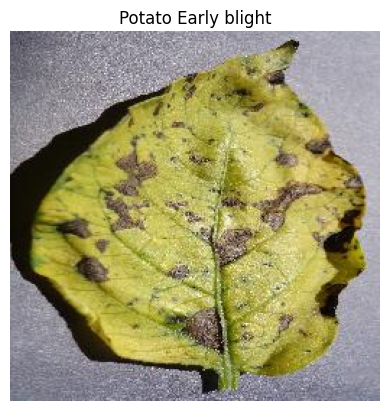

In [ ]:
potato_img = cv2.cvtColor(potato_img, cv2.COLOR_BGR2RGB)

plt.title('Potato Early blight')
plt.axis('off')
plt.imshow(potato_img)
plt.show()

In [12]:
def process_image(image_path, plant_label):
    img = cv2.imread(str(image_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))
    return img / 255.0, plant_label

In [13]:
def process_batch(images, label):
    results = []
    for image in images:
        results.append(process_image(image, label))
    return results

In [14]:
X_train, y_train = [], []

with ThreadPoolExecutor() as executor:
    futures = []
    for plant, images in plants_images_dict_train.items():
        futures.append(executor.submit(process_batch, images, class_dict[plant]))

    for future in futures:
        results = future.result()
        for img, label in results:
            X_train.append(img)
            y_train.append(label)

In [15]:
X_train = np.array(X_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.int32)

In [16]:
X_train

array([[[[0.39215687, 0.38431373, 0.43529412],
         [0.3647059 , 0.35686275, 0.40784314],
         [0.3529412 , 0.34509805, 0.39607844],
         ...,
         [0.6745098 , 0.6745098 , 0.72156864],
         [0.6862745 , 0.6862745 , 0.73333335],
         [0.69803923, 0.69803923, 0.74509805]],

        [[0.37254903, 0.3647059 , 0.41568628],
         [0.3764706 , 0.36862746, 0.41960785],
         [0.3254902 , 0.31764707, 0.36862746],
         ...,
         [0.6862745 , 0.6862745 , 0.7294118 ],
         [0.6745098 , 0.6745098 , 0.72156864],
         [0.67058825, 0.67058825, 0.7176471 ]],

        [[0.3372549 , 0.32941177, 0.38039216],
         [0.3764706 , 0.36862746, 0.41960785],
         [0.35686275, 0.34901962, 0.4       ],
         ...,
         [0.69411767, 0.69411767, 0.7411765 ],
         [0.6784314 , 0.6784314 , 0.72156864],
         [0.6666667 , 0.6666667 , 0.70980394]],

        ...,

        [[0.46666667, 0.49019608, 0.54509807],
         [0.45490196, 0.47843137, 0.53333336]

In [ ]:
X_train.shape

(15253, 224, 224, 3)

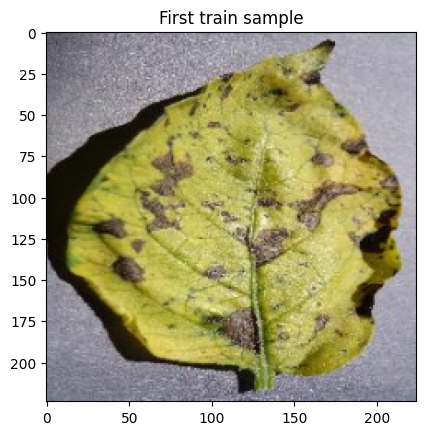

In [ ]:
plt.title('First train sample')
plt.imshow(X_train[0])
plt.show()

In [ ]:
y_train

array([0, 0, 0, ..., 7, 7, 7], dtype=int32)

In [17]:
data_dir_test = pathlib.Path('/content/drive/MyDrive/Magisterka/Datasets/New Plant Diseases Dataset(Augmented)/test/test')
data_dir_valid = pathlib.Path('/content/drive/MyDrive/Magisterka/Datasets/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid')

In [18]:
plants_images_dict_test = {}

test_data_paths = list(data_dir_test.glob('*.JPG')) + list(data_dir_test.glob('*.jpg'))

tmp_dict = {
    'Apple___Cedar_apple_rust': 'AppleCedarRust',
    'Apple___Apple_scab': 'AppleScab',
    'Corn_(maize)___Common_rust_': 'CornCommonRust',
    'Potato___Early_blight': 'PotatoEarlyBlight',
    'Potato___healthy': 'PotatoHealthy',
    'Tomato___Early_blight': 'TomatoEarlyBlight',
    'Tomato___healthy': 'TomatoHealthy',
    'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 'TomatoYellowCurlVirus',
}

for c in class_list:
    if match := tmp_dict.get(c):
        plants_images_dict_test[c] = [i for i in test_data_paths if match in str(i)]

del tmp_dict, test_data_paths

plants_images_dict_valid = {}
for c in class_list:
    plants_images_dict_valid[c] = list(data_dir_valid.glob(f'{c}/*.JPG')) + list(data_dir_valid.glob(f'{c}/*.jpg'))


In [19]:
print('Counted images by class (test set):')
{k: len(v) for k, v in plants_images_dict_test.items()}

Counted images by class (test set):


{'Potato___Early_blight': 5,
 'Apple___Cedar_apple_rust': 4,
 'Tomato___Early_blight': 6,
 'Corn_(maize)___Common_rust_': 3,
 'Tomato___healthy': 4,
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 6,
 'Apple___Apple_scab': 3,
 'Potato___healthy': 2}

In [20]:
print('Counted images by class (valid set):')
{k: len(v) for k, v in plants_images_dict_valid.items()}

Counted images by class (valid set):


{'Potato___Early_blight': 485,
 'Apple___Cedar_apple_rust': 440,
 'Tomato___Early_blight': 480,
 'Corn_(maize)___Common_rust_': 477,
 'Tomato___healthy': 481,
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 490,
 'Apple___Apple_scab': 504,
 'Potato___healthy': 456}

In [21]:
def process_test_image(args):
    plant, image = args
    img = cv2.imread(str(image))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))
    return img / 255.0, class_dict[plant]

In [22]:
X_test, y_test = [], []

all_test_images = [(plant, image) for plant, images in plants_images_dict_test.items() for image in images]

with ThreadPoolExecutor() as executor:
    test_results = list(executor.map(process_test_image, all_test_images))

for img, label in test_results:
    X_test.append(img)
    y_test.append(label)

In [23]:
X_valid, y_valid = [], []

with ThreadPoolExecutor() as executor:
    futures = []
    for plant, images in plants_images_dict_valid.items():
        futures.append(executor.submit(process_batch, images, class_dict[plant]))

    for future in futures:
        results = future.result()
        for img, label in results:
            X_valid.append(img)
            y_valid.append(label)

In [24]:
X_test = np.array(X_test, np.float32)
y_test = np.array(y_test, np.int32)

X_valid = np.array(X_valid, np.float32)
y_valid = np.array(y_valid, np.int32)

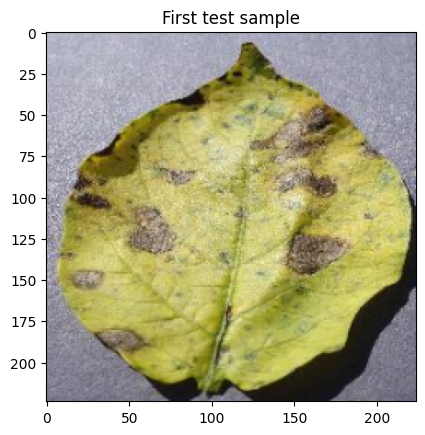

In [ ]:
plt.title('First test sample')
plt.imshow(X_test[0])
plt.show()

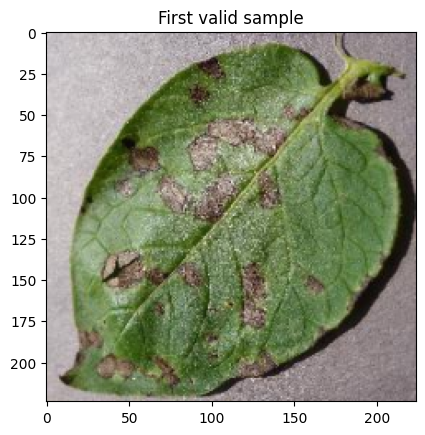

In [ ]:
plt.title('First valid sample')
plt.imshow(X_valid[0])
plt.show()

In [ ]:
print('Unique classes (iterators): {0[0]}\nNumber of unique elements per class {0[1]}'.
      format(np.unique(y_train, return_counts=True)))

Unique classes (iterators): [0 1 2 3 4 5 6 7]
Number of unique elements per class [1939 1760 1920 1907 1926 1961 2016 1824]


In [ ]:
print(f'Number of classes: {len(np.unique(y_train))}')

Number of classes: 8


In [ ]:
print(X_train.shape)
print(X_valid.shape)
print(X_test.shape)

(15253, 224, 224, 3)
(3813, 224, 224, 3)
(33, 224, 224, 3)


# Base architecture

## Model base

In [ ]:
model = Sequential([
    Input(shape=X_train.shape[1:]),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPool2D((2, 2)),

    Flatten(),
    Dense(128, activation='relu'),
    Dense(len(np.unique(y_train)), activation='softmax'),
])

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,424 (91.20 MB)

 Trainable params: 23,908,424 (91.20 MB)

 Non-trainable params: 0 (0.00 B)

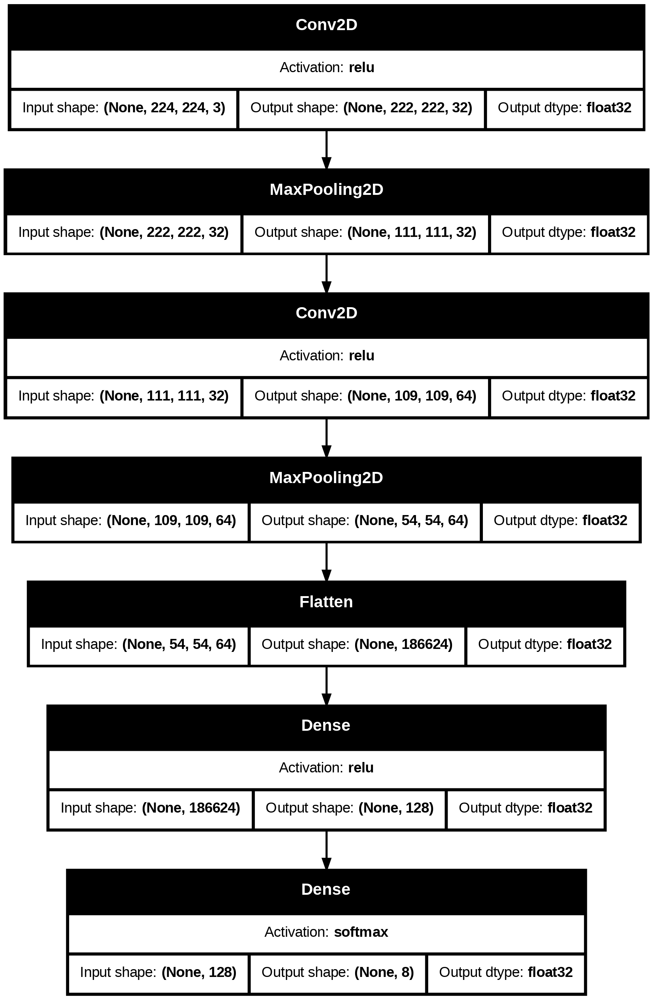

In [ ]:
try:
    plot_model(model, 'model1_base.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model1_base.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [25]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                  restore_best_weights=True, verbose=1)

epochs = 100
batch_size = 32

In [ ]:
%%time
history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - accuracy: 0.6844 - loss: 1.2745 - val_accuracy: 0.8935 - val_loss: 0.2980
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9549 - loss: 0.1335 - val_accuracy: 0.9591 - val_loss: 0.1279
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9835 - loss: 0.0521 - val_accuracy: 0.9567 - val_loss: 0.1229
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9876 - loss: 0.0375 - val_accuracy: 0.9190 - val_loss: 0.2503
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9806 - loss: 0.0529 - val_accuracy: 0.9544 - val_loss: 0.1494
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9930 - loss: 0.0215 - val_accuracy: 0.9570 - val_loss: 0.1589
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9870 - loss: 0.0373 - val_accuracy: 0.9701 - val_loss: 0.1123
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9897 - loss: 0.0314 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model1_base - loss: {loss}, accuracy: {acc}')

model1_base - loss: 0.5541610717773438, accuracy: 0.8787878751754761


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[0.5584469437599182,
 0.11758685111999512,
 0.0581330768764019,
 0.04740031063556671,
 0.04317108914256096,
 0.03375621140003204,
 0.028355369344353676,
 0.023437928408384323,
 0.026129577308893204,
 0.0018466601613909006,
 0.049572523683309555,
 0.03285064548254013,
 0.0291756484657526,
 0.02266819216310978,
 0.0020142728462815285,
 0.01468313205987215,
 0.024371352046728134,
 0.011537004262208939,
 0.039000947028398514,
 0.002806081436574459,
 0.007295437157154083,
 0.012701181694865227,
 0.016277562826871872,
 0.013948904350399971,
 0.0007073410088196397]

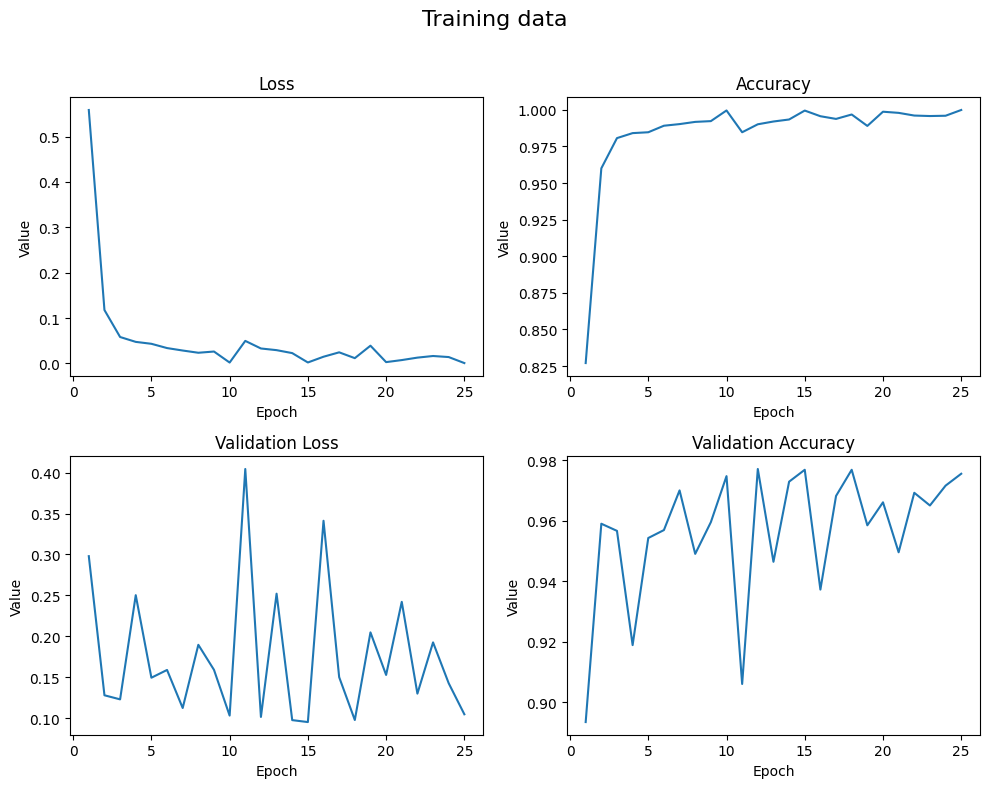

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

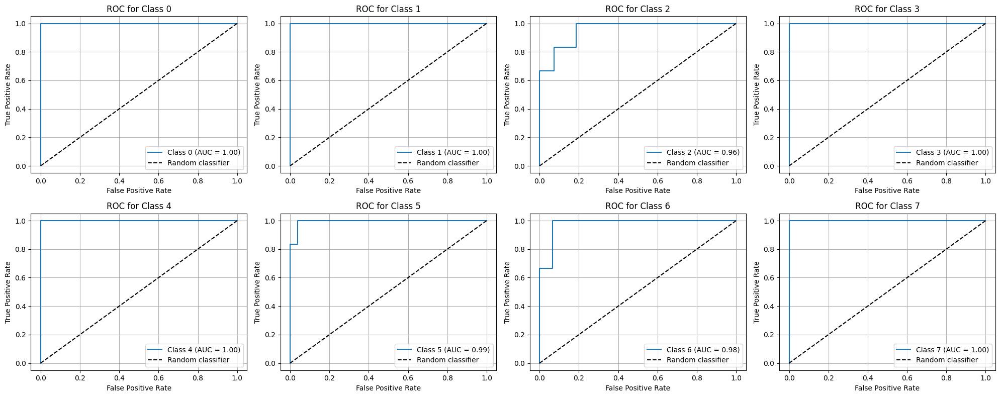

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

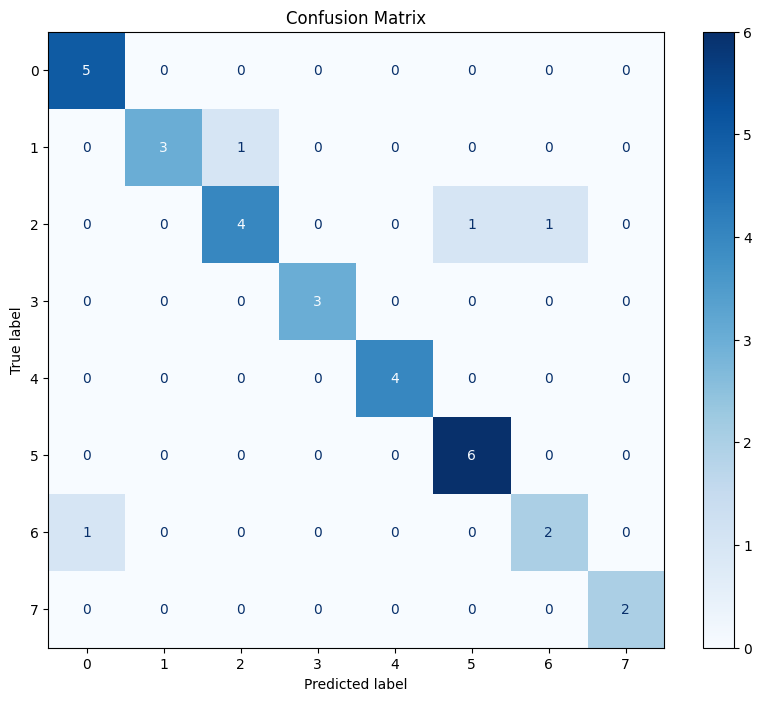

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.8787878787878788


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.83      1.00      0.91         5
           1       1.00      0.75      0.86         4
           2       0.80      0.67      0.73         6
           3       1.00      1.00      1.00         3
           4       1.00      1.00      1.00         4
           5       0.86      1.00      0.92         6
           6       0.67      0.67      0.67         3
           7       1.00      1.00      1.00         2

    accuracy                           0.88        33
   macro avg       0.89      0.89      0.89        33
weighted avg       0.88      0.88      0.88        33



## Model l1 = 0.01

In [26]:
input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu", kernel_regularizer=l1(0.01)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu", kernel_regularizer=l1(0.01)),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu", kernel_regularizer=l1(0.01)),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,424 (91.20 MB)

 Trainable params: 23,908,424 (91.20 MB)

 Non-trainable params: 0 (0.00 B)

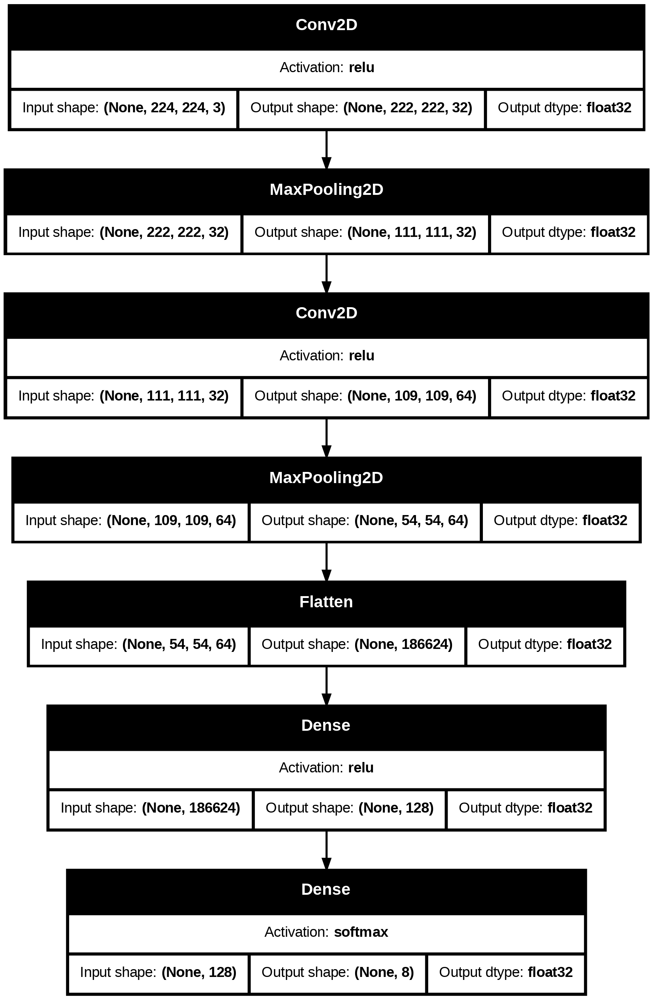

In [ ]:
try:
    plot_model(model, "model1_l1_001.png", show_dtype=True,
        show_shapes=True, show_layer_activations=True,)
    display(Image("model1_l1_001.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss", patience=10, restore_best_weights=True, verbose=1
)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - accuracy: 0.1445 - loss: 69.9867 - val_accuracy: 0.1322 - val_loss: 29.6266
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.1247 - loss: 30.3760 - val_accuracy: 0.1322 - val_loss: 30.4342
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.1306 - loss: 30.3627 - val_accuracy: 0.1322 - val_loss: 30.2012
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.1257 - loss: 30.3573 - val_accuracy: 0.1322 - val_loss: 30.2598
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.1338 - loss: 30.3647 - val_accuracy: 0.1322 - val_loss: 30.0496
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.1260 - loss: 30.3649 - val_accuracy: 0.1322 - val_loss: 30.2857
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.1365 - loss: 30.3591 - val_accuracy: 0.1322 - val_loss: 30.6642
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.1284 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_l1_001 - loss: {loss}, accuracy: {acc}")

model1_l1_001 - loss: 29.622499465942383, accuracy: 0.09090909361839294


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[39.534690856933594,
 30.36452865600586,
 30.363367080688477,
 30.35773468017578,
 30.35978126525879,
 30.363618850708008,
 30.36180305480957,
 30.364490509033203,
 30.36288833618164,
 30.3614559173584,
 30.362234115600586]

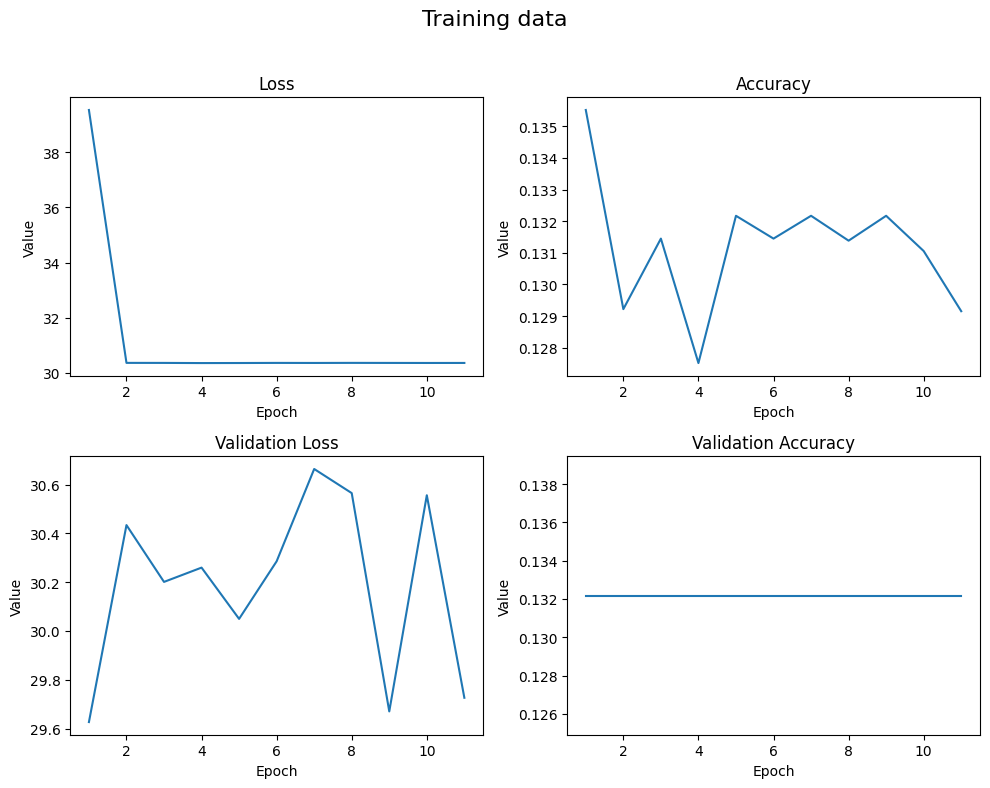

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

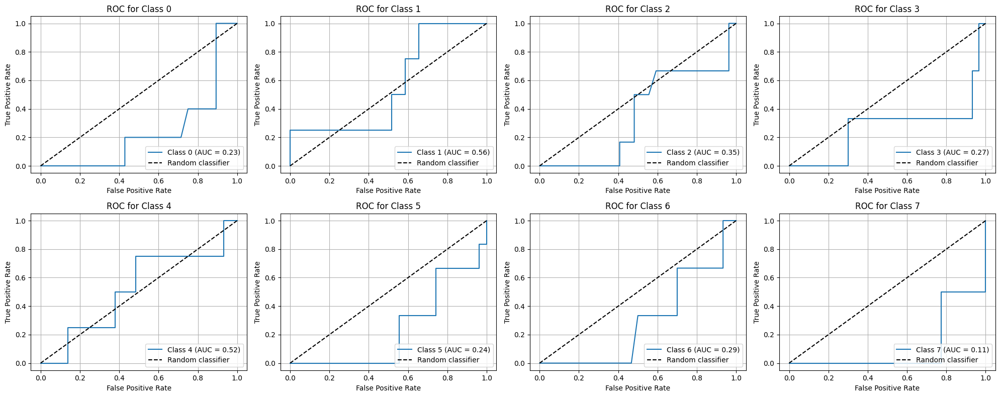

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

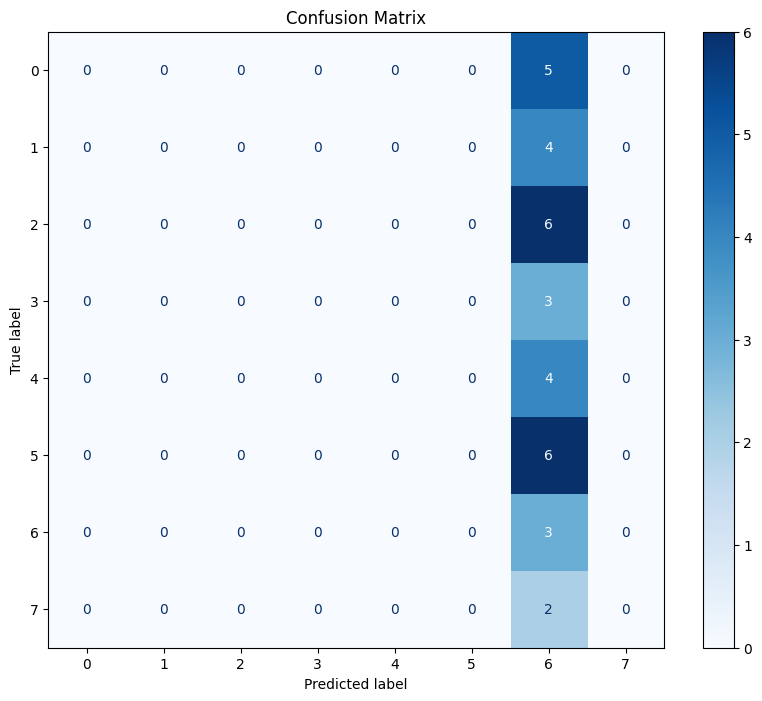

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.09090909090909091


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         6
           6       0.09      1.00      0.17         3
           7       0.00      0.00      0.00         2

    accuracy                           0.09        33
   macro avg       0.01      0.12      0.02        33
weighted avg       0.01      0.09      0.02        33



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model l1 = 0.001

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu", kernel_regularizer=l1(0.001)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu", kernel_regularizer=l1(0.001)),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu", kernel_regularizer=l1(0.001)),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,424 (91.20 MB)

 Trainable params: 23,908,424 (91.20 MB)

 Non-trainable params: 0 (0.00 B)

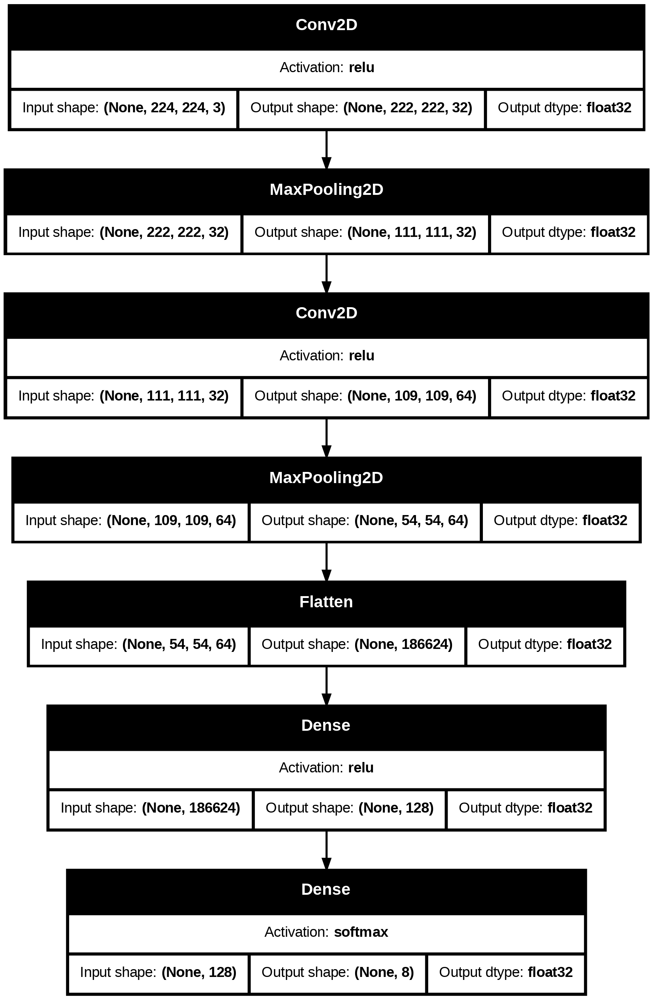

In [ ]:
try:
    plot_model(model, "model1_l1_0001.png", show_dtype=True,
        show_shapes=True, show_layer_activations=True,)
    display(Image("model1_l1_0001.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - accuracy: 0.4181 - loss: 11.2973 - val_accuracy: 0.5631 - val_loss: 4.8826
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.6098 - loss: 4.6075 - val_accuracy: 0.6557 - val_loss: 4.3531
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.6931 - loss: 4.3422 - val_accuracy: 0.7440 - val_loss: 4.0621
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7637 - loss: 4.0568 - val_accuracy: 0.8104 - val_loss: 3.8622
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7860 - loss: 3.8814 - val_accuracy: 0.7805 - val_loss: 3.8237
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7928 - loss: 3.8184 - val_accuracy: 0.8078 - val_loss: 3.7874
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8026 - loss: 3.7793 - val_accuracy: 0.8101 - val_loss: 3.7793
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7998 - loss: 3.7471 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_l1_0001 - loss: {loss}, accuracy: {acc}")

model1_l1_0001 - loss: 3.993058681488037, accuracy: 0.7878788113594055


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[6.3983073234558105,
 4.518216609954834,
 4.252377033233643,
 3.9913198947906494,
 3.8641738891601562,
 3.8089959621429443,
 3.7722952365875244,
 3.7300877571105957,
 3.7490601539611816,
 3.703747272491455,
 3.6873273849487305,
 3.666147232055664,
 3.633549690246582,
 3.6230573654174805,
 3.612387180328369,
 3.604342222213745,
 3.6002721786499023,
 3.5785958766937256,
 3.5593581199645996,
 3.5779590606689453,
 3.580568790435791,
 3.591181516647339,
 3.549527168273926,
 3.5685293674468994,
 3.5602164268493652,
 3.5473520755767822,
 3.534998655319214,
 3.548473596572876,
 3.5304036140441895,
 3.557953357696533,
 3.5383996963500977,
 3.542741537094116,
 3.5482277870178223,
 3.532277822494507,
 3.5523838996887207]

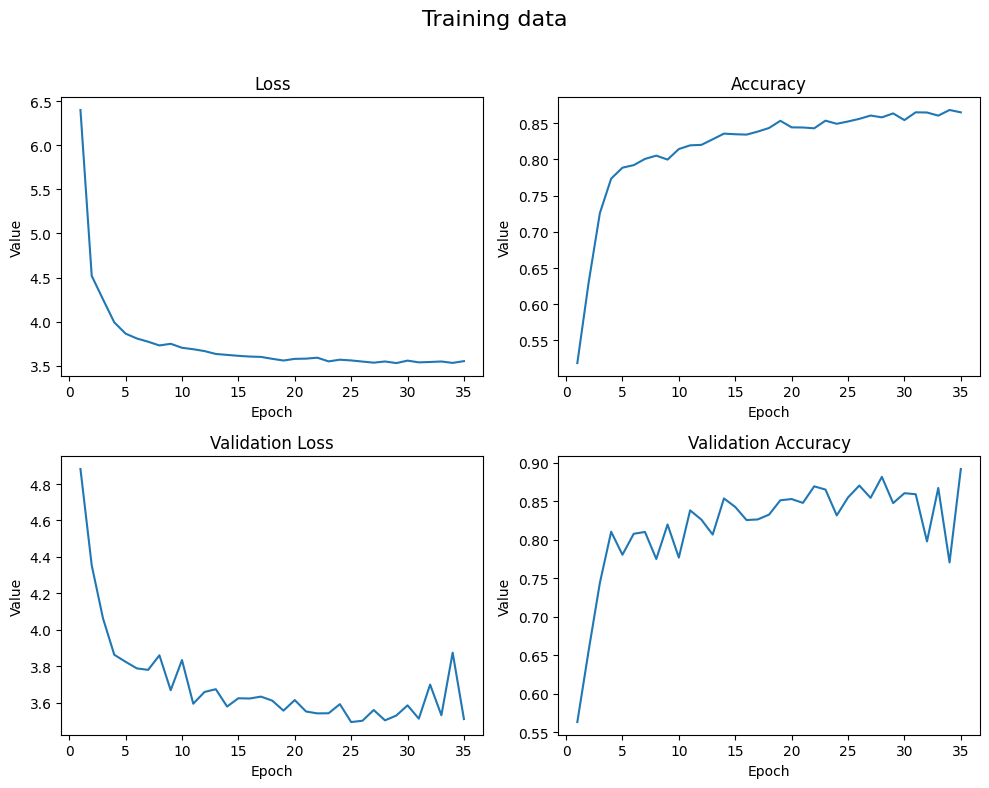

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

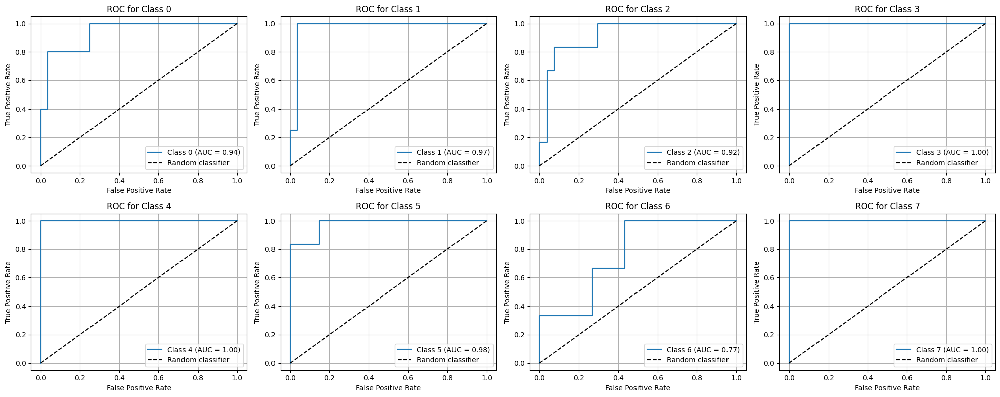

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

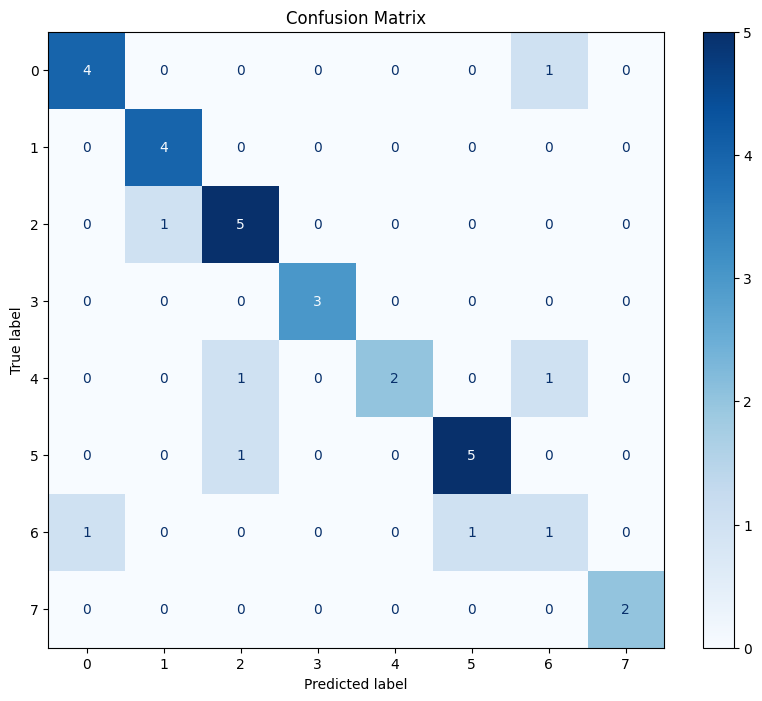

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.7878787878787878


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.80      0.80         5
           1       0.80      1.00      0.89         4
           2       0.71      0.83      0.77         6
           3       1.00      1.00      1.00         3
           4       1.00      0.50      0.67         4
           5       0.83      0.83      0.83         6
           6       0.33      0.33      0.33         3
           7       1.00      1.00      1.00         2

    accuracy                           0.79        33
   macro avg       0.81      0.79      0.79        33
weighted avg       0.80      0.79      0.78        33



## Model l2 = 0.01

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu", kernel_regularizer=l2(0.01)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu", kernel_regularizer=l2(0.01)),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu", kernel_regularizer=l2(0.01)),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,424 (91.20 MB)

 Trainable params: 23,908,424 (91.20 MB)

 Non-trainable params: 0 (0.00 B)

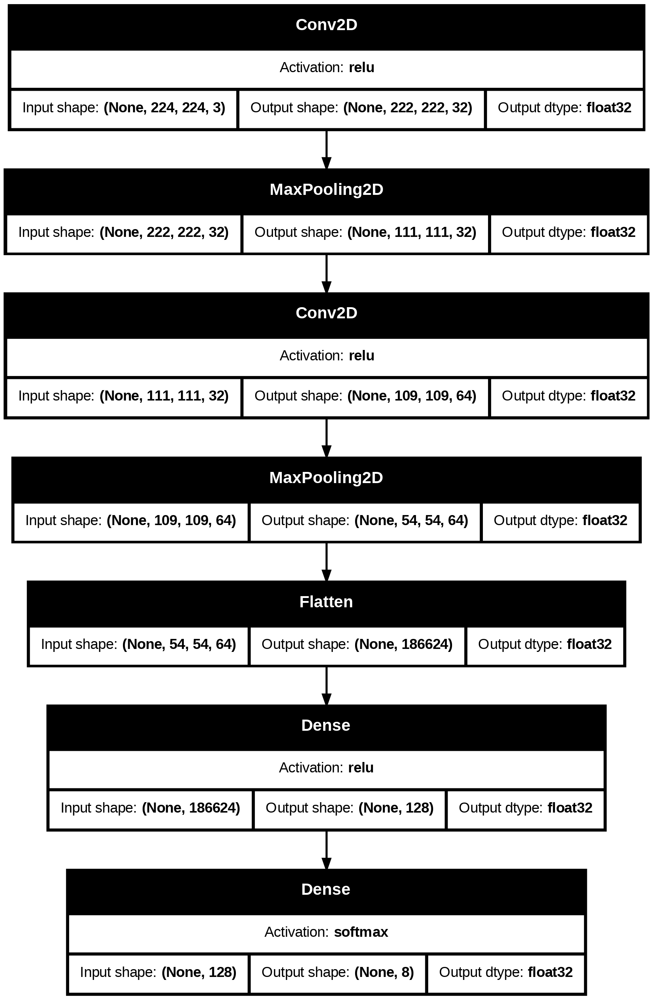

In [ ]:
try:
    plot_model(
        model,
        "model1_l2_001.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_l2_001.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - accuracy: 0.6731 - loss: 2.6569 - val_accuracy: 0.8314 - val_loss: 1.0222
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8678 - loss: 0.9244 - val_accuracy: 0.9103 - val_loss: 0.7846
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9058 - loss: 0.7331 - val_accuracy: 0.8463 - val_loss: 0.8317
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.8867 - loss: 0.7828 - val_accuracy: 0.8930 - val_loss: 0.6741
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9090 - loss: 0.6371 - val_accuracy: 0.9213 - val_loss: 0.5742
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9257 - loss: 0.5645 - val_accuracy: 0.9200 - val_loss: 0.5708
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9171 - loss: 0.5784 - val_accuracy: 0.9305 - val_loss: 0.5318
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9149 - loss: 0.5801 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_l2_001 - loss: {loss}, accuracy: {acc}")

model1_l2_001 - loss: 0.8249408006668091, accuracy: 0.8181818127632141


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[1.519822597503662,
 0.8849939107894897,
 0.7444560527801514,
 0.711175262928009,
 0.6517190933227539,
 0.5692446827888489,
 0.5709981918334961,
 0.5588675141334534,
 0.5364832282066345,
 0.5072091221809387,
 0.5136973857879639,
 0.5170558094978333,
 0.47527486085891724,
 0.47503525018692017,
 0.4694288671016693,
 0.4440807104110718,
 0.4641304612159729,
 0.4656634032726288,
 0.4292082190513611,
 0.4108336865901947,
 0.41317301988601685,
 0.42401519417762756,
 0.4215411841869354,
 0.4061053395271301,
 0.41022953391075134,
 0.3975283205509186,
 0.4201214909553528,
 0.3820033073425293,
 0.3780190050601959,
 0.4173427224159241,
 0.3795844316482544,
 0.3837396502494812,
 0.3766855001449585,
 0.38006138801574707,
 0.3760546147823334,
 0.3688097298145294,
 0.37047696113586426,
 0.37875568866729736,
 0.36566871404647827,
 0.36469805240631104,
 0.36499616503715515,
 0.3719010055065155,
 0.35633552074432373,
 0.35819461941719055,
 0.365544855594635,
 0.3495585024356842,
 0.35356518626213074,
 0

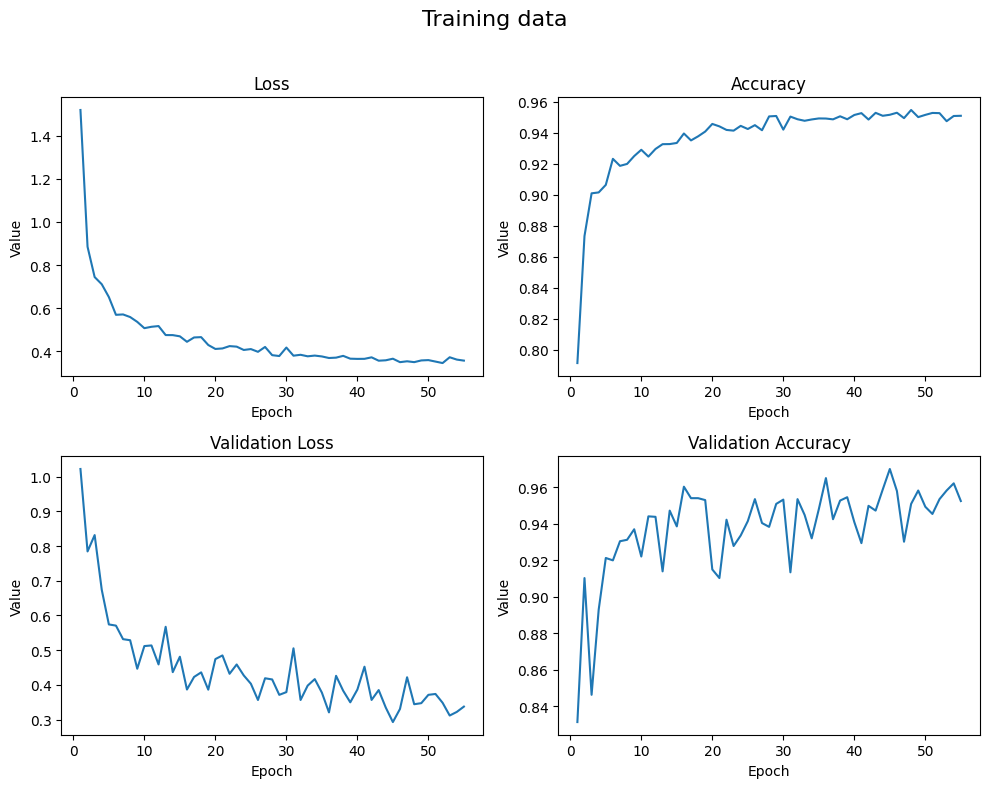

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

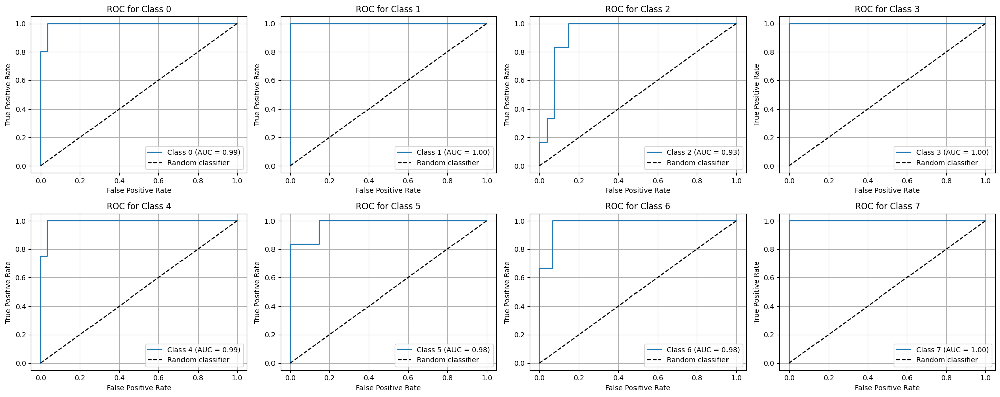

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

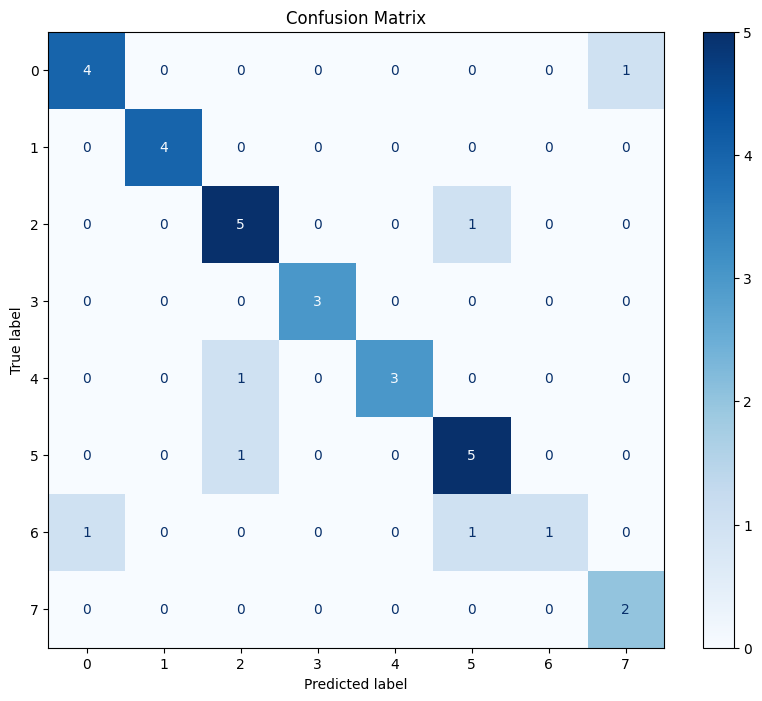

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.8181818181818182


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.80      0.80         5
           1       1.00      1.00      1.00         4
           2       0.71      0.83      0.77         6
           3       1.00      1.00      1.00         3
           4       1.00      0.75      0.86         4
           5       0.71      0.83      0.77         6
           6       1.00      0.33      0.50         3
           7       0.67      1.00      0.80         2

    accuracy                           0.82        33
   macro avg       0.86      0.82      0.81        33
weighted avg       0.85      0.82      0.81        33



## Model l2 = 0.001

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu", kernel_regularizer=l2(0.001)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu", kernel_regularizer=l2(0.001)),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu", kernel_regularizer=l2(0.001)),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,424 (91.20 MB)

 Trainable params: 23,908,424 (91.20 MB)

 Non-trainable params: 0 (0.00 B)

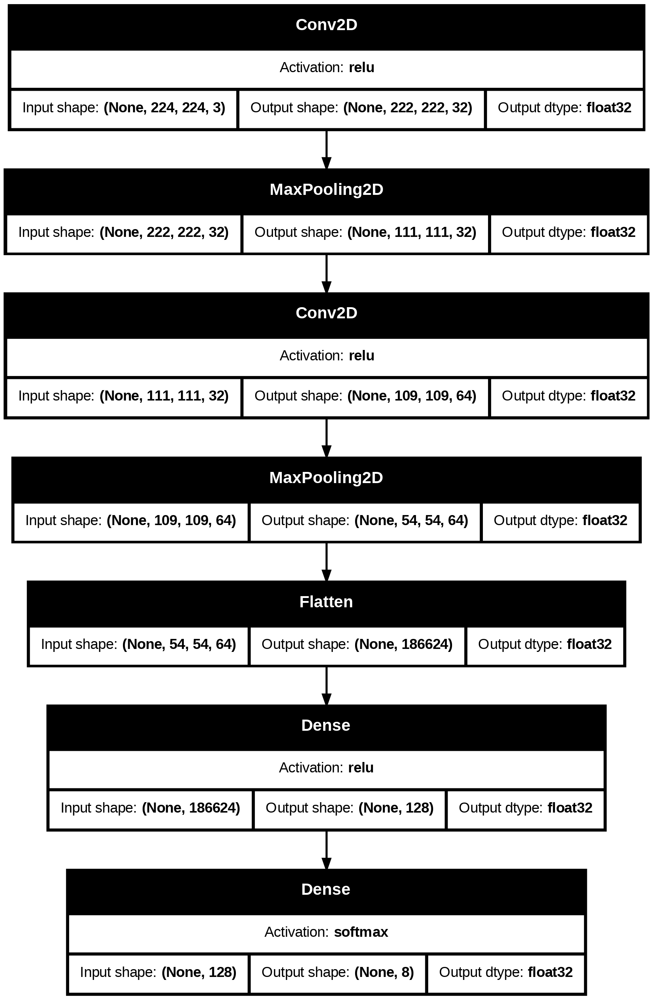

In [ ]:
try:
    plot_model(
        model,
        "model1_l2_0001.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_l2_0001.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - accuracy: 0.6998 - loss: 1.5715 - val_accuracy: 0.8990 - val_loss: 0.5359
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9091 - loss: 0.5251 - val_accuracy: 0.9184 - val_loss: 0.4880
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9314 - loss: 0.4501 - val_accuracy: 0.9531 - val_loss: 0.3598
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9403 - loss: 0.3942 - val_accuracy: 0.9344 - val_loss: 0.4029
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9566 - loss: 0.3362 - val_accuracy: 0.9027 - val_loss: 0.4850
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9493 - loss: 0.3511 - val_accuracy: 0.9536 - val_loss: 0.3184
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9592 - loss: 0.3096 - val_accuracy: 0.9510 - val_loss: 0.3362
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9589 - loss: 0.3126 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_l2_0001 - loss: {loss}, accuracy: {acc}")

model1_l2_0001 - loss: 0.5524924397468567, accuracy: 0.8787878751754761


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[0.9148336052894592,
 0.5102324485778809,
 0.4379616677761078,
 0.3930128216743469,
 0.33700329065322876,
 0.3487386405467987,
 0.3354303240776062,
 0.3360508978366852,
 0.2985193729400635,
 0.29125159978866577,
 0.28899386525154114,
 0.2605167329311371,
 0.2580677270889282,
 0.2592615485191345,
 0.2553958296775818,
 0.2448052316904068,
 0.23472324013710022,
 0.22055405378341675,
 0.237937793135643,
 0.21823523938655853,
 0.22171707451343536,
 0.2154710739850998,
 0.2363886535167694,
 0.19028745591640472,
 0.22555847465991974,
 0.20240716636180878,
 0.21390606462955475,
 0.19338469207286835,
 0.21103842556476593,
 0.20287494361400604,
 0.20474930107593536,
 0.2076428085565567,
 0.18696658313274384,
 0.18589256703853607,
 0.20153607428073883,
 0.18132402002811432,
 0.18978795409202576,
 0.17046961188316345,
 0.21207059919834137,
 0.18184849619865417,
 0.1931045949459076,
 0.1801220327615738,
 0.18721941113471985]

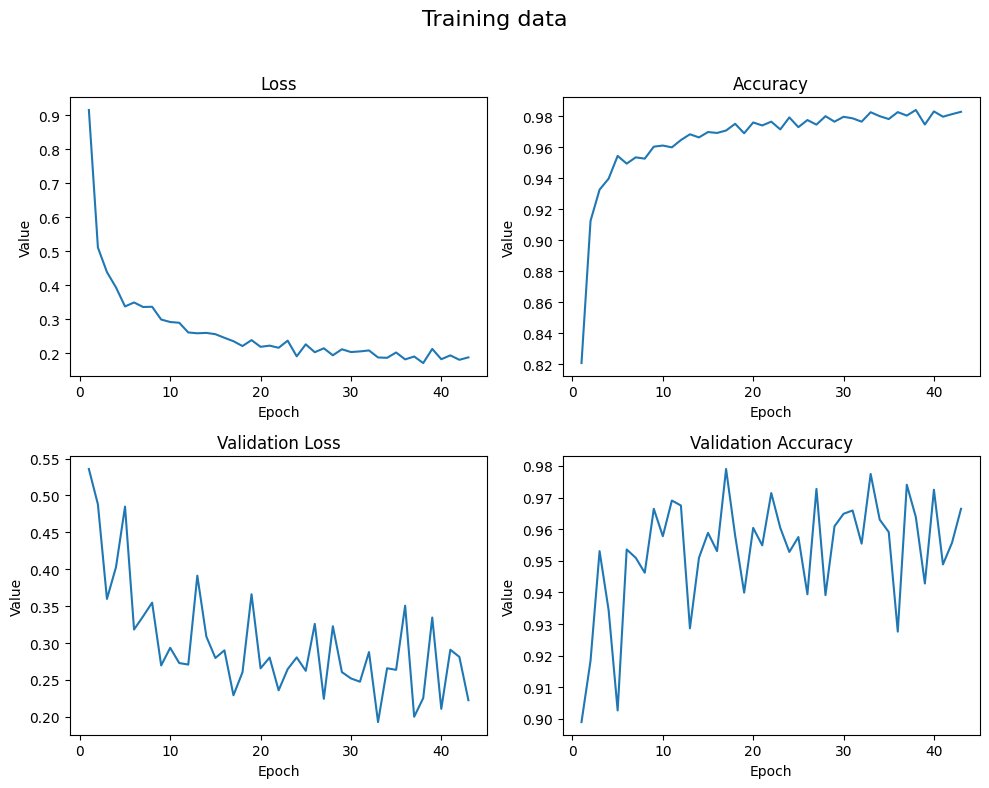

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

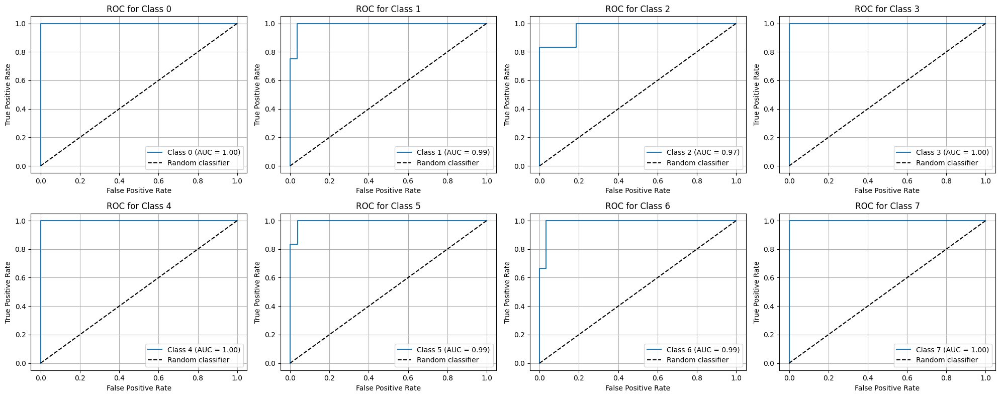

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

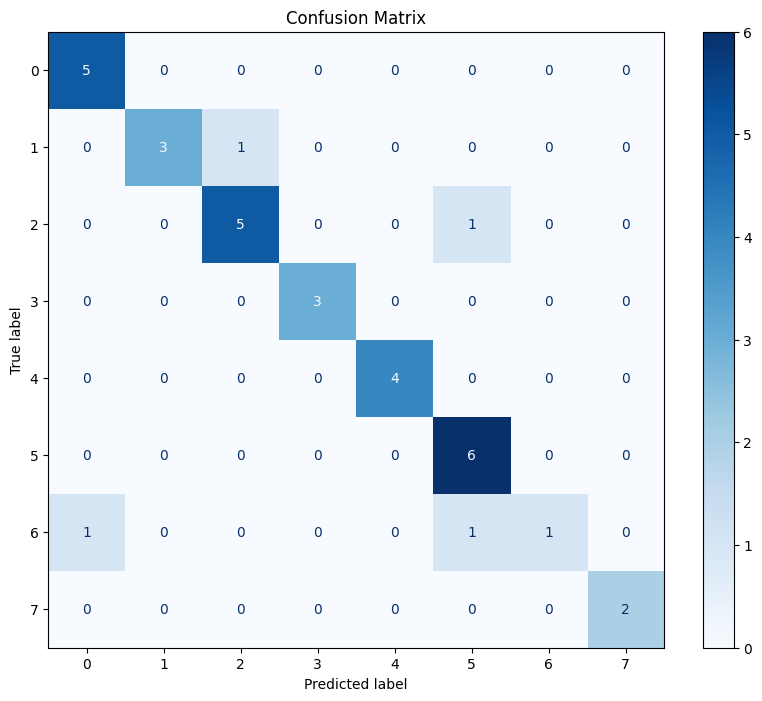

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.8787878787878788


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.83      1.00      0.91         5
           1       1.00      0.75      0.86         4
           2       0.83      0.83      0.83         6
           3       1.00      1.00      1.00         3
           4       1.00      1.00      1.00         4
           5       0.75      1.00      0.86         6
           6       1.00      0.33      0.50         3
           7       1.00      1.00      1.00         2

    accuracy                           0.88        33
   macro avg       0.93      0.86      0.87        33
weighted avg       0.90      0.88      0.87        33



## Model dropout = 0.2

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.2),
    Conv2D(64, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.2),
    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.2),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,424 (91.20 MB)

 Trainable params: 23,908,424 (91.20 MB)

 Non-trainable params: 0 (0.00 B)

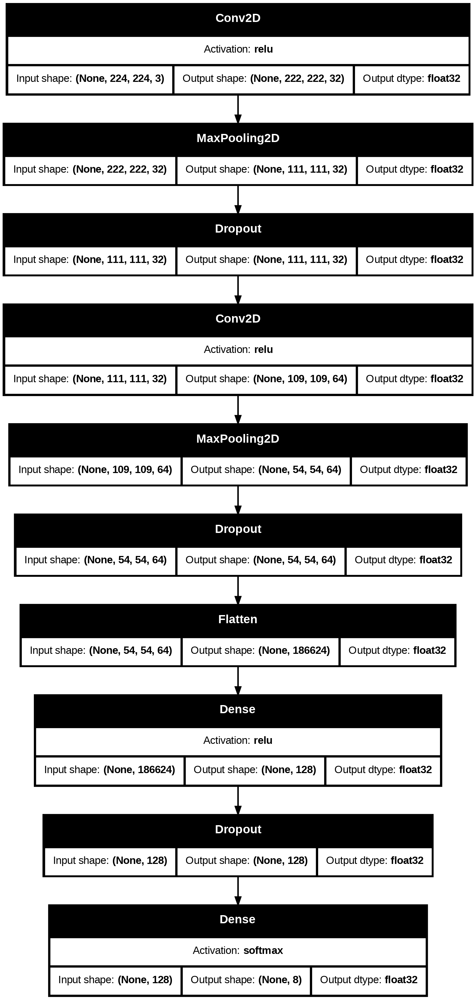

In [ ]:
try:
    plot_model(
        model,
        "model1_dropout_02.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_dropout_02.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - accuracy: 0.5978 - loss: 1.7572 - val_accuracy: 0.9192 - val_loss: 0.2510
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9116 - loss: 0.2543 - val_accuracy: 0.9336 - val_loss: 0.1951
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9499 - loss: 0.1567 - val_accuracy: 0.9612 - val_loss: 0.1066
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9640 - loss: 0.1065 - val_accuracy: 0.9761 - val_loss: 0.0772
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9736 - loss: 0.0786 - val_accuracy: 0.9593 - val_loss: 0.1225
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9771 - loss: 0.0651 - val_accuracy: 0.9759 - val_loss: 0.0728
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9832 - loss: 0.0482 - val_accuracy: 0.9565 - val_loss: 0.1382
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9778 - loss: 0.0660 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_dropout_02 - loss: {loss}, accuracy: {acc}")

model1_dropout_02 - loss: 0.26598653197288513, accuracy: 0.8787878751754761


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[0.8019249439239502,
 0.22988857328891754,
 0.1518641859292984,
 0.09871792048215866,
 0.08388005197048187,
 0.060967691242694855,
 0.06043752655386925,
 0.0625707358121872,
 0.042168185114860535,
 0.043661829084157944,
 0.06378352642059326,
 0.030628621578216553,
 0.03582409396767616,
 0.03787609562277794,
 0.0410534143447876,
 0.03600246459245682]

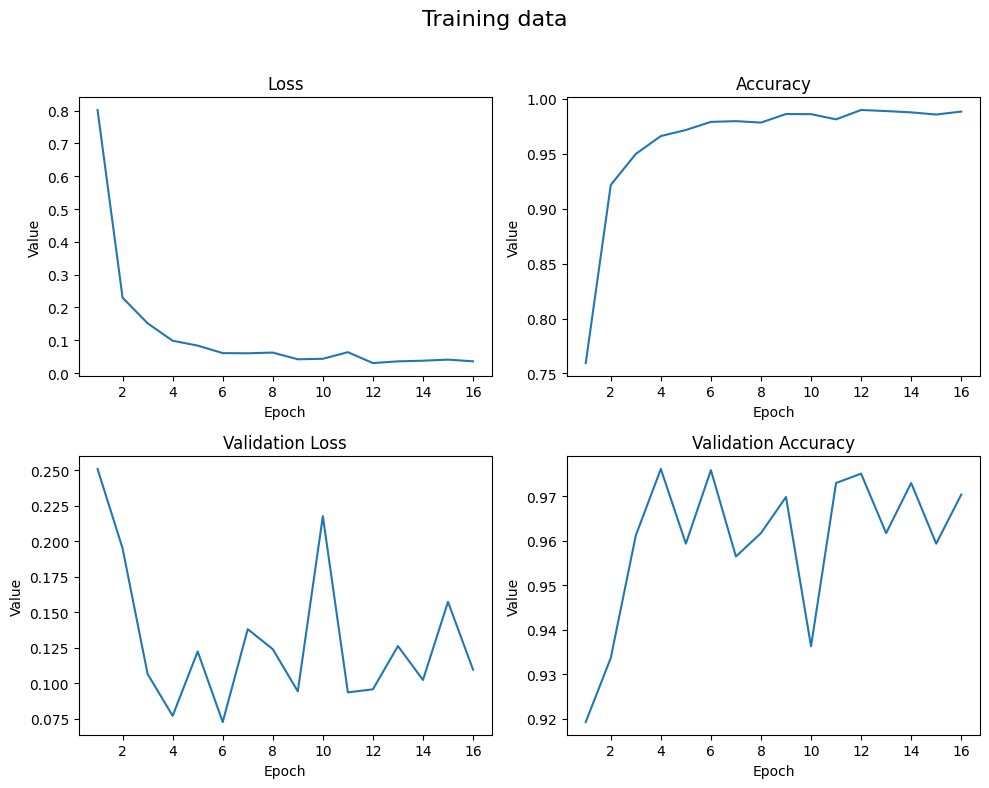

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

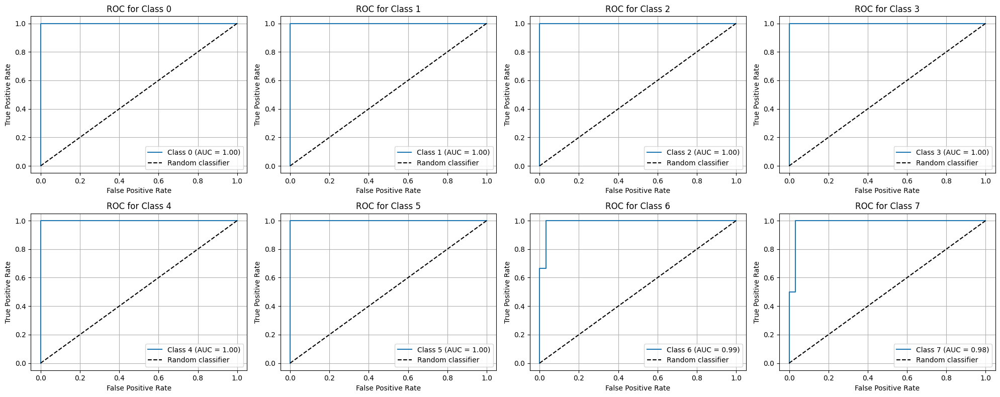

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

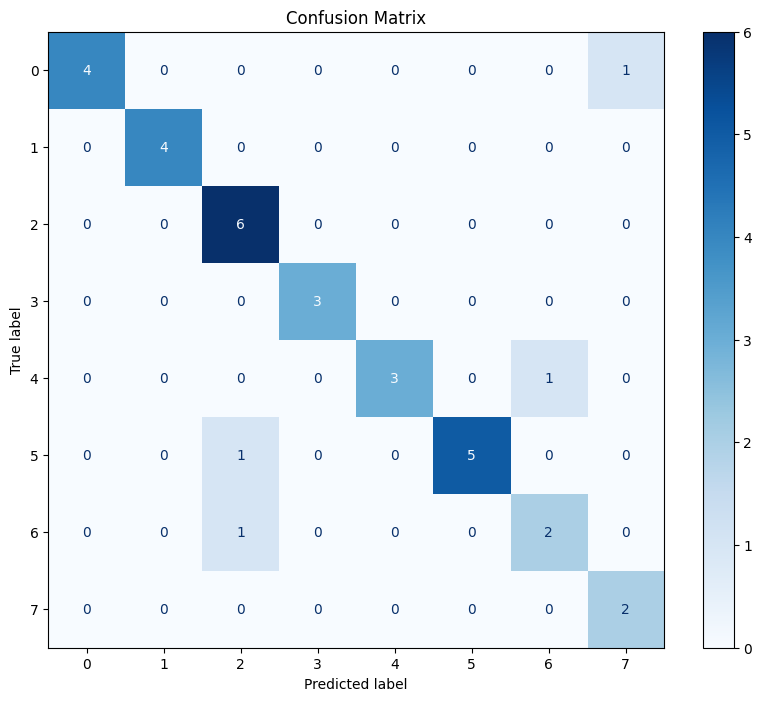

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.8787878787878788


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.80      0.89         5
           1       1.00      1.00      1.00         4
           2       0.75      1.00      0.86         6
           3       1.00      1.00      1.00         3
           4       1.00      0.75      0.86         4
           5       1.00      0.83      0.91         6
           6       0.67      0.67      0.67         3
           7       0.67      1.00      0.80         2

    accuracy                           0.88        33
   macro avg       0.89      0.88      0.87        33
weighted avg       0.90      0.88      0.88        33



## Model dropout = 0.3

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.3),
    Conv2D(64, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.3),
    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.3),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_6 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,424 (91.20 MB)

 Trainable params: 23,908,424 (91.20 MB)

 Non-trainable params: 0 (0.00 B)

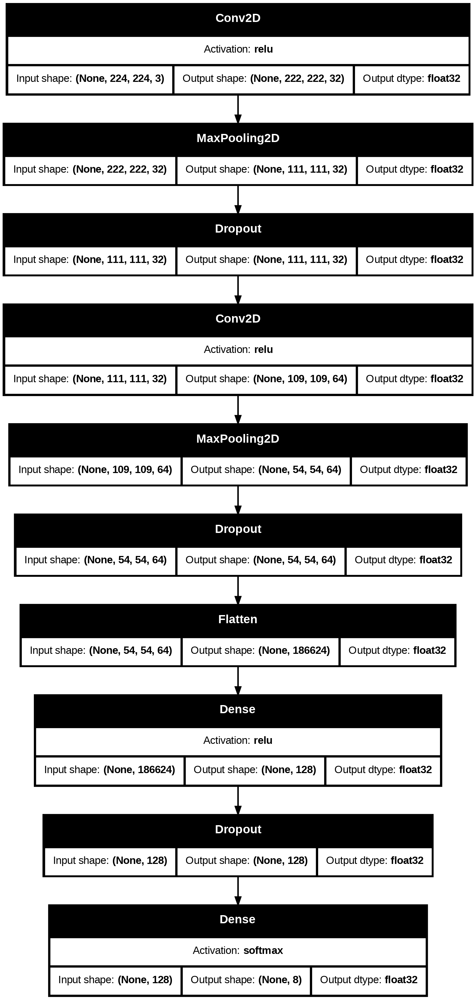

In [ ]:
try:
    plot_model(
        model,
        "model1_dropout_03.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_dropout_03.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - accuracy: 0.5513 - loss: 1.9266 - val_accuracy: 0.9100 - val_loss: 0.2848
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9155 - loss: 0.2606 - val_accuracy: 0.9384 - val_loss: 0.1946
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9401 - loss: 0.1789 - val_accuracy: 0.9415 - val_loss: 0.1662
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9591 - loss: 0.1152 - val_accuracy: 0.9651 - val_loss: 0.1060
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9683 - loss: 0.0907 - val_accuracy: 0.9670 - val_loss: 0.1075
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9661 - loss: 0.0962 - val_accuracy: 0.9583 - val_loss: 0.1446
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9768 - loss: 0.0707 - val_accuracy: 0.9523 - val_loss: 0.1442
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9786 - loss: 0.0627 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_dropout_03 - loss: {loss}, accuracy: {acc}")

model1_dropout_03 - loss: 0.5221914052963257, accuracy: 0.9090909361839294


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[0.8713124990463257,
 0.24988888204097748,
 0.16531313955783844,
 0.11608543246984482,
 0.09008996933698654,
 0.08863469958305359,
 0.06859840452671051,
 0.07093235850334167,
 0.06099129840731621,
 0.0718575045466423,
 0.044009868055582047,
 0.04791455715894699,
 0.06745102256536484,
 0.04458191618323326,
 0.053384024649858475,
 0.032883692532777786,
 0.04547432065010071,
 0.05743083730340004,
 0.04711516574025154,
 0.044684797525405884,
 0.03952567279338837,
 0.03356320410966873,
 0.023323876783251762,
 0.046375446021556854,
 0.0471593476831913,
 0.03213782608509064,
 0.02667071856558323,
 0.020423656329512596]

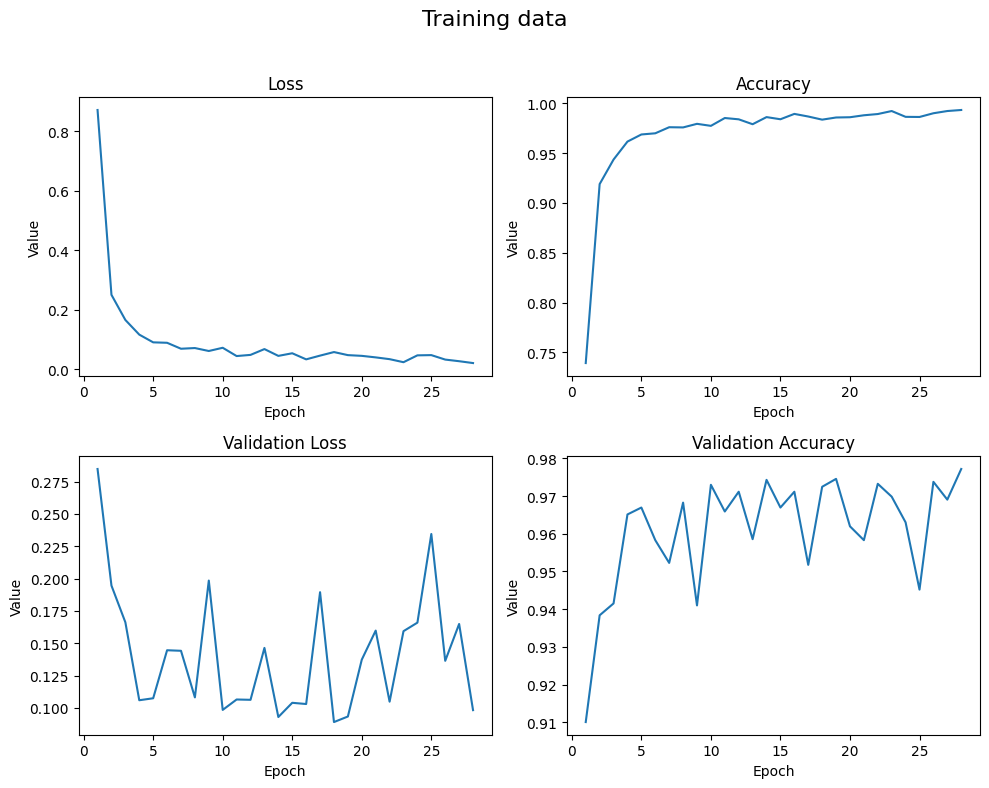

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

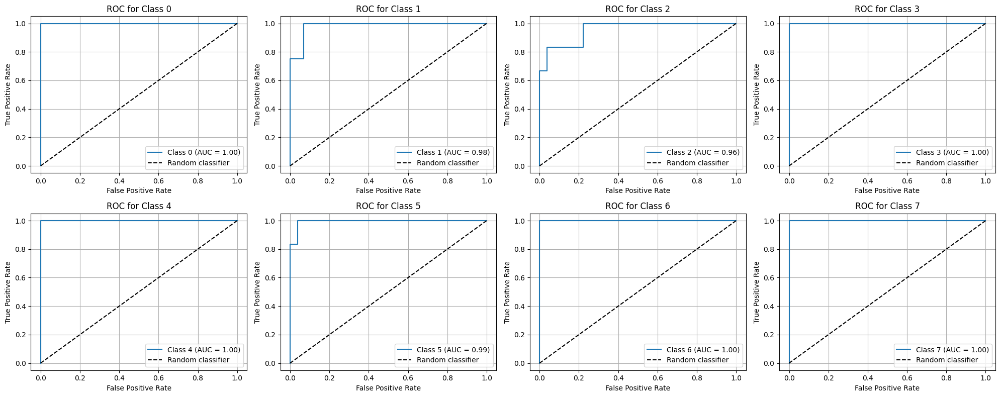

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

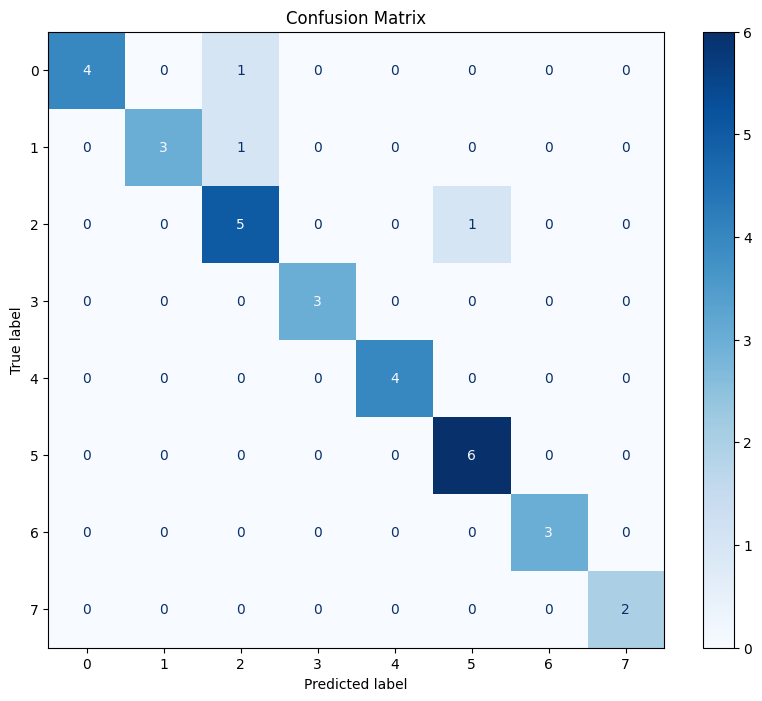

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.9090909090909091


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.80      0.89         5
           1       1.00      0.75      0.86         4
           2       0.71      0.83      0.77         6
           3       1.00      1.00      1.00         3
           4       1.00      1.00      1.00         4
           5       0.86      1.00      0.92         6
           6       1.00      1.00      1.00         3
           7       1.00      1.00      1.00         2

    accuracy                           0.91        33
   macro avg       0.95      0.92      0.93        33
weighted avg       0.92      0.91      0.91        33



## Model dropout = 0.4

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.4),
    Conv2D(64, (3, 3), activation="relu"),
    MaxPool2D((2, 2)),
    Dropout(0.4),
    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.4),
    Dense(num_classes, activation="softmax"),
])

In [ ]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [ ]:
model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_14 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_15 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_15 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_7 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,424 (91.20 MB)

 Trainable params: 23,908,424 (91.20 MB)

 Non-trainable params: 0 (0.00 B)

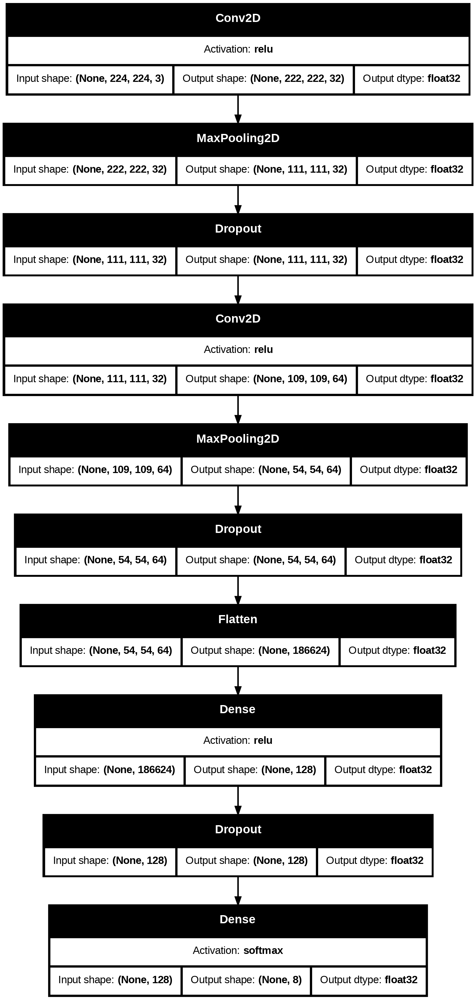

In [ ]:
try:
    plot_model(
        model,
        "model1_dropout_04.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_dropout_04.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - accuracy: 0.4586 - loss: 2.7012 - val_accuracy: 0.7729 - val_loss: 0.6661
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.8428 - loss: 0.4478 - val_accuracy: 0.9208 - val_loss: 0.2312
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9101 - loss: 0.2627 - val_accuracy: 0.9496 - val_loss: 0.1657
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9436 - loss: 0.1635 - val_accuracy: 0.9295 - val_loss: 0.2040
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.9476 - loss: 0.1531 - val_accuracy: 0.9578 - val_loss: 0.1159
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9620 - loss: 0.1113 - val_accuracy: 0.9284 - val_loss: 0.1989
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9573 - loss: 0.1254 - val_accuracy: 0.9654 - val_loss: 0.0937
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9700 - loss: 0.0915 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_dropout_04 - loss: {loss}, accuracy: {acc}")

model1_dropout_04 - loss: 0.4726112186908722, accuracy: 0.8787878751754761


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data["loss"]

[1.2484393119812012,
 0.39650511741638184,
 0.2623884975910187,
 0.16529273986816406,
 0.14593426883220673,
 0.12204526364803314,
 0.12280292809009552,
 0.09532934427261353,
 0.08675925433635712,
 0.09195852279663086,
 0.0744875892996788,
 0.07632280141115189,
 0.08873903751373291,
 0.05888671800494194,
 0.06154971942305565,
 0.06695158034563065,
 0.06160043552517891,
 0.04678997024893761,
 0.06540653109550476,
 0.06291421502828598,
 0.04915136843919754,
 0.043806836009025574,
 0.04751576855778694,
 0.04627407714724541,
 0.04508679732680321,
 0.036972980946302414,
 0.04877675324678421,
 0.052655111998319626]

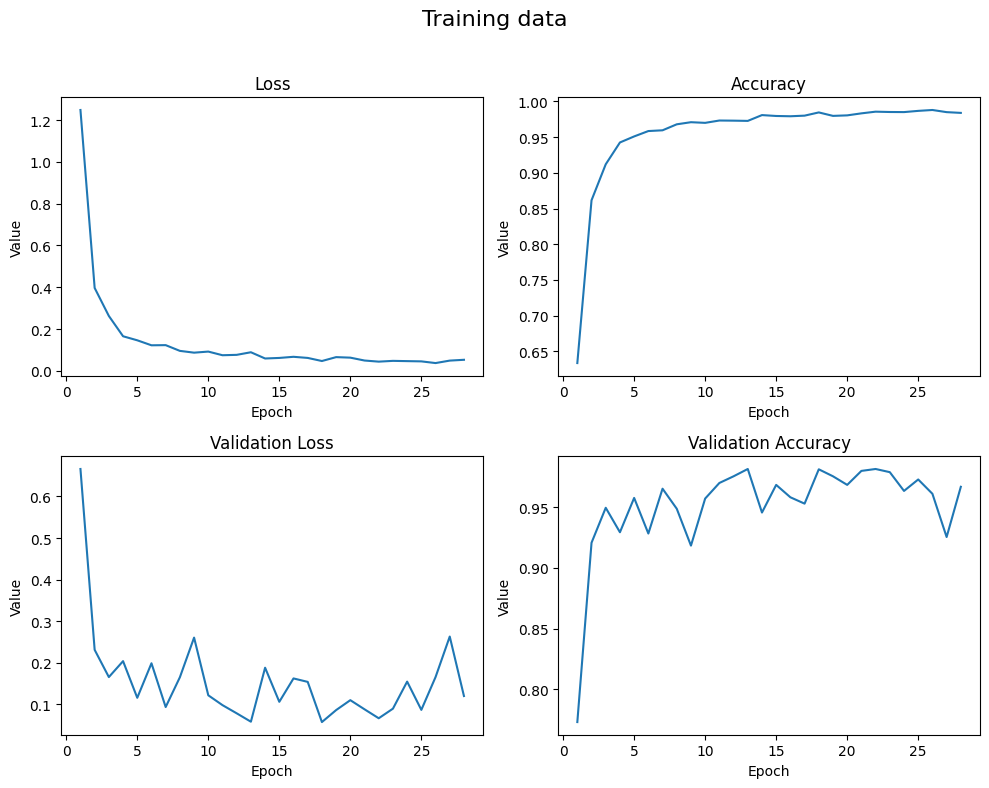

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

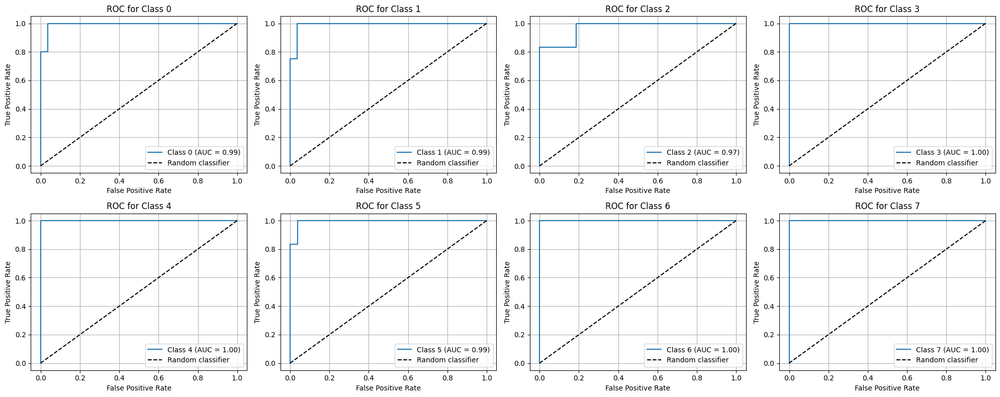

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

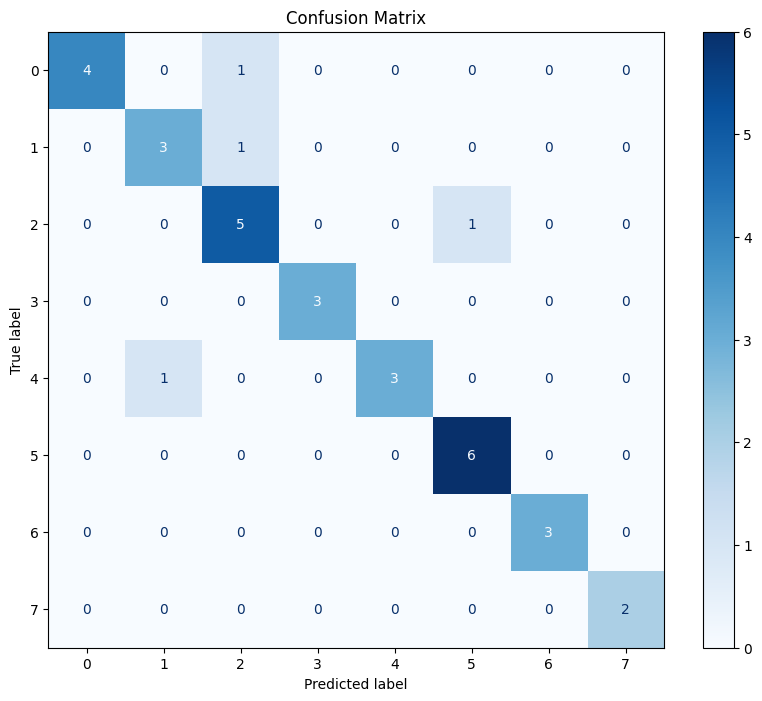

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap="Blues", colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.8787878787878788


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.80      0.89         5
           1       0.75      0.75      0.75         4
           2       0.71      0.83      0.77         6
           3       1.00      1.00      1.00         3
           4       1.00      0.75      0.86         4
           5       0.86      1.00      0.92         6
           6       1.00      1.00      1.00         3
           7       1.00      1.00      1.00         2

    accuracy                           0.88        33
   macro avg       0.92      0.89      0.90        33
weighted avg       0.89      0.88      0.88        33



## Model batch normalization

In [27]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation="relu"),
    BatchNormalization(),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu"),
    BatchNormalization(),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu"),
    BatchNormalization(),
    Dense(num_classes, activation="softmax"),
])

In [28]:
model.compile(
    optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"]
)

In [29]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 222, 222, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 109, 109, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,909,320 (91.21 MB)

 Trainable params: 23,908,872 (91.21 MB)

 Non-trainable params: 448 (1.75 KB)

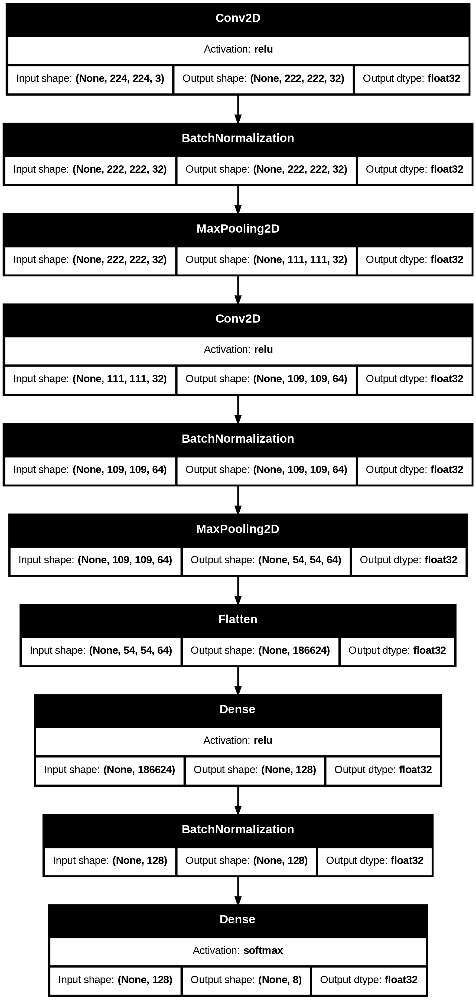

In [ ]:
try:
    plot_model(
        model,
        "model1_batchnorm.png",
        show_dtype=True,
        show_shapes=True,
        show_layer_activations=True,
    )
    display(Image("model1_batchnorm.png"))
except Exception as e:
    print(f"Error occurred: {e}")

In [30]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - accuracy: 0.8417 - loss: 0.5283 - val_accuracy: 0.4993 - val_loss: 2.0731
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9783 - loss: 0.0718 - val_accuracy: 0.6100 - val_loss: 1.7112
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9866 - loss: 0.0454 - val_accuracy: 0.6087 - val_loss: 2.0803
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9890 - loss: 0.0377 - val_accuracy: 0.9785 - val_loss: 0.0628
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9902 - loss: 0.0312 - val_accuracy: 0.9515 - val_loss: 0.1383
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9942 - loss: 0.0231 - val_accuracy: 0.9203 - val_loss: 0.2568
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9941 - loss: 0.0189 - val_accuracy: 0.9851 - val_loss: 0.0459
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9987 - loss: 0.0056 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f"model1_batchnorm - loss: {loss}, accuracy: {acc}")

model_batchnorm - loss: 0.17119242250919342, accuracy: 0.939393937587738


In [32]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [33]:
training_data["loss"]

[0.2529643774032593,
 0.06478467583656311,
 0.04075891897082329,
 0.03078327141702175,
 0.051218193024396896,
 0.02266501821577549,
 0.016864320263266563,
 0.008600497618317604,
 0.00806643906980753,
 0.00725896842777729,
 0.036466218531131744,
 0.011337179690599442,
 0.007372756022959948,
 0.007881293073296547,
 0.01953585259616375,
 0.006548783276230097,
 0.008066676557064056,
 0.004361969418823719,
 0.010727796703577042,
 0.006043022498488426,
 0.008431958965957165,
 0.01389582920819521,
 0.0022513866424560547]

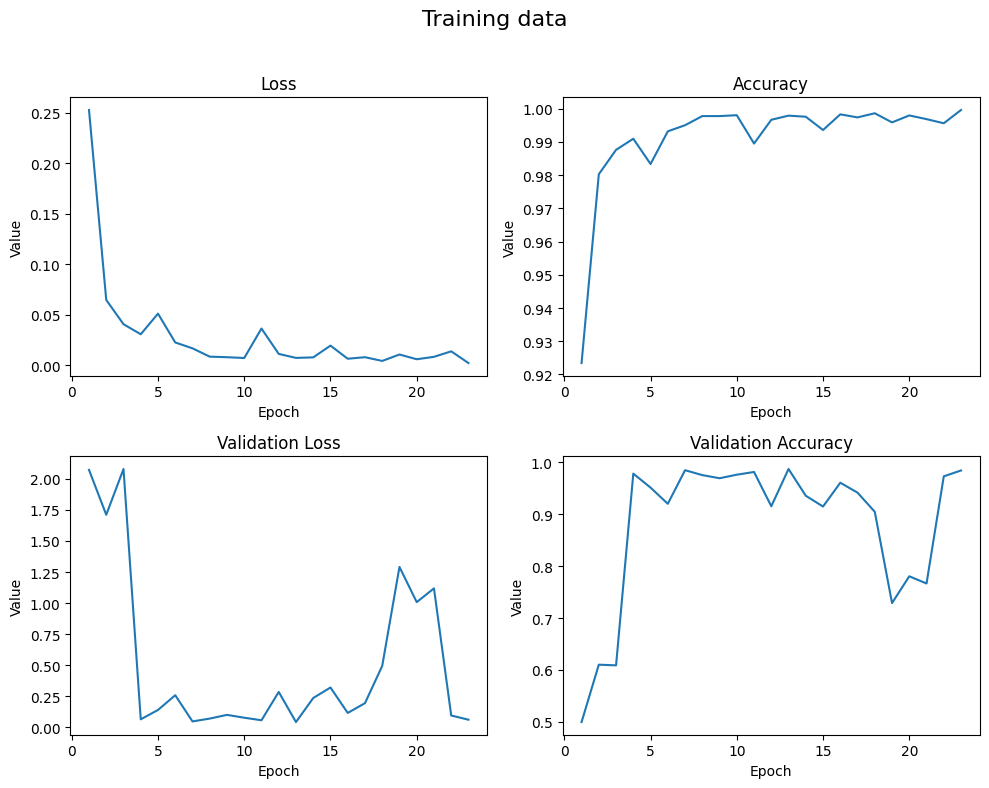

In [34]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [35]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

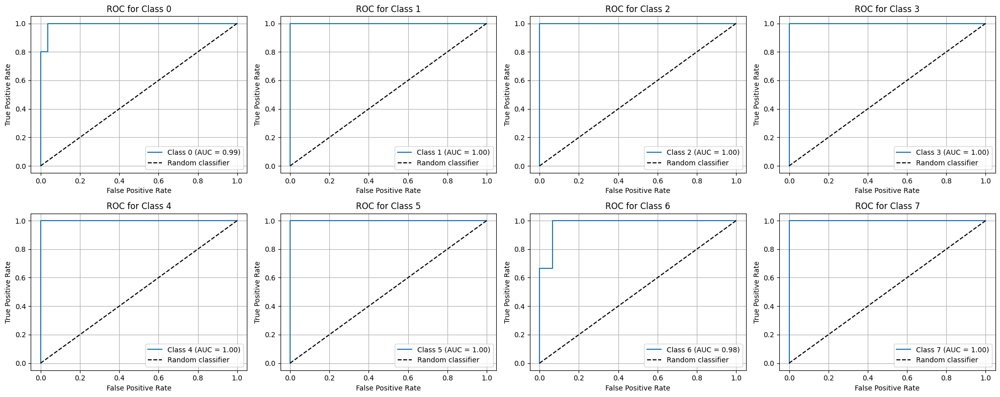

In [36]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
    ax.plot([0, 1], [0, 1], "k--", label="Random classifier")
    ax.set_title(f"ROC for Class {i}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

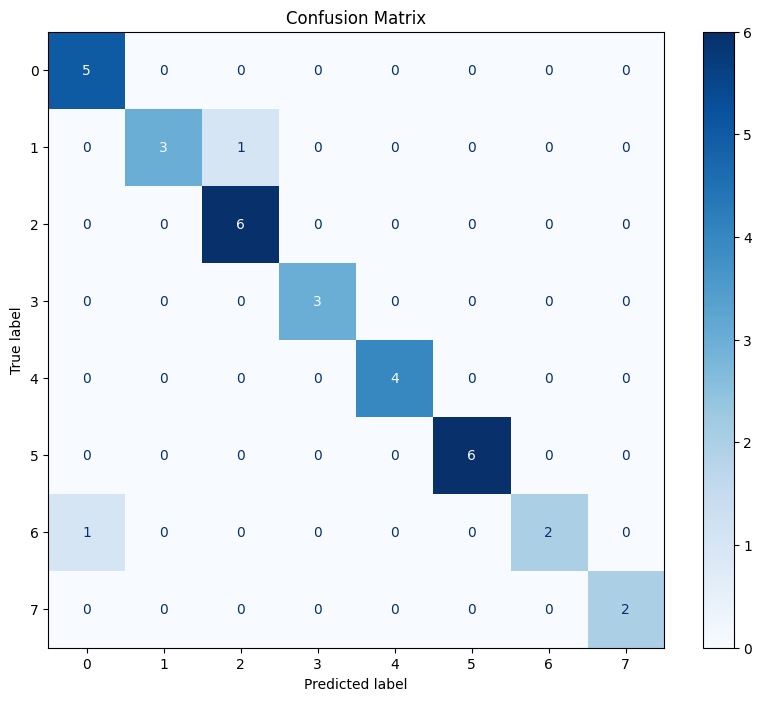

In [37]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [38]:
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.9393939393939394


In [39]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.83      1.00      0.91         5
           1       1.00      0.75      0.86         4
           2       0.86      1.00      0.92         6
           3       1.00      1.00      1.00         3
           4       1.00      1.00      1.00         4
           5       1.00      1.00      1.00         6
           6       1.00      0.67      0.80         3
           7       1.00      1.00      1.00         2

    accuracy                           0.94        33
   macro avg       0.96      0.93      0.94        33
weighted avg       0.95      0.94      0.94        33



## Model elasticnet (l1 = 0.01; l2 = 0.01)

In [ ]:
input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01)),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01)),
    MaxPool2D((2, 2)),

    Flatten(),
    Dense(128, activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01)),
    Dense(num_classes, activation='softmax'),
])

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_18 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_18 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_19 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_19 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_9 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,908,424 (91.20 MB)

 Trainable params: 23,908,424 (91.20 MB)

 Non-trainable params: 0 (0.00 B)

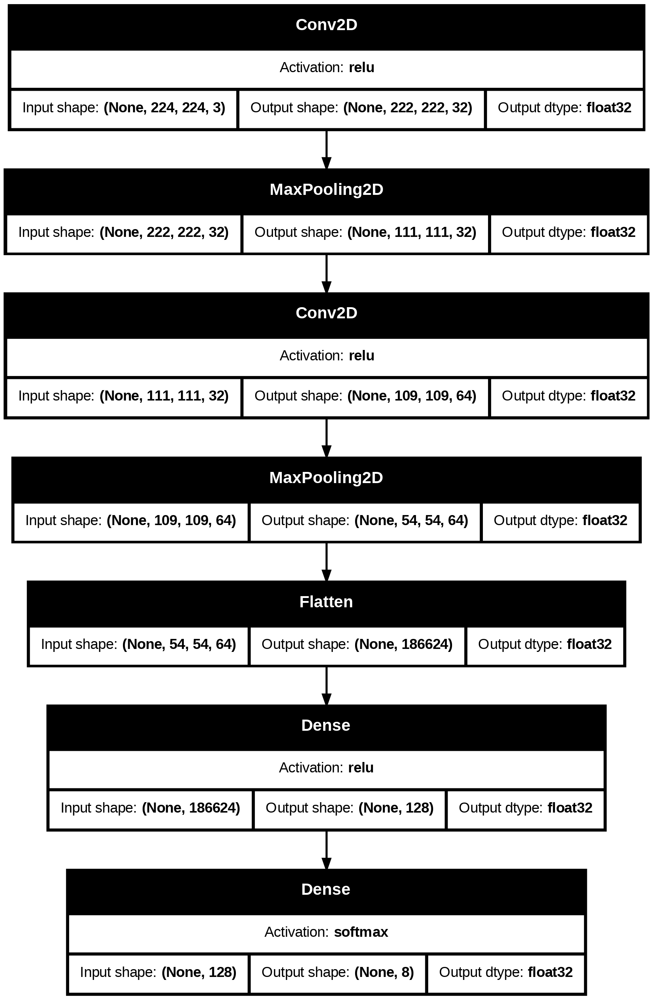

In [ ]:
try:
    plot_model(model, 'model1_l1_l2.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model1_l1_l2.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                  restore_best_weights=True, verbose=1)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - accuracy: 0.1410 - loss: 68.7042 - val_accuracy: 0.1322 - val_loss: 29.1601
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.1307 - loss: 29.9167 - val_accuracy: 0.1322 - val_loss: 29.7838
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.1267 - loss: 29.6065 - val_accuracy: 0.1322 - val_loss: 29.4997
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.1342 - loss: 29.8586 - val_accuracy: 0.1322 - val_loss: 29.8837
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1368 - loss: 30.2577 - val_accuracy: 0.1322 - val_loss: 30.7969
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.1290 - loss: 30.8823 - val_accuracy: 0.1322 - val_loss: 30.7563
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.1277 - loss: 30.9135 - val_accuracy: 0.1322 - val_loss: 31.3181
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.1330 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model1_l1_l2 - loss: {loss}, accuracy: {acc}')

model1_l1_l2 - loss: 29.160629272460938, accuracy: 0.09090909361839294


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[39.082847595214844,
 29.746280670166016,
 29.71872329711914,
 29.90293312072754,
 30.485013961791992,
 30.89484405517578,
 30.9190616607666,
 30.940860748291016,
 30.9449520111084,
 30.945575714111328,
 30.945926666259766]

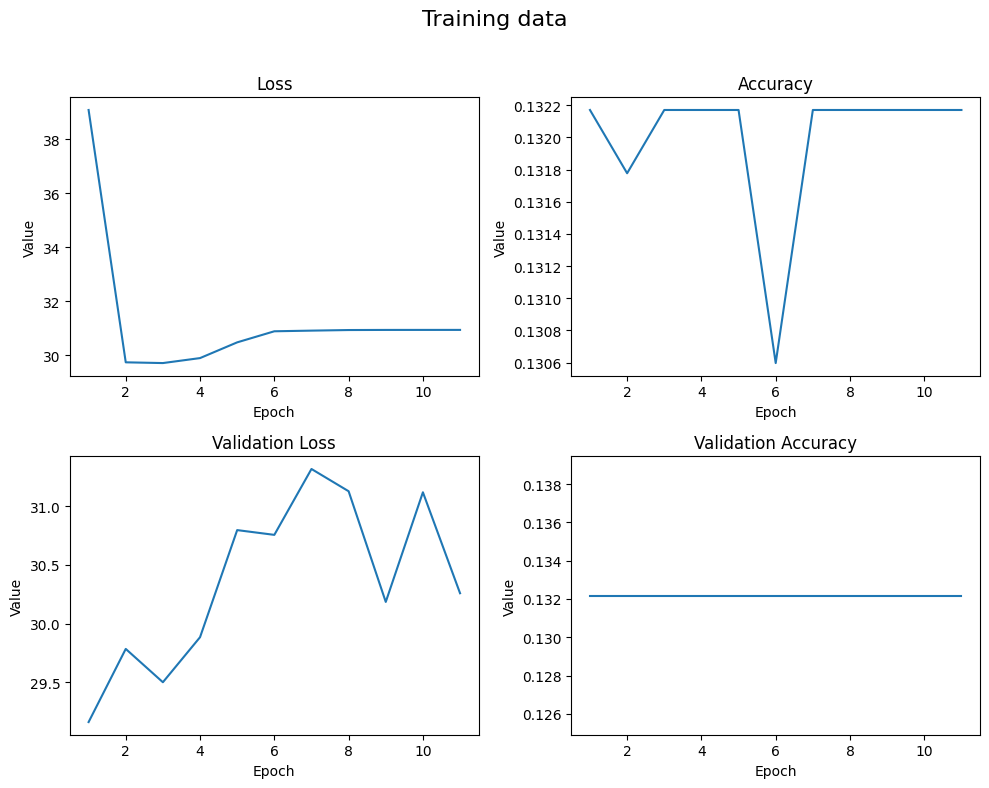

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

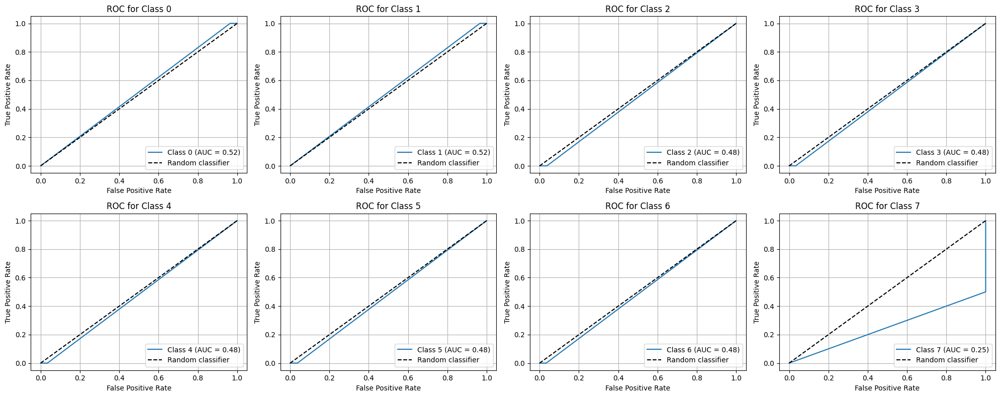

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

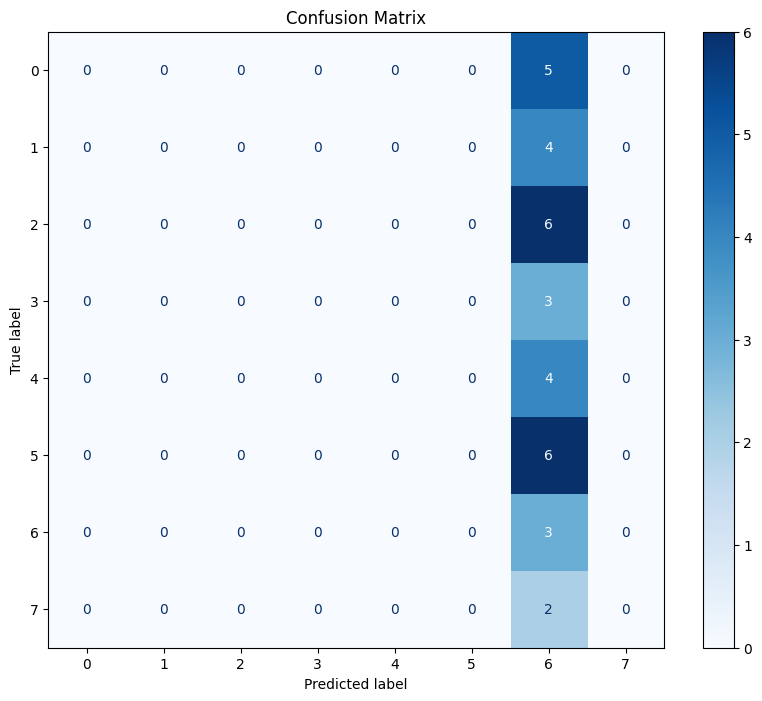

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.09090909090909091


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         6
           6       0.09      1.00      0.17         3
           7       0.00      0.00      0.00         2

    accuracy                           0.09        33
   macro avg       0.01      0.12      0.02        33
weighted avg       0.01      0.09      0.02        33



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model batchnormalization; dropout = 0.03;

In [ ]:
model = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPool2D((2, 2)),
    Dropout(0.3),
    Conv2D(64, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPool2D((2, 2)),
    Dropout(0.3),

    Flatten(),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(len(np.unique(y_train)), activation='softmax'),
])

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_20 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 222, 222, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_20 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_21 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 109, 109, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_21 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_10 (Flatten)                 │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 128)                 │      23,888,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_21 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,909,320 (91.21 MB)

 Trainable params: 23,908,872 (91.21 MB)

 Non-trainable params: 448 (1.75 KB)

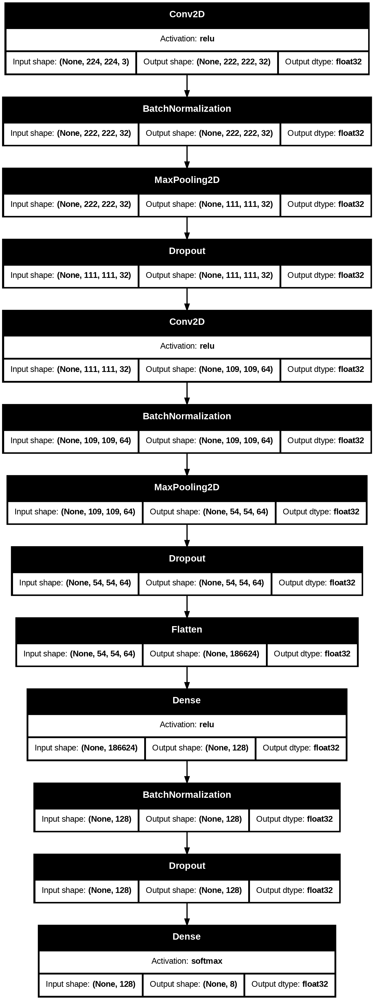

In [ ]:
try:
    plot_model(model, 'model1_dropout_batchnorm.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model1_dropout_batchnorm.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - accuracy: 0.7941 - loss: 0.6632 - val_accuracy: 0.3249 - val_loss: 2.7727
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9605 - loss: 0.1203 - val_accuracy: 0.8930 - val_loss: 0.2947
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9754 - loss: 0.0772 - val_accuracy: 0.9279 - val_loss: 0.2154
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9831 - loss: 0.0595 - val_accuracy: 0.8615 - val_loss: 0.4127
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9899 - loss: 0.0340 - val_accuracy: 0.7886 - val_loss: 0.6962
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9777 - loss: 0.0635 - val_accuracy: 0.9289 - val_loss: 0.2940
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9897 - loss: 0.0350 - val_accuracy: 0.9531 - val_loss: 0.1522
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9906 - loss: 0.0261 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model1_dropout_batchnorm - loss: {loss}, accuracy: {acc}')

model1_dropout_batchnorm - loss: 0.5846989154815674, accuracy: 0.9090909361839294


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[0.3610354959964752,
 0.11688249558210373,
 0.08197307586669922,
 0.05751466751098633,
 0.039198774844408035,
 0.05861836299300194,
 0.03305238112807274,
 0.02985774725675583,
 0.024416089057922363,
 0.024815494194626808,
 0.017622631043195724,
 0.02463829331099987,
 0.01734987273812294,
 0.018778188154101372,
 0.01815560832619667,
 0.013485711067914963,
 0.01576784811913967,
 0.014840922318398952,
 0.010190253145992756,
 0.012413406744599342,
 0.008936051279306412,
 0.012313625775277615,
 0.013135291635990143]

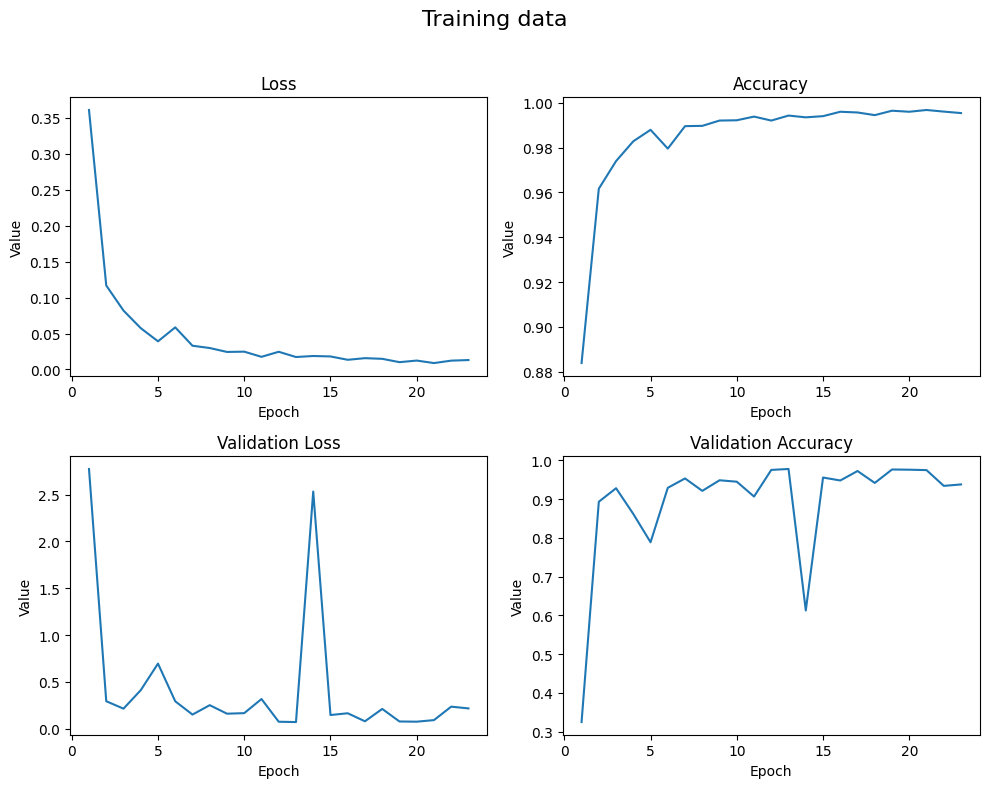

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

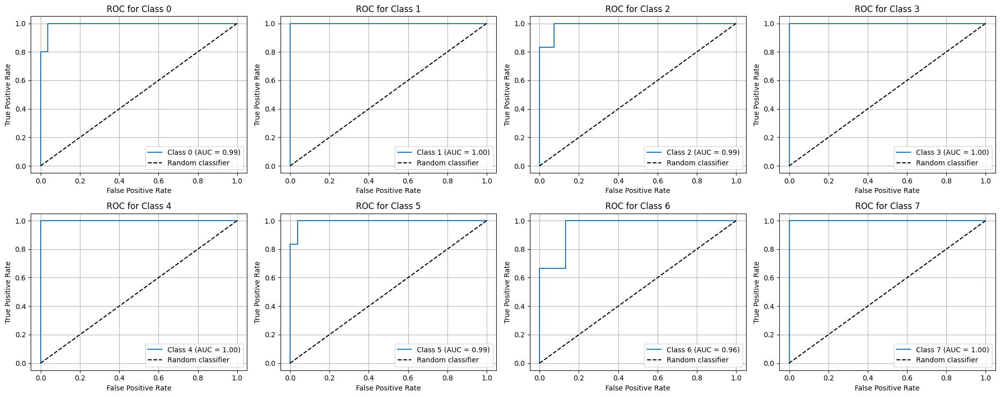

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

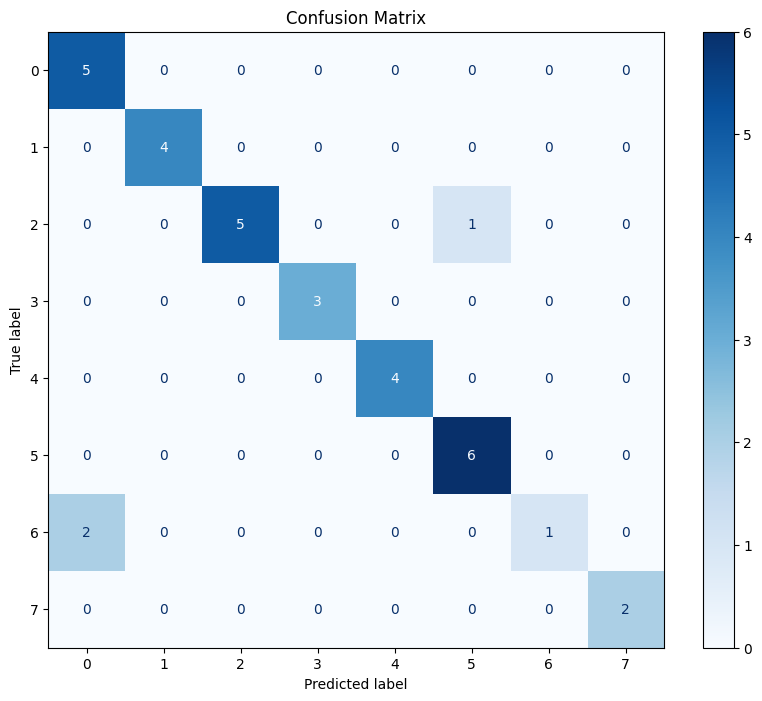

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.9090909090909091


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.71      1.00      0.83         5
           1       1.00      1.00      1.00         4
           2       1.00      0.83      0.91         6
           3       1.00      1.00      1.00         3
           4       1.00      1.00      1.00         4
           5       0.86      1.00      0.92         6
           6       1.00      0.33      0.50         3
           7       1.00      1.00      1.00         2

    accuracy                           0.91        33
   macro avg       0.95      0.90      0.90        33
weighted avg       0.93      0.91      0.90        33



# Extended architecture

## Model base

In [ ]:
inputs = Input(shape=X_train.shape[1:])
x = Conv2D(32, (3, 3), activation='relu')(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu')(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu')(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu')(x)
outputs = Dense(len(np.unique(y_train)), activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_22 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_22 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_23 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_23 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_24 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_24 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_11 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,169,992 (42.61 MB)

 Trainable params: 11,169,992 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

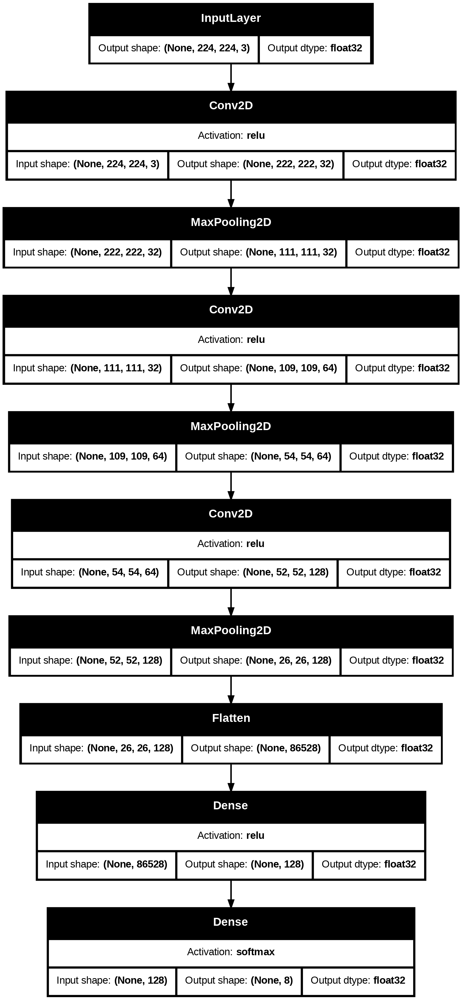

In [ ]:
try:
    plot_model(model, 'model2_base.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_base.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                  restore_best_weights=True, verbose=1)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - accuracy: 0.7065 - loss: 0.8695 - val_accuracy: 0.9308 - val_loss: 0.2090
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9541 - loss: 0.1334 - val_accuracy: 0.9722 - val_loss: 0.0761
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9786 - loss: 0.0621 - val_accuracy: 0.9740 - val_loss: 0.0734
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9833 - loss: 0.0465 - val_accuracy: 0.9672 - val_loss: 0.0992
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9896 - loss: 0.0327 - val_accuracy: 0.9533 - val_loss: 0.1696
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9877 - loss: 0.0384 - val_accuracy: 0.9481 - val_loss: 0.1798
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9866 - loss: 0.0397 - val_accuracy: 0.9512 - val_loss: 0.2016
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9893 - loss: 0.0299 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_base - loss: {loss}, accuracy: {acc}')

model2_base - loss: 0.28364500403404236, accuracy: 0.9090909361839294


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[0.4530996084213257,
 0.12563757598400116,
 0.07156885415315628,
 0.05093816667795181,
 0.04735785350203514,
 0.0534537211060524,
 0.035891611129045486,
 0.02222723513841629,
 0.038826920092105865,
 0.021995799615979195,
 0.019253291189670563,
 0.0031737633980810642,
 0.052122246474027634,
 0.006914585363119841,
 0.04473622515797615,
 0.02759506180882454,
 0.018636023625731468,
 0.008364257402718067,
 0.026399211958050728,
 0.009828581474721432,
 9.564495121594518e-05,
 1.784437154128682e-05,
 1.2175525625934824e-05,
 8.835438165988307e-06,
 7.038806415948784e-06,
 5.539774974749889e-06,
 4.61288937003701e-06,
 3.5908533391193487e-06,
 2.8320448564045364e-06,
 2.2437402549257968e-06,
 1.8054956854030024e-06,
 1.3613944247481413e-06,
 1.0504271585887182e-06,
 8.462162099931447e-07,
 6.539419246109901e-07,
 4.985282089364773e-07]

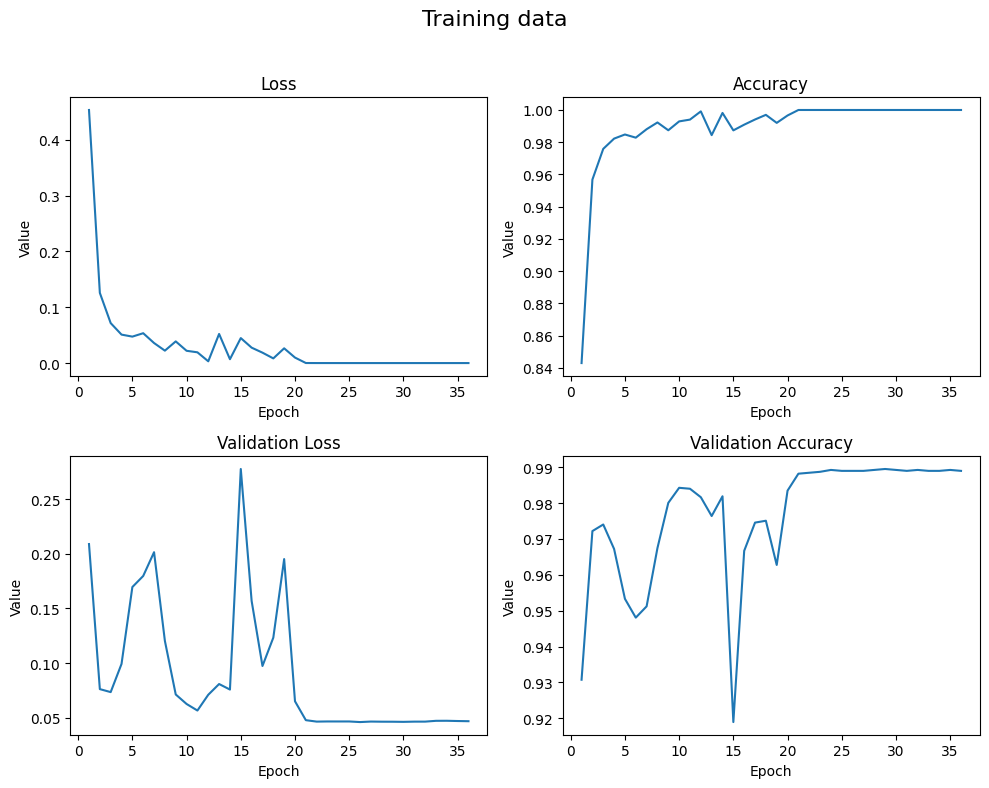

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

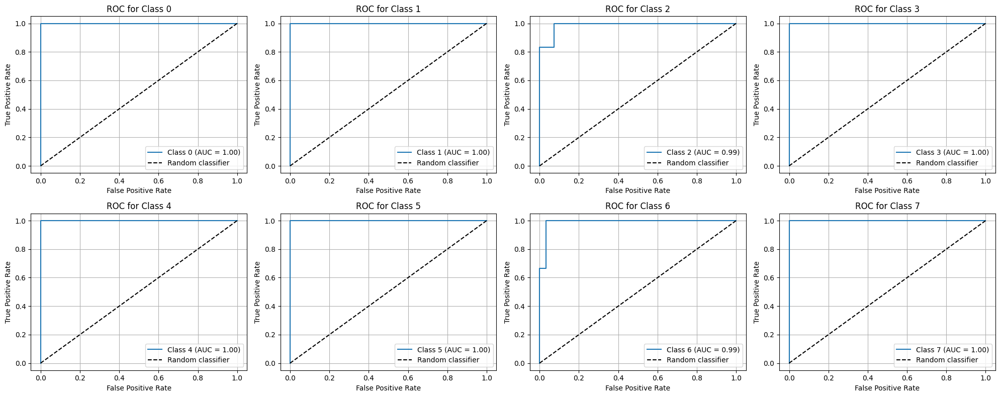

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

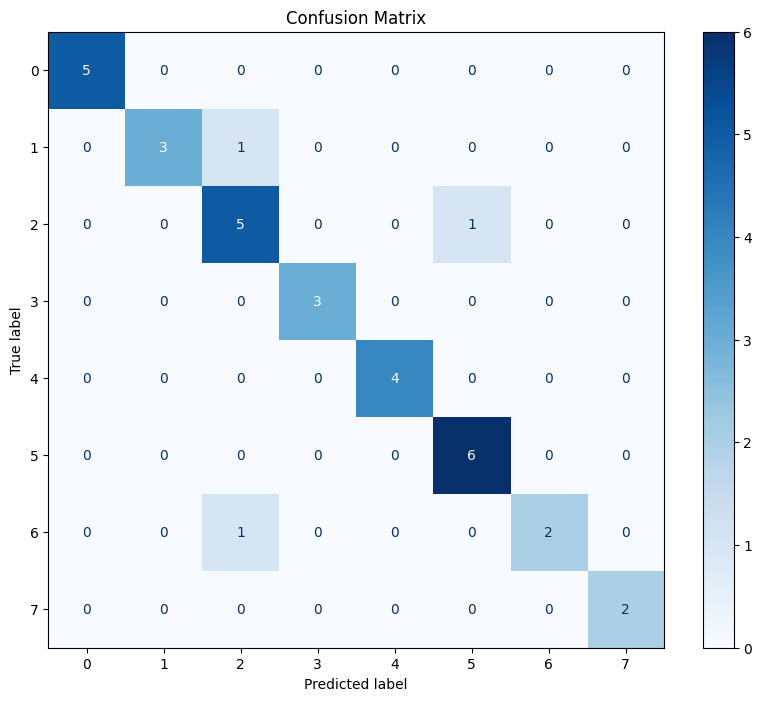

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.9090909090909091


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         5
           1       1.00      0.75      0.86         4
           2       0.71      0.83      0.77         6
           3       1.00      1.00      1.00         3
           4       1.00      1.00      1.00         4
           5       0.86      1.00      0.92         6
           6       1.00      0.67      0.80         3
           7       1.00      1.00      1.00         2

    accuracy                           0.91        33
   macro avg       0.95      0.91      0.92        33
weighted avg       0.92      0.91      0.91        33



## Model l1 = 0.01

In [ ]:
input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.01))(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_12 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_25 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_25 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_26 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_26 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_27 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_27 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_12 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_24 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,169,992 (42.61 MB)

 Trainable params: 11,169,992 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

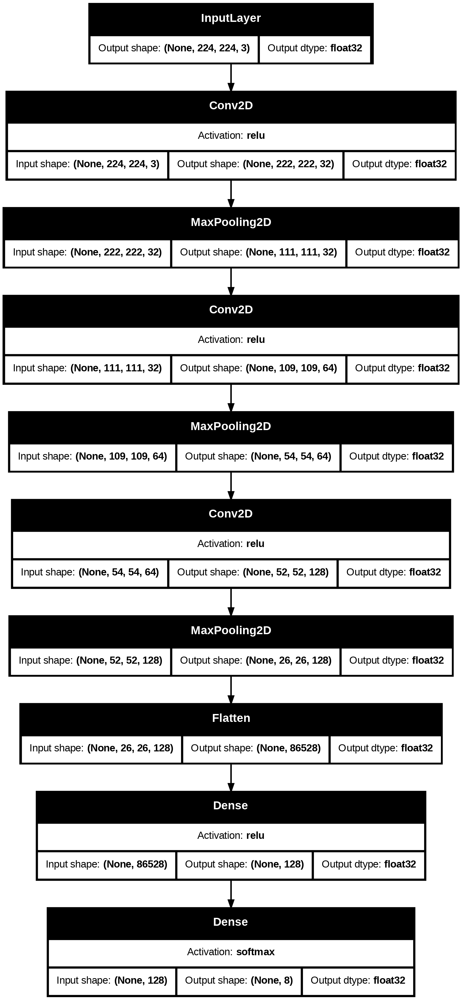

In [ ]:
try:
    plot_model(model, 'model2_l1_001.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_l1_001.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                  restore_best_weights=True, verbose=1)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - accuracy: 0.1253 - loss: 48.4845 - val_accuracy: 0.1322 - val_loss: 15.6098
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1312 - loss: 16.2454 - val_accuracy: 0.1322 - val_loss: 16.3843
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1339 - loss: 16.2446 - val_accuracy: 0.1322 - val_loss: 16.1848
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1291 - loss: 16.2398 - val_accuracy: 0.1322 - val_loss: 16.3328
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1270 - loss: 16.2462 - val_accuracy: 0.1322 - val_loss: 15.8895
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1334 - loss: 16.2361 - val_accuracy: 0.1322 - val_loss: 16.2036
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1316 - loss: 16.2377 - val_accuracy: 0.1322 - val_loss: 16.2313
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1289 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_l1_001 - loss: {loss}, accuracy: {acc}')

model2_l1_001 - loss: 15.607305526733398, accuracy: 0.09090909361839294


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[23.528047561645508,
 16.24510383605957,
 16.242034912109375,
 16.23932456970215,
 16.24116325378418,
 16.239349365234375,
 16.23831558227539,
 16.23745346069336,
 16.238306045532227,
 16.23640251159668,
 16.23715591430664]

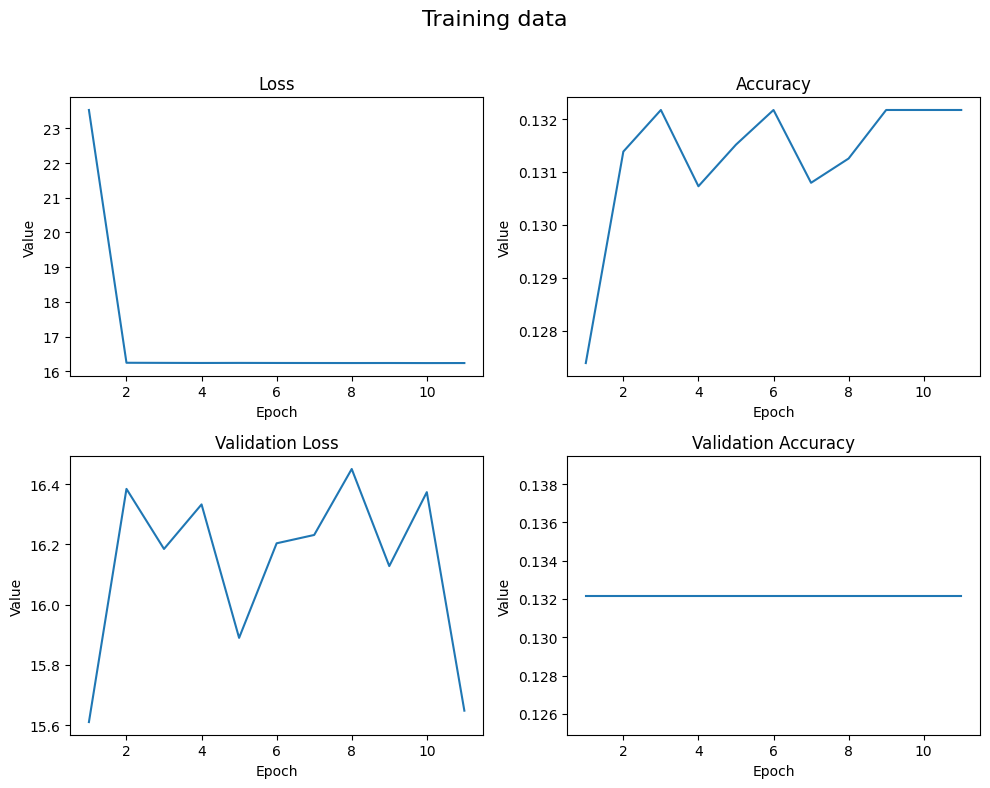

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

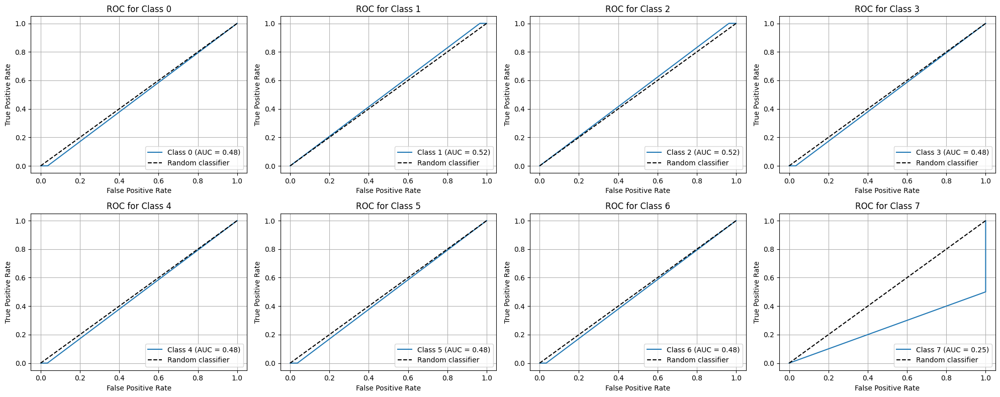

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

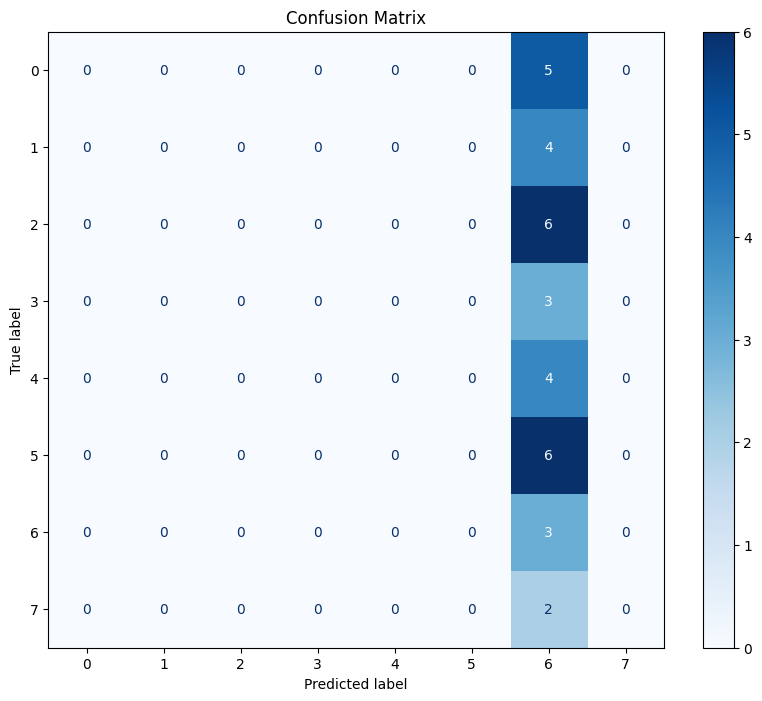

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.09090909090909091


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         6
           6       0.09      1.00      0.17         3
           7       0.00      0.00      0.00         2

    accuracy                           0.09        33
   macro avg       0.01      0.12      0.02        33
weighted avg       0.01      0.09      0.02        33



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model l1 = 0.001

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.001))(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.001))(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.001))(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.001))(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_28 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_28 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_29 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_29 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_30 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_30 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_13 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,169,992 (42.61 MB)

 Trainable params: 11,169,992 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

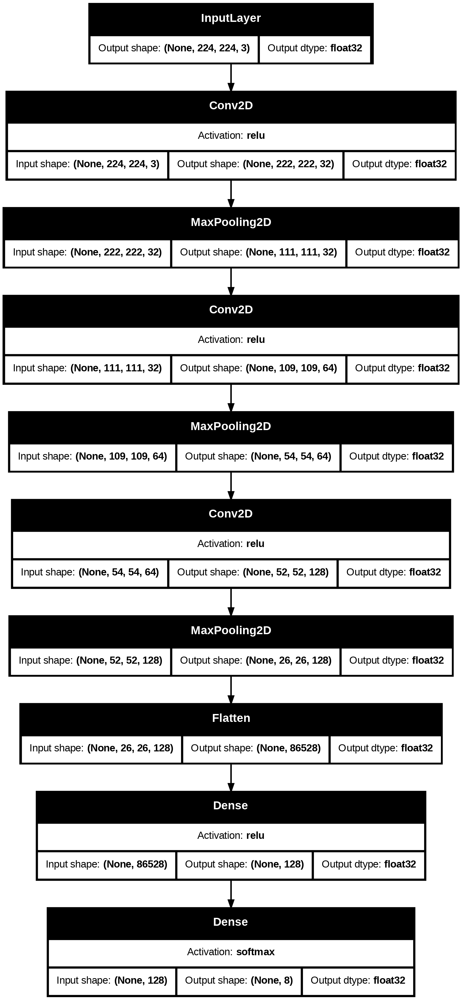

In [ ]:
try:
    plot_model(model, 'model2_l1_0001.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_l1_0001.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step - accuracy: 0.3726 - loss: 7.3525 - val_accuracy: 0.6210 - val_loss: 2.9815
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.6425 - loss: 2.7968 - val_accuracy: 0.6418 - val_loss: 2.7004
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.6755 - loss: 2.6246 - val_accuracy: 0.7021 - val_loss: 2.5172
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.7041 - loss: 2.5230 - val_accuracy: 0.7147 - val_loss: 2.4786
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.7232 - loss: 2.4393 - val_accuracy: 0.7443 - val_loss: 2.3720
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.7487 - loss: 2.3730 - val_accuracy: 0.7582 - val_loss: 2.3516
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.7658 - loss: 2.3067 - val_accuracy: 0.7506 - val_loss: 2.3499
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.7757 - loss: 2.2729 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_l1_0001 - loss: {loss}, accuracy: {acc}')

model2_l1_0001 - loss: 2.3494889736175537, accuracy: 0.7575757503509521


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[4.194809436798096,
 2.7491462230682373,
 2.6025476455688477,
 2.4978678226470947,
 2.434868812561035,
 2.363868236541748,
 2.305691957473755,
 2.275179624557495,
 2.2446935176849365,
 2.219940423965454,
 2.1817736625671387,
 2.1803481578826904,
 2.138584852218628,
 2.136253833770752,
 2.1145544052124023,
 2.0931434631347656,
 2.0834097862243652,
 2.093653917312622,
 2.063690185546875,
 2.0546209812164307,
 2.027806282043457,
 2.0287976264953613,
 2.01139497756958,
 1.9985241889953613,
 1.9679092168807983,
 1.9604904651641846,
 1.9490553140640259,
 1.9378154277801514,
 1.9282876253128052,
 1.9220939874649048,
 1.8991864919662476,
 1.8969391584396362,
 1.8816643953323364,
 1.888384222984314,
 1.8844285011291504,
 1.8675788640975952,
 1.864635705947876,
 1.8724085092544556,
 1.863909125328064,
 1.8460644483566284,
 1.8531230688095093,
 1.8547353744506836,
 1.8469483852386475,
 1.8429076671600342,
 1.8562114238739014,
 1.8282654285430908,
 1.8351439237594604,
 1.8344120979309082,
 1.82681

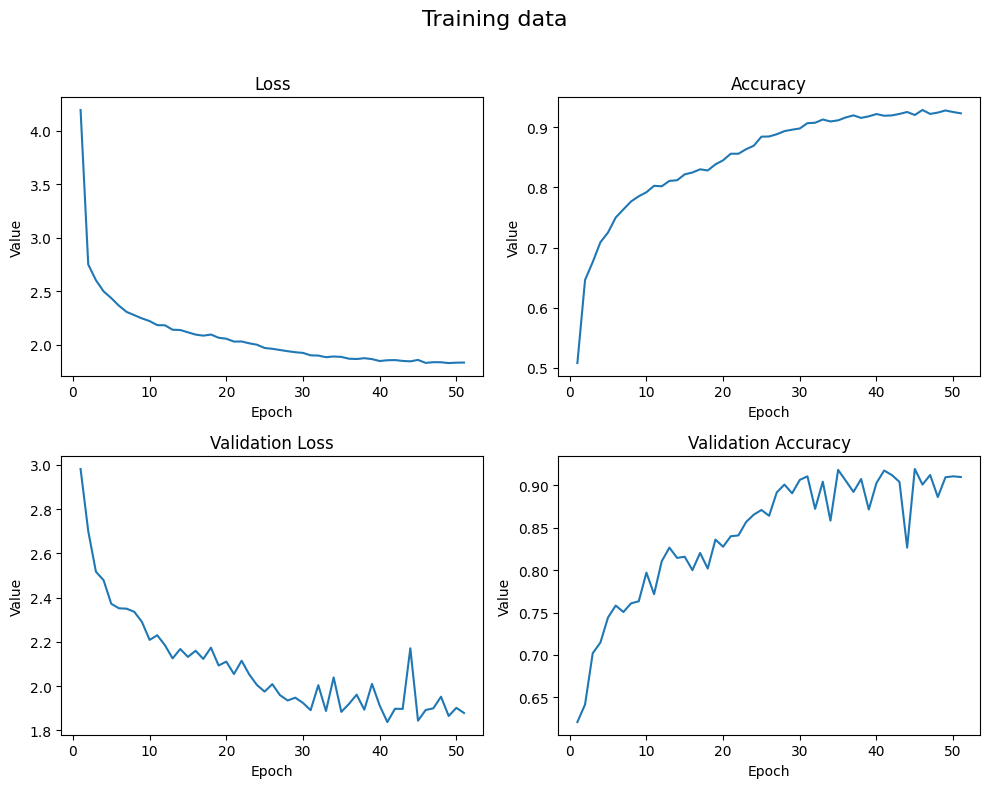

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

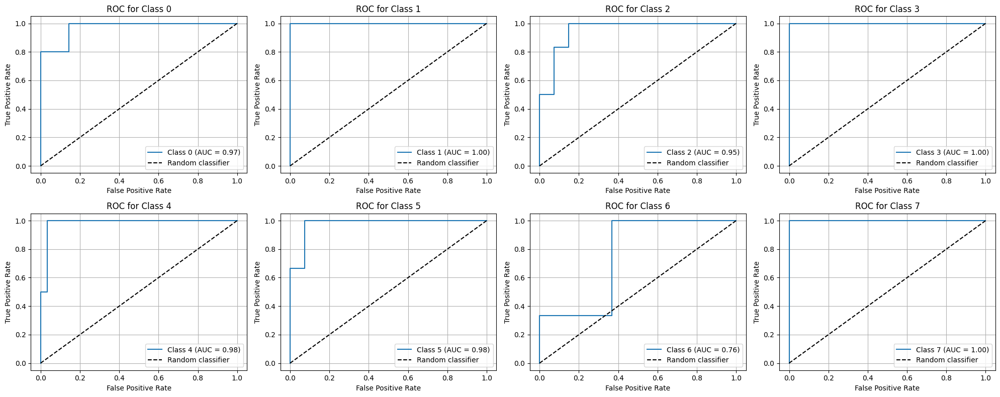

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

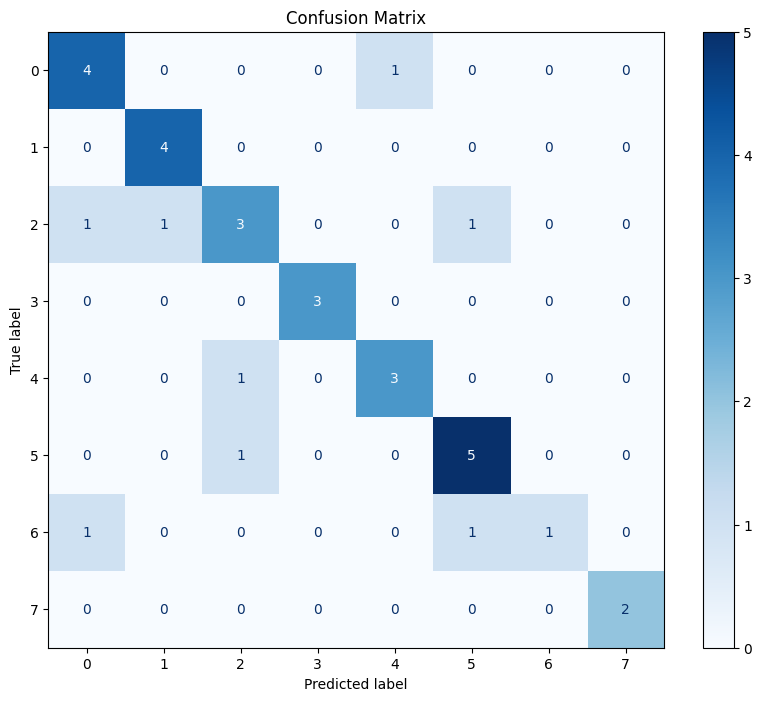

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.7575757575757576


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.67      0.80      0.73         5
           1       0.80      1.00      0.89         4
           2       0.60      0.50      0.55         6
           3       1.00      1.00      1.00         3
           4       0.75      0.75      0.75         4
           5       0.71      0.83      0.77         6
           6       1.00      0.33      0.50         3
           7       1.00      1.00      1.00         2

    accuracy                           0.76        33
   macro avg       0.82      0.78      0.77        33
weighted avg       0.77      0.76      0.74        33



## Model l2 = 0.01

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.01))(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.01))(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_31 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_31 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_32 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_32 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_33 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_33 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_14 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,169,992 (42.61 MB)

 Trainable params: 11,169,992 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

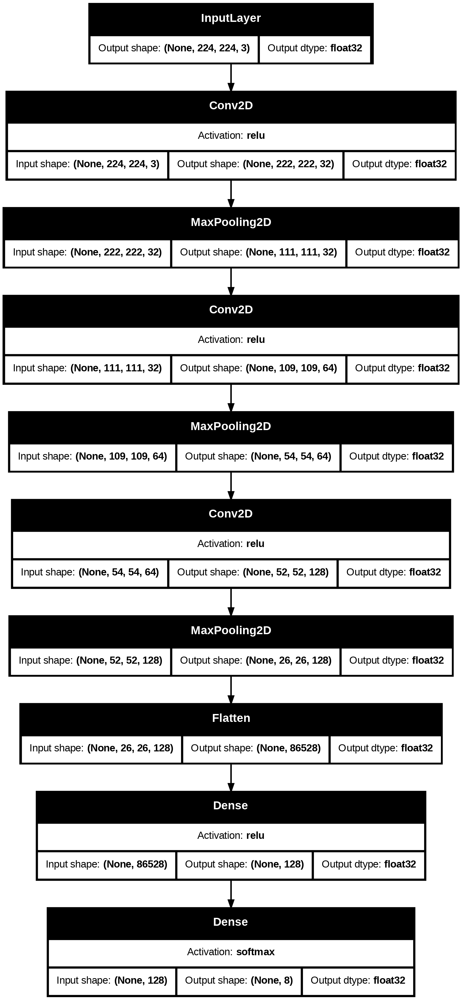

In [ ]:
try:
    plot_model(model, 'model2_l2_001.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_l2_001.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - accuracy: 0.6493 - loss: 2.1767 - val_accuracy: 0.8830 - val_loss: 0.8428
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.8929 - loss: 0.7717 - val_accuracy: 0.9402 - val_loss: 0.5545
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9044 - loss: 0.6444 - val_accuracy: 0.9436 - val_loss: 0.5150
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9167 - loss: 0.5826 - val_accuracy: 0.9431 - val_loss: 0.4896
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9144 - loss: 0.5647 - val_accuracy: 0.8718 - val_loss: 0.6630
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9048 - loss: 0.5782 - val_accuracy: 0.8542 - val_loss: 0.7863
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9214 - loss: 0.5441 - val_accuracy: 0.9413 - val_loss: 0.4530
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9228 - loss: 0.5113 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_l2_001 - loss: {loss}, accuracy: {acc}')

model2_l2_001 - loss: 0.5950243473052979, accuracy: 0.8787878751754761


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[1.3955053091049194,
 0.7180740833282471,
 0.6372101902961731,
 0.5729431509971619,
 0.5375000238418579,
 0.5346837639808655,
 0.5076932907104492,
 0.49945735931396484,
 0.4741954505443573,
 0.4652102291584015,
 0.44858723878860474,
 0.43191906809806824,
 0.4348607659339905,
 0.41432657837867737,
 0.418037086725235,
 0.41033124923706055,
 0.405167818069458,
 0.39913591742515564,
 0.38660529255867004,
 0.4033626914024353,
 0.38092637062072754,
 0.3958517909049988,
 0.364576518535614,
 0.3719179630279541,
 0.3756980001926422,
 0.35413989424705505,
 0.3569498658180237,
 0.33584311604499817,
 0.36753183603286743,
 0.3576858937740326,
 0.34837812185287476,
 0.3393532335758209,
 0.34067150950431824,
 0.33213838934898376,
 0.33102431893348694,
 0.3374576270580292,
 0.3172203004360199,
 0.3251284956932068,
 0.32085734605789185,
 0.3284294605255127,
 0.32601356506347656,
 0.312782347202301,
 0.31614017486572266,
 0.3127475678920746,
 0.31128519773483276,
 0.30927345156669617,
 0.296247661113739

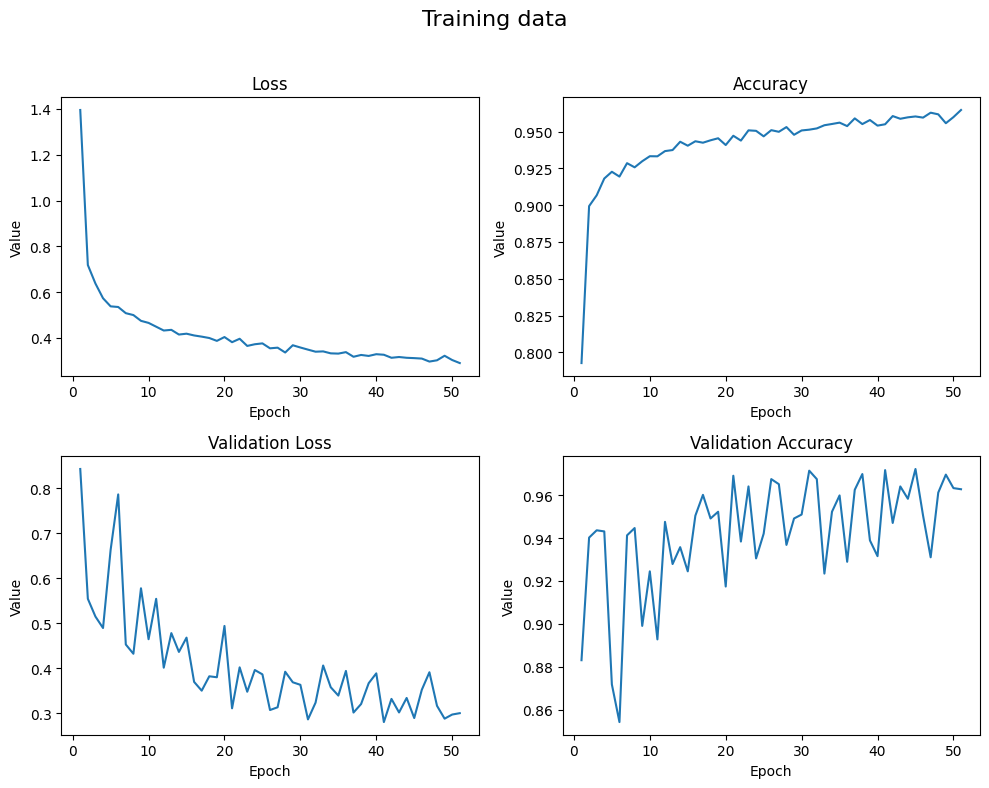

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

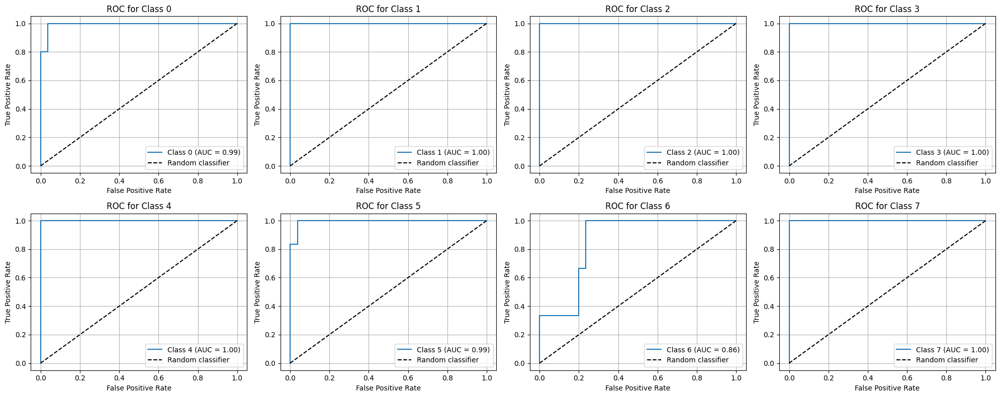

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

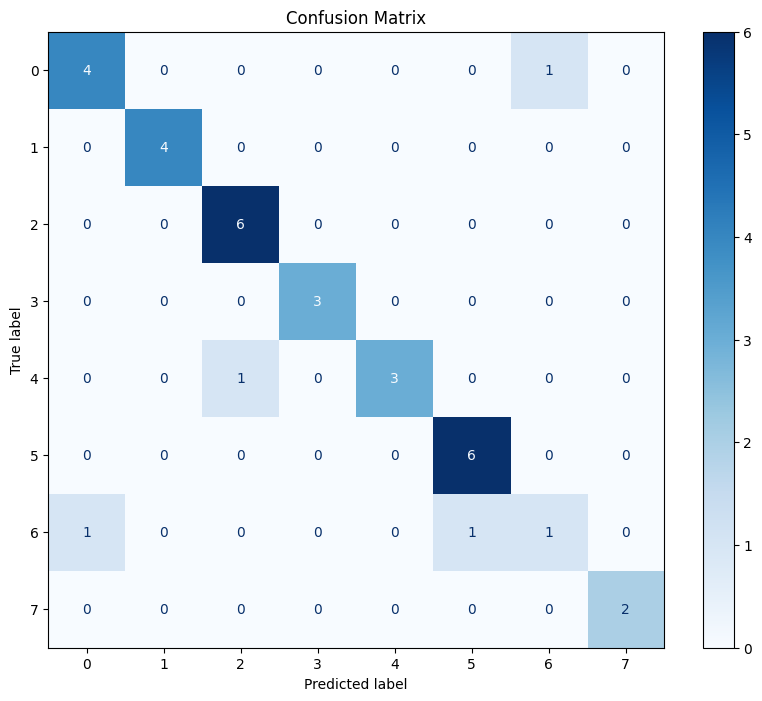

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.8787878787878788


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.80      0.80         5
           1       1.00      1.00      1.00         4
           2       0.86      1.00      0.92         6
           3       1.00      1.00      1.00         3
           4       1.00      0.75      0.86         4
           5       0.86      1.00      0.92         6
           6       0.50      0.33      0.40         3
           7       1.00      1.00      1.00         2

    accuracy                           0.88        33
   macro avg       0.88      0.86      0.86        33
weighted avg       0.87      0.88      0.87        33



## Model l2 = 0.001

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(0.001))(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.001))(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.001))(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_34 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_34 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_35 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_35 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_36 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_36 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_15 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,169,992 (42.61 MB)

 Trainable params: 11,169,992 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

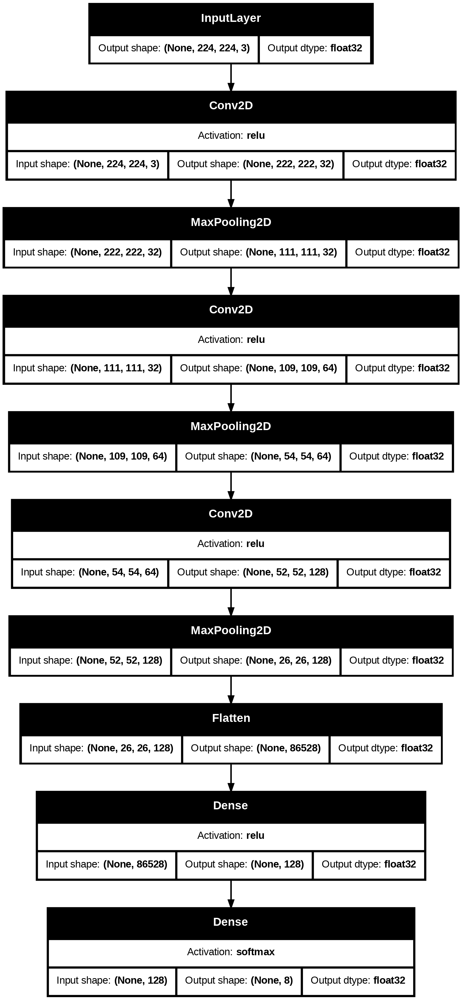

In [ ]:
try:
    plot_model(model, 'model2_l2_0001.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_l2_0001.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - accuracy: 0.6898 - loss: 1.1646 - val_accuracy: 0.9171 - val_loss: 0.4678
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9287 - loss: 0.4120 - val_accuracy: 0.9449 - val_loss: 0.3483
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9526 - loss: 0.3244 - val_accuracy: 0.9538 - val_loss: 0.2886
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9555 - loss: 0.3007 - val_accuracy: 0.9276 - val_loss: 0.3576
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9589 - loss: 0.2803 - val_accuracy: 0.9274 - val_loss: 0.3895
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9690 - loss: 0.2484 - val_accuracy: 0.9704 - val_loss: 0.2433
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9627 - loss: 0.2654 - val_accuracy: 0.9691 - val_loss: 0.2245
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.9680 - loss: 0.2377 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_l2_0001 - loss: {loss}, accuracy: {acc}')

model2_l2_0001 - loss: 0.38254109025001526, accuracy: 0.9090909361839294


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[0.7624097466468811,
 0.3978665769100189,
 0.3189604878425598,
 0.2940777838230133,
 0.2884763777256012,
 0.2449406385421753,
 0.2692580223083496,
 0.24169327318668365,
 0.22099889814853668,
 0.21879202127456665,
 0.18785400688648224,
 0.20207896828651428,
 0.20420818030834198,
 0.19832004606723785,
 0.18149857223033905,
 0.18771739304065704,
 0.18552826344966888,
 0.16075502336025238,
 0.16684959828853607,
 0.17331670224666595,
 0.15818540751934052,
 0.15069204568862915,
 0.15762802958488464,
 0.15608568489551544,
 0.13656441867351532,
 0.1475444883108139,
 0.13236919045448303,
 0.14842116832733154,
 0.12413450330495834,
 0.13979795575141907,
 0.1409018188714981,
 0.12462945282459259,
 0.11989963054656982,
 0.1440219134092331,
 0.12234163284301758,
 0.1256311982870102]

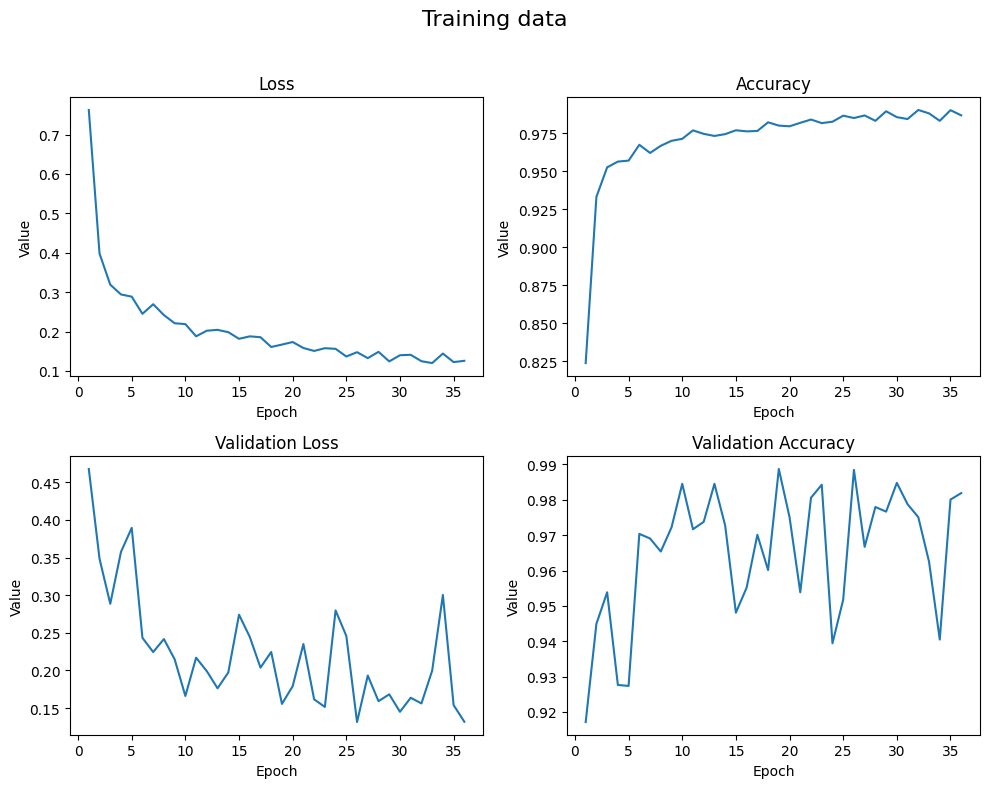

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

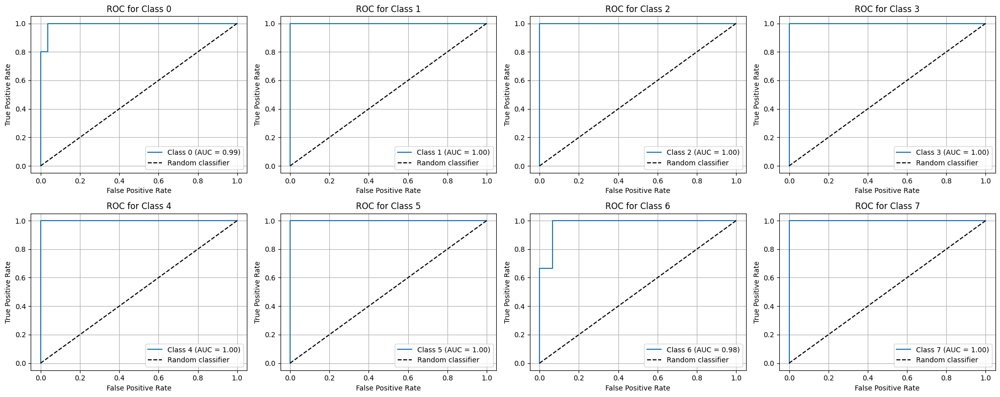

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

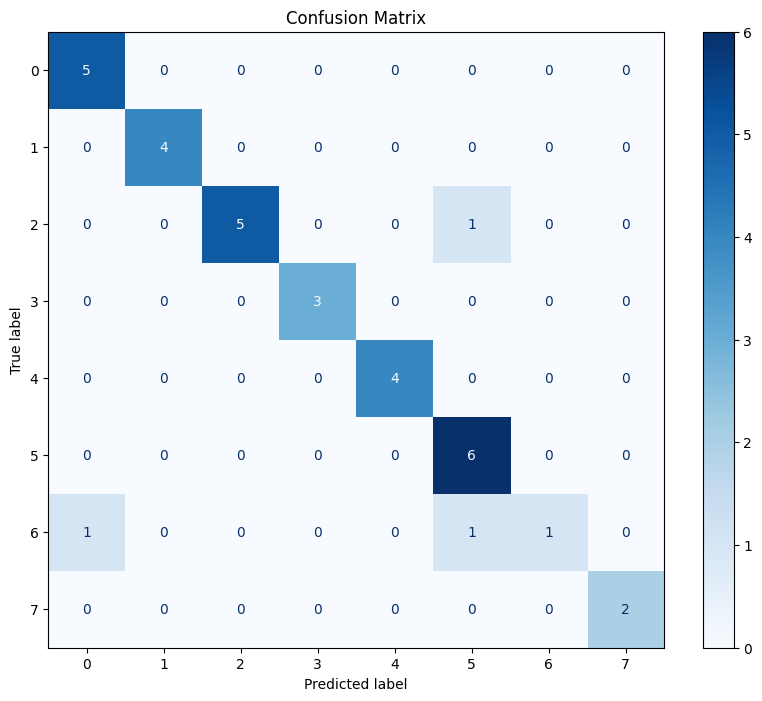

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.9090909090909091


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.83      1.00      0.91         5
           1       1.00      1.00      1.00         4
           2       1.00      0.83      0.91         6
           3       1.00      1.00      1.00         3
           4       1.00      1.00      1.00         4
           5       0.75      1.00      0.86         6
           6       1.00      0.33      0.50         3
           7       1.00      1.00      1.00         2

    accuracy                           0.91        33
   macro avg       0.95      0.90      0.90        33
weighted avg       0.93      0.91      0.90        33



## Model dropout = 0.2

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.2)(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.2)(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.2)(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.01))(x)
x = Dropout(0.2)(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_16 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_37 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_37 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_38 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_38 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_39 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_39 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_16 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_32 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_33 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,169,992 (42.61 MB)

 Trainable params: 11,169,992 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

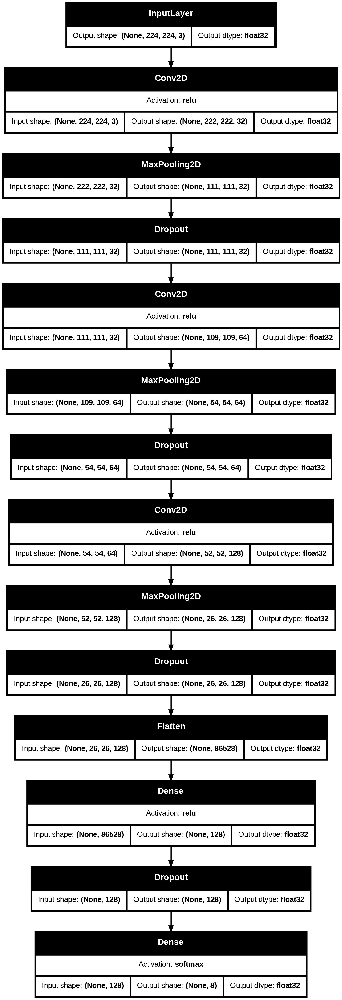

In [ ]:
try:
    plot_model(model, 'model2_dropout_02.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_dropout_02.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - accuracy: 0.1233 - loss: 48.4011 - val_accuracy: 0.1322 - val_loss: 15.6343
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.1327 - loss: 16.0474 - val_accuracy: 0.1322 - val_loss: 16.1983
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.1334 - loss: 16.0452 - val_accuracy: 0.1322 - val_loss: 15.9777
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.1294 - loss: 16.0455 - val_accuracy: 0.1322 - val_loss: 16.1102
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.1354 - loss: 16.0450 - val_accuracy: 0.1322 - val_loss: 15.8252
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.1271 - loss: 16.0270 - val_accuracy: 0.1322 - val_loss: 16.0464
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.1357 - loss: 16.0223 - val_accuracy: 0.1322 - val_loss: 15.9904
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1304 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_dropout_02 - loss: {loss}, accuracy: {acc}')

model2_dropout_02 - loss: 15.633221626281738, accuracy: 0.09090909361839294


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[23.34286880493164,
 16.046926498413086,
 16.044025421142578,
 16.04384422302246,
 16.039806365966797,
 16.027517318725586,
 16.021595001220703,
 16.0186824798584,
 16.017902374267578,
 16.01438331604004,
 16.015172958374023]

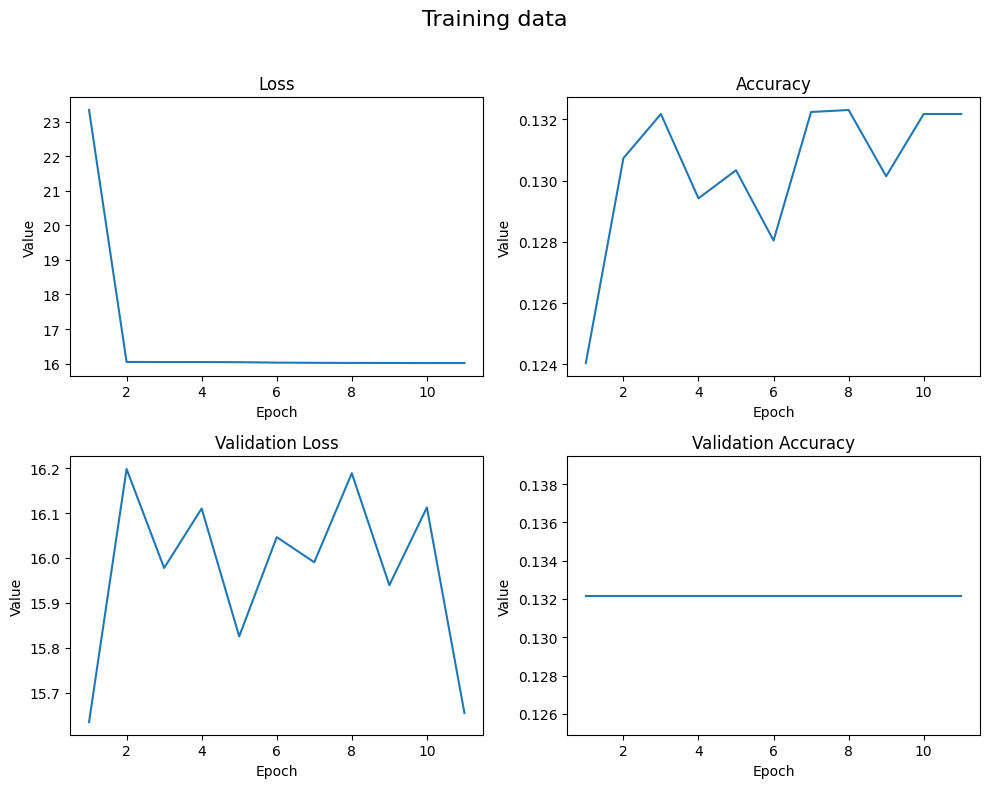

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

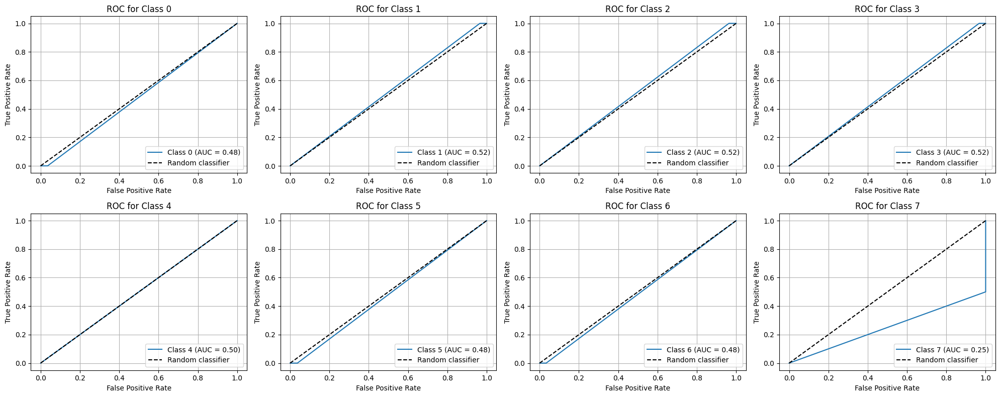

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

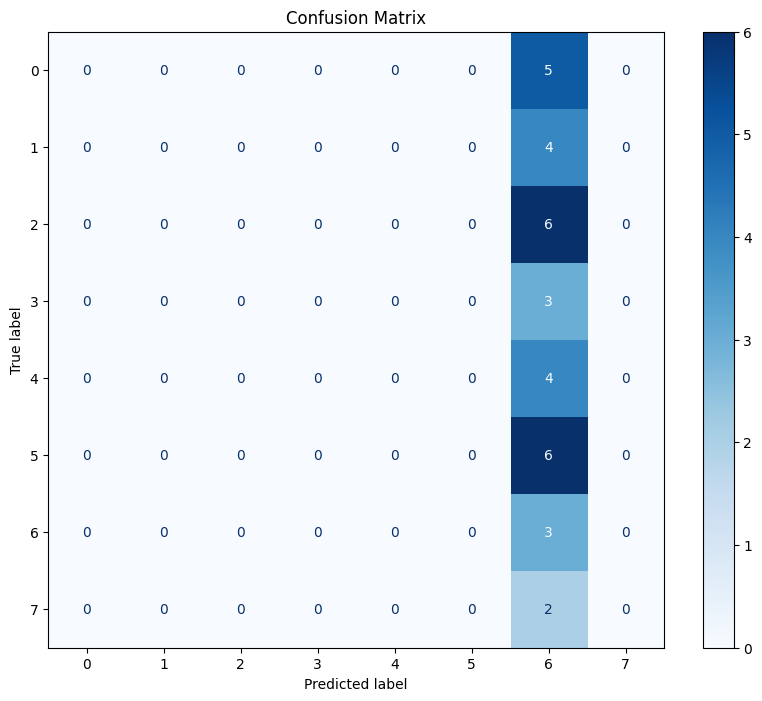

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.09090909090909091


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         6
           6       0.09      1.00      0.17         3
           7       0.00      0.00      0.00         2

    accuracy                           0.09        33
   macro avg       0.01      0.12      0.02        33
weighted avg       0.01      0.09      0.02        33



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model dropout = 0.3

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.01))(x)
x = Dropout(0.3)(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_40 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_40 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_16 (Dropout)                 │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_41 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_41 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_17 (Dropout)                 │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_42 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_42 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_18 (Dropout)                 │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_17 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_34 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_19 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_35 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,169,992 (42.61 MB)

 Trainable params: 11,169,992 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

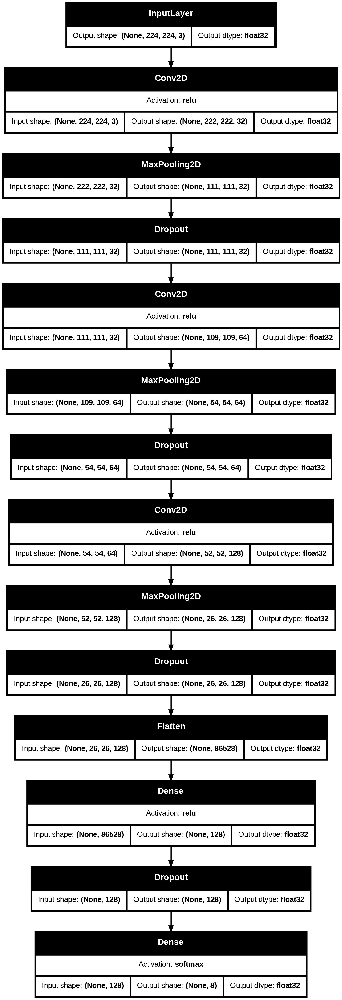

In [ ]:
try:
    plot_model(model, 'model2_dropout_03.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_dropout_03.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - accuracy: 0.1324 - loss: 48.8202 - val_accuracy: 0.1322 - val_loss: 15.5884
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1258 - loss: 15.8565 - val_accuracy: 0.1322 - val_loss: 15.9908
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.1314 - loss: 15.8584 - val_accuracy: 0.1322 - val_loss: 15.7914
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.1310 - loss: 15.8533 - val_accuracy: 0.1322 - val_loss: 15.8999
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1339 - loss: 15.8571 - val_accuracy: 0.1322 - val_loss: 15.7217
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.1316 - loss: 15.8521 - val_accuracy: 0.1322 - val_loss: 15.9036
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.1341 - loss: 15.8517 - val_accuracy: 0.1322 - val_loss: 15.8171
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1311 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_dropout_03 - loss: {loss}, accuracy: {acc}')

model2_dropout_03 - loss: 15.587569236755371, accuracy: 0.09090909361839294


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[23.341453552246094,
 15.85612678527832,
 15.854894638061523,
 15.853798866271973,
 15.854928970336914,
 15.853920936584473,
 15.852712631225586,
 15.852179527282715,
 15.85316276550293,
 15.851614952087402,
 15.8522367477417]

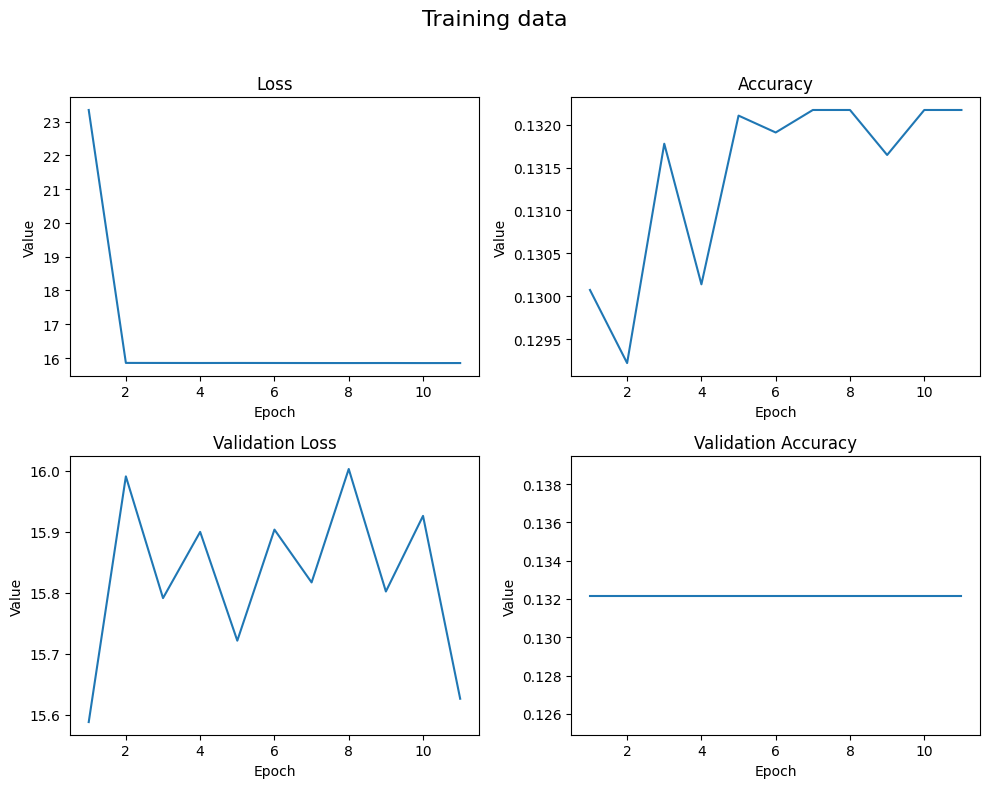

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

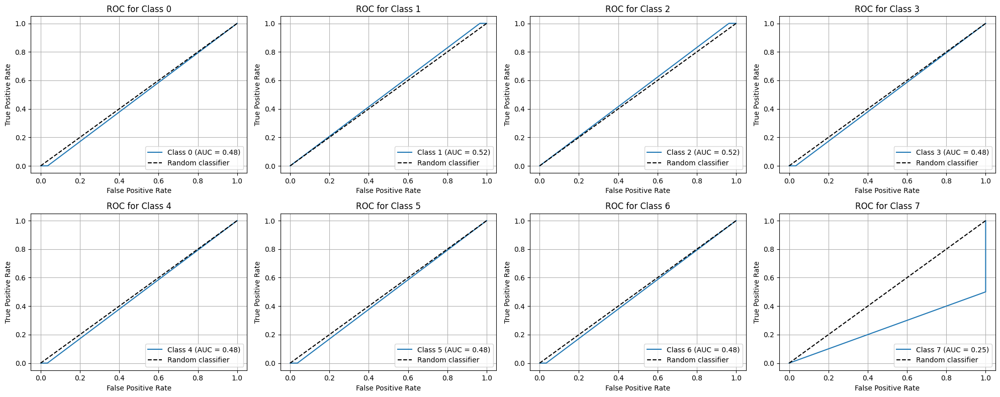

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

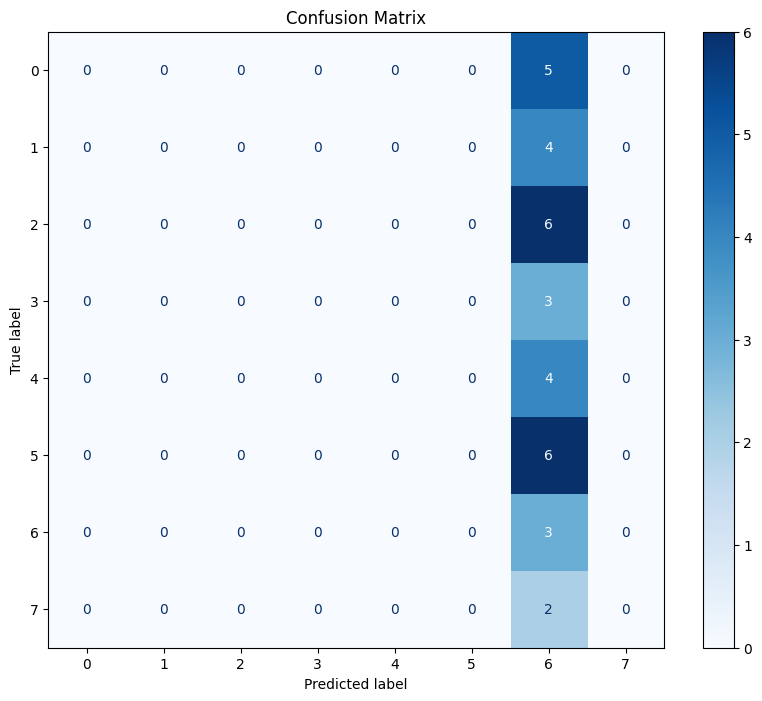

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.09090909090909091


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         6
           6       0.09      1.00      0.17         3
           7       0.00      0.00      0.00         2

    accuracy                           0.09        33
   macro avg       0.01      0.12      0.02        33
weighted avg       0.01      0.09      0.02        33



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model dropout = 0.4

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.4)(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.4)(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.4)(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.01))(x)
x = Dropout(0.4)(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_43 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_43 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_20 (Dropout)                 │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_44 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_44 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_21 (Dropout)                 │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_45 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_45 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_22 (Dropout)                 │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_18 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_36 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_23 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_37 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,169,992 (42.61 MB)

 Trainable params: 11,169,992 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

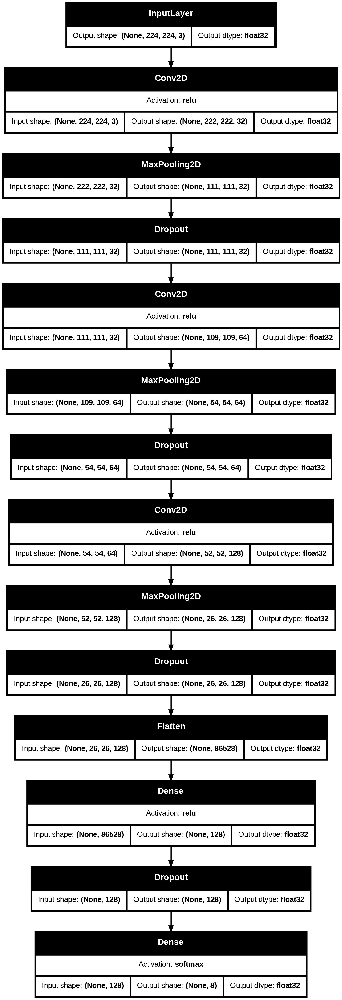

In [ ]:
try:
    plot_model(model, 'model2_dropout_04.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_dropout_04.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - accuracy: 0.1271 - loss: 49.6960 - val_accuracy: 0.1322 - val_loss: 15.6704
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1339 - loss: 15.9310 - val_accuracy: 0.1322 - val_loss: 16.0589
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.1296 - loss: 15.9382 - val_accuracy: 0.1322 - val_loss: 15.8928
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.1351 - loss: 15.9357 - val_accuracy: 0.1285 - val_loss: 15.9716
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.1307 - loss: 15.9386 - val_accuracy: 0.1322 - val_loss: 15.8135
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.1332 - loss: 15.9340 - val_accuracy: 0.1322 - val_loss: 15.9929
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.1342 - loss: 15.9356 - val_accuracy: 0.1322 - val_loss: 15.9044
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.1262 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_dropout_04 - loss: {loss}, accuracy: {acc}')

model2_dropout_04 - loss: 15.668864250183105, accuracy: 0.09090909361839294


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[23.642072677612305,
 15.933489799499512,
 15.93626594543457,
 15.93582820892334,
 15.936599731445312,
 15.936136245727539,
 15.93563461303711,
 15.935277938842773,
 15.936418533325195,
 15.934850692749023,
 15.9356689453125]

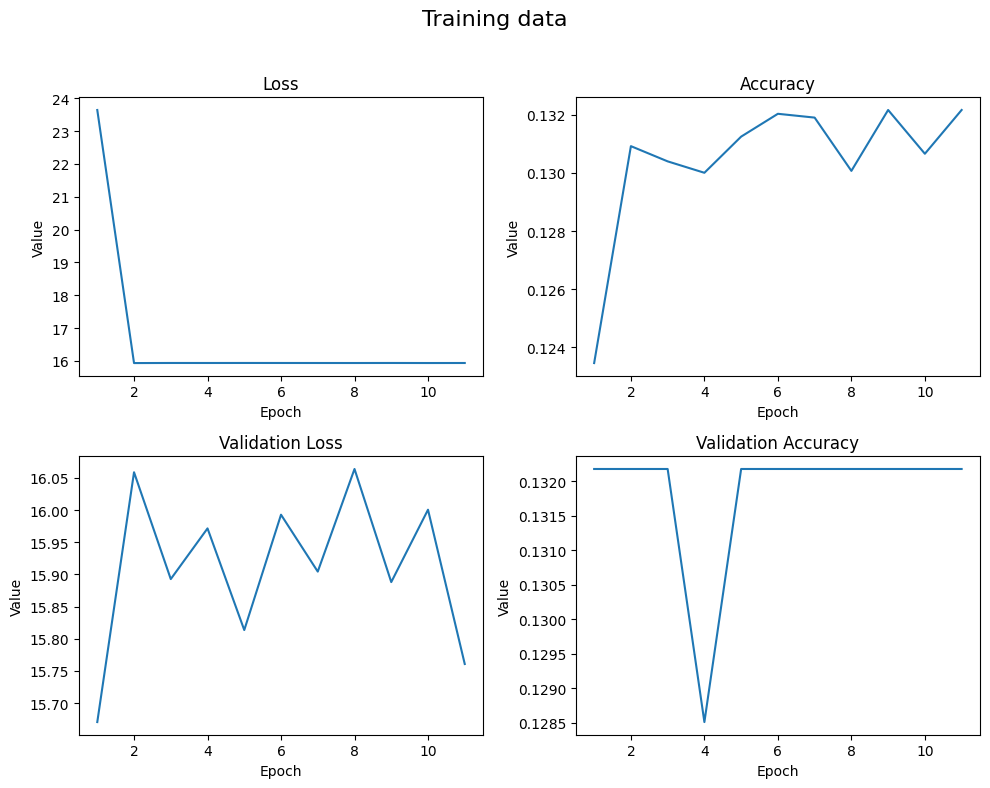

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

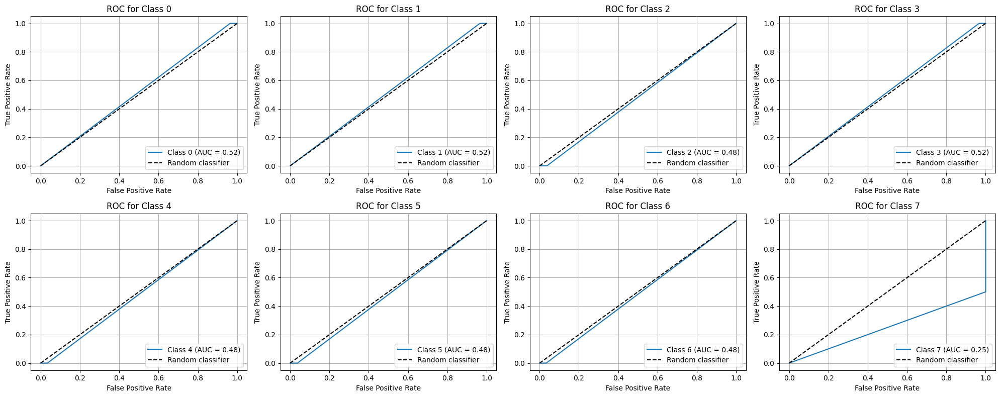

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

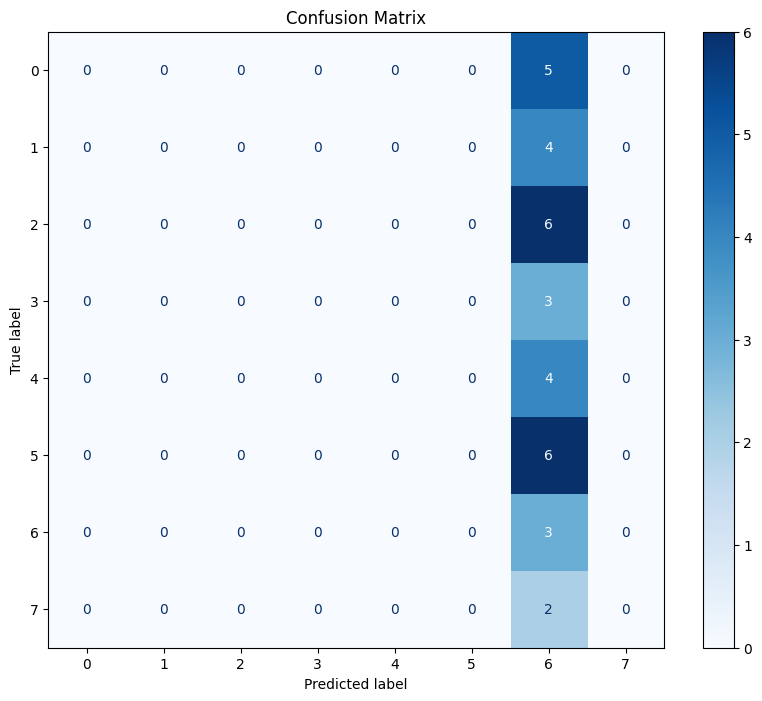

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.09090909090909091


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         6
           6       0.09      1.00      0.17         3
           7       0.00      0.00      0.00         2

    accuracy                           0.09        33
   macro avg       0.01      0.12      0.02        33
weighted avg       0.01      0.09      0.02        33



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model batch normalization

In [ ]:
inputs = Input(shape=input_shape)
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(inputs)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1(0.01))(x)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1(0.01))(x)
x = BatchNormalization()(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_19 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_46 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 222, 222, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_46 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_47 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 109, 109, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_47 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_48 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 52, 52, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_48 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_19 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_38 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_39 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,171,400 (42.62 MB)

 Trainable params: 11,170,696 (42.61 MB)

 Non-trainable params: 704 (2.75 KB)

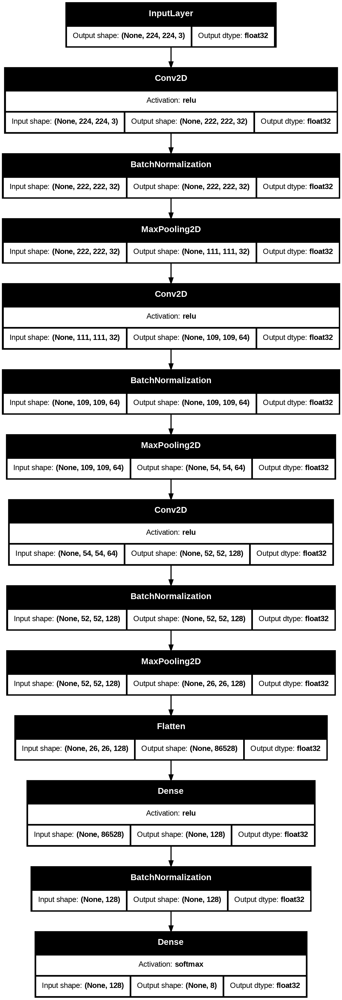

In [ ]:
try:
    plot_model(model, 'model2_batchnorm.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_batchnorm.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - accuracy: 0.6866 - loss: 75.2482 - val_accuracy: 0.1267 - val_loss: 28.3496
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.7641 - loss: 26.2902 - val_accuracy: 0.4679 - val_loss: 22.4899
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.8167 - loss: 19.8667 - val_accuracy: 0.6001 - val_loss: 18.2491
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.8359 - loss: 16.4941 - val_accuracy: 0.6216 - val_loss: 17.1104
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.8535 - loss: 15.7939 - val_accuracy: 0.6945 - val_loss: 16.0944
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.8588 - loss: 15.5697 - val_accuracy: 0.5159 - val_loss: 16.0253
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.8771 - loss: 15.5352 - val_accuracy: 0.4970 - val_loss: 17.2273
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.8712 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_batchnorm - loss: {loss}, accuracy: {acc}')

model2_batchnorm - loss: 14.23487377166748, accuracy: 0.6969696879386902


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[41.24856948852539,
 24.276628494262695,
 18.92255973815918,
 16.16063117980957,
 15.688023567199707,
 15.580245018005371,
 15.535730361938477,
 15.34647274017334,
 15.26924991607666,
 15.143556594848633,
 14.847101211547852,
 14.59244155883789,
 14.520623207092285,
 14.173237800598145,
 14.208922386169434,
 14.288447380065918,
 14.17837905883789,
 14.14439868927002,
 13.70630168914795,
 13.90071964263916,
 13.950591087341309,
 13.93700885772705,
 13.815832138061523,
 13.57729721069336,
 13.818617820739746,
 13.66862964630127,
 13.57386589050293,
 13.558405876159668,
 13.47673225402832,
 13.529105186462402]

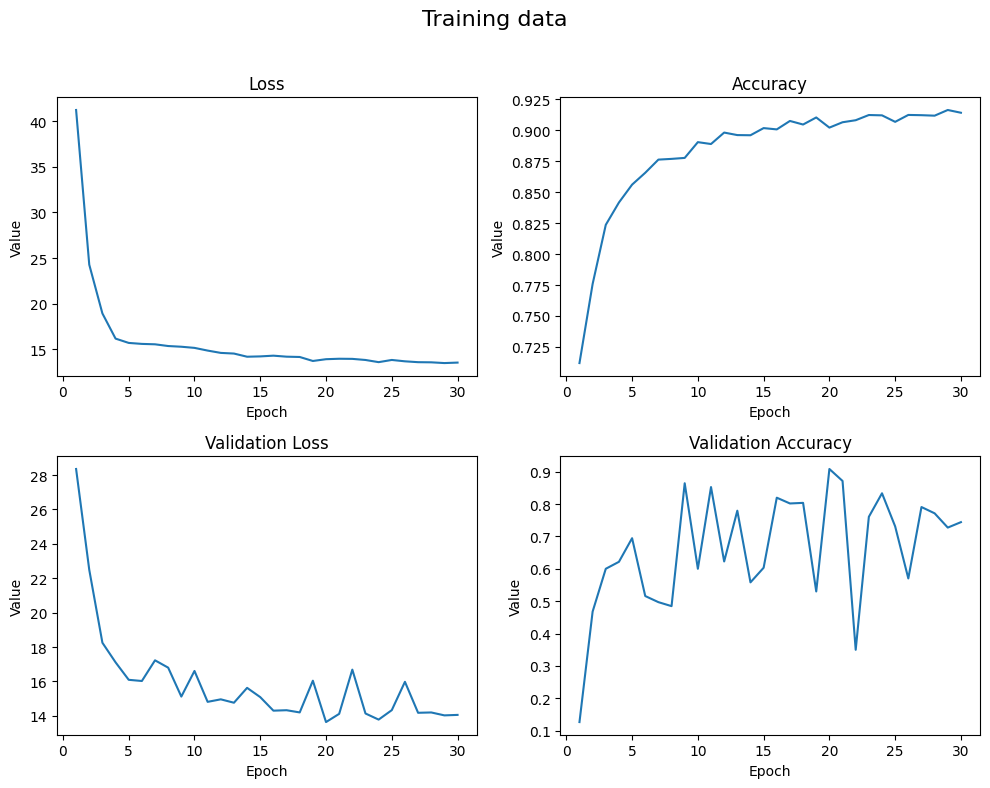

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

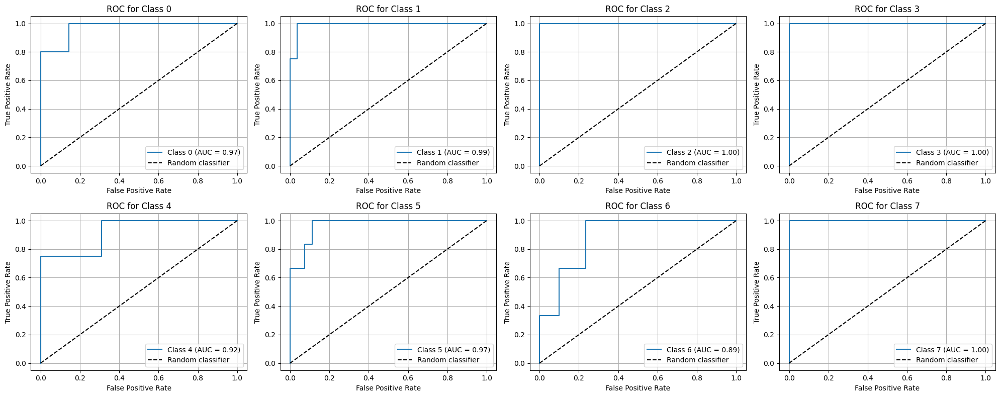

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

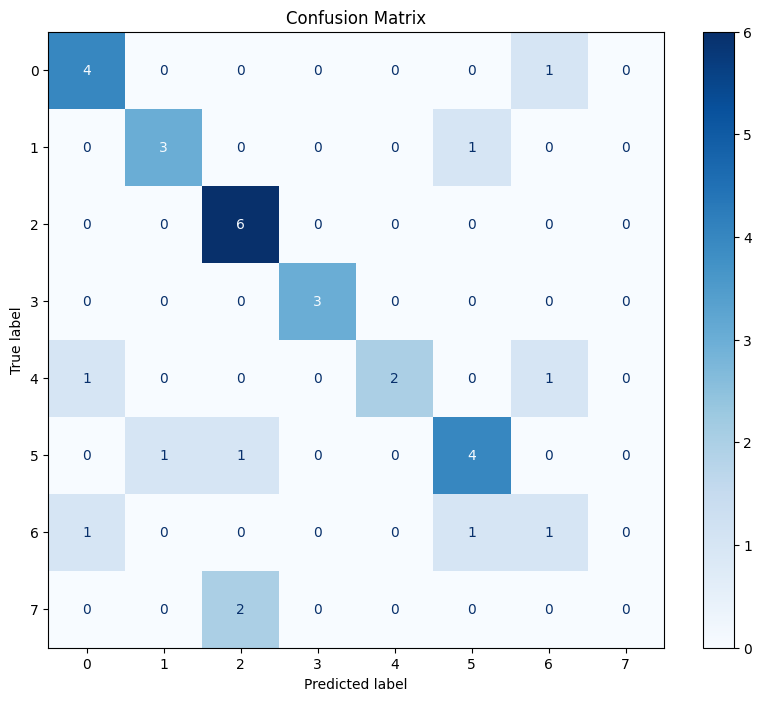

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.696969696969697


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.67      0.80      0.73         5
           1       0.75      0.75      0.75         4
           2       0.67      1.00      0.80         6
           3       1.00      1.00      1.00         3
           4       1.00      0.50      0.67         4
           5       0.67      0.67      0.67         6
           6       0.33      0.33      0.33         3
           7       0.00      0.00      0.00         2

    accuracy                           0.70        33
   macro avg       0.64      0.63      0.62        33
weighted avg       0.68      0.70      0.67        33



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model elasticnet (l1 = 0.01; l2 = 0.01)

In [ ]:
inputs = Input(shape=X_train.shape[1:])
x = Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01))(inputs)
x = MaxPool2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01))(x)
x = MaxPool2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01))(x)
x = MaxPool2D((2, 2))(x)

x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=l1_l2(l1=0.01, l2=0.01))(x)
outputs = Dense(len(np.unique(y_train)), activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_20 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_49 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_49 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_50 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_50 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_51 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_51 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_20 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_40 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_41 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,169,992 (42.61 MB)

 Trainable params: 11,169,992 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

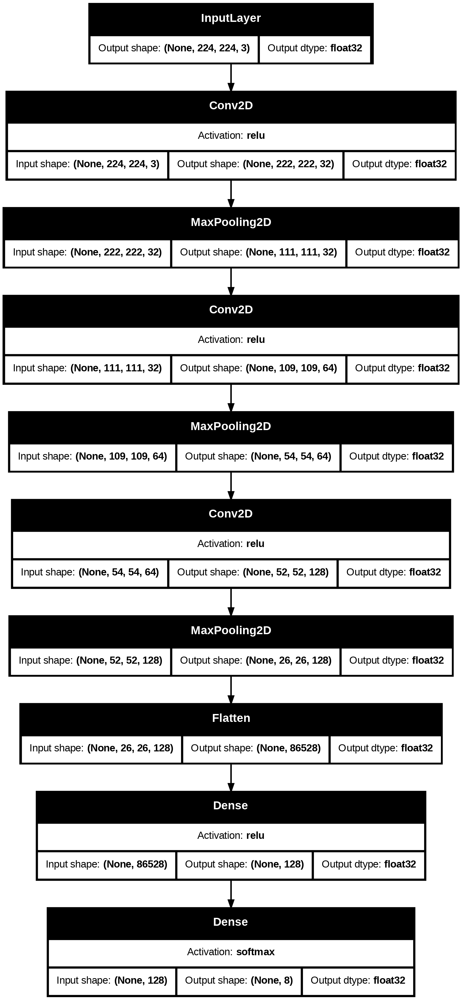

In [ ]:
try:
    plot_model(model, 'model2_l1_l2.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_l1_l2.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10,
                                                  restore_best_weights=True, verbose=1)

epochs = 100
batch_size = 32

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - accuracy: 0.1322 - loss: 48.8587 - val_accuracy: 0.1322 - val_loss: 15.6786
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1289 - loss: 15.9459 - val_accuracy: 0.1322 - val_loss: 16.0773
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1349 - loss: 15.8347 - val_accuracy: 0.1322 - val_loss: 15.7379
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1370 - loss: 15.9405 - val_accuracy: 0.1322 - val_loss: 16.1349
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1279 - loss: 16.1429 - val_accuracy: 0.1322 - val_loss: 16.3105
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1326 - loss: 16.4110 - val_accuracy: 0.1322 - val_loss: 16.3836
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1326 - loss: 16.4221 - val_accuracy: 0.1322 - val_loss: 16.4775
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1283 - 

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_l1_l2 - loss: {loss}, accuracy: {acc}')

model2_l1_l2 - loss: 15.678484916687012, accuracy: 0.09090909361839294


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[23.57914924621582,
 15.872177124023438,
 15.886093139648438,
 15.965682029724121,
 16.246292114257812,
 16.41574478149414,
 16.424137115478516,
 16.43330955505371,
 16.436901092529297,
 16.436120986938477,
 16.436777114868164]

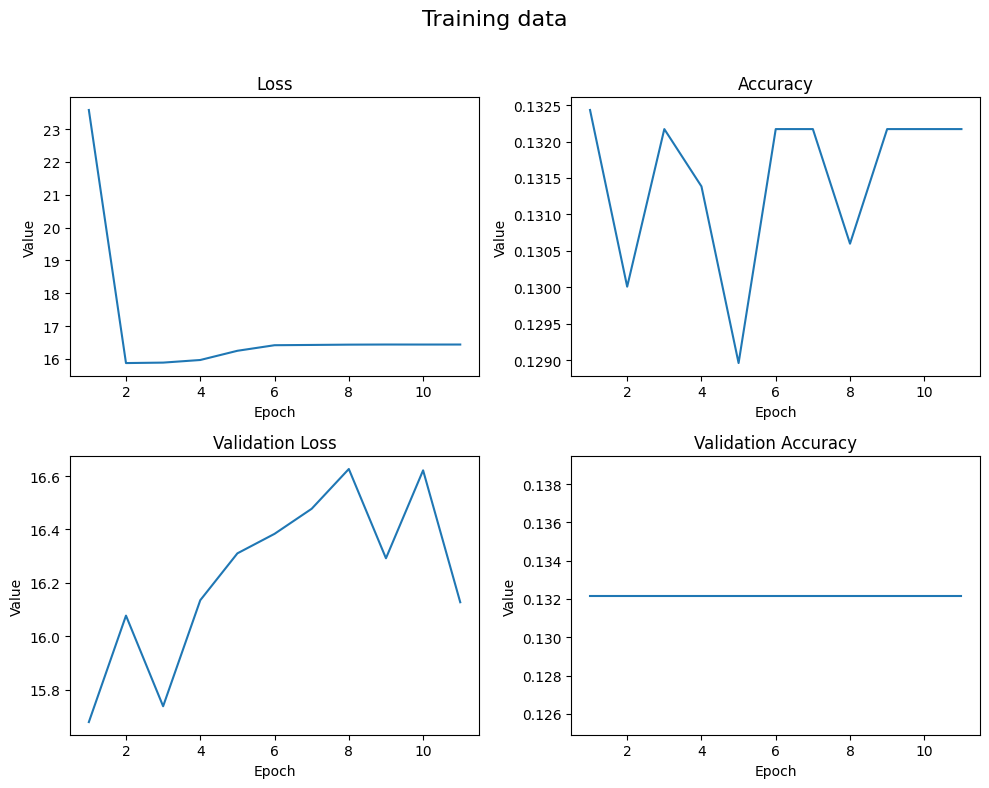

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

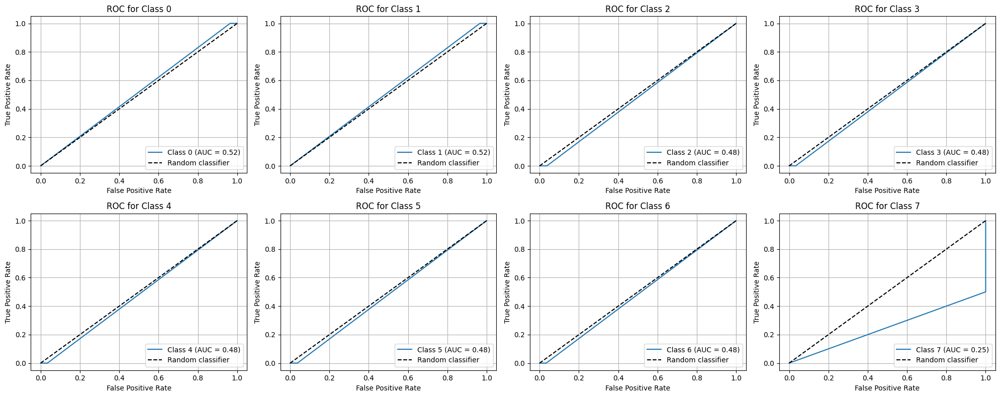

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

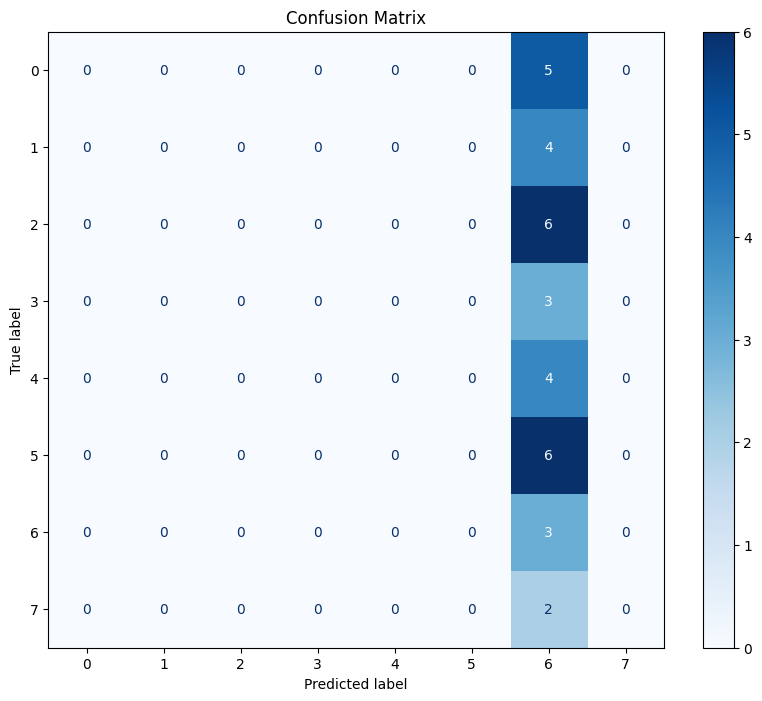

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.09090909090909091


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         6
           6       0.09      1.00      0.17         3
           7       0.00      0.00      0.00         2

    accuracy                           0.09        33
   macro avg       0.01      0.12      0.02        33
weighted avg       0.01      0.09      0.02        33



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Model batchnormalization; dropout = 0.03;

In [ ]:
inputs = Input(shape=X_train.shape[1:])
x = Conv2D(32, (3, 3), activation='relu')(inputs)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)
x = Conv2D(64, (3, 3), activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)
x = Conv2D(128, (3, 3), activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPool2D((2, 2))(x)
x = Dropout(0.3)(x)

x = Flatten()(x)
x = Dense(128, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
outputs = Dense(len(np.unique(y_train)), activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_21 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_52 (Conv2D)                   │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 222, 222, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_52 (MaxPooling2D)      │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_24 (Dropout)                 │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_53 (Conv2D)                   │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 109, 109, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_53 (MaxPooling2D)      │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_25 (Dropout)                 │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_54 (Conv2D)                   │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 52, 52, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_54 (MaxPooling2D)      │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_26 (Dropout)                 │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_21 (Flatten)                 │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_42 (Dense)                     │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_27 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_43 (Dense)                     │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,171,400 (42.62 MB)

 Trainable params: 11,170,696 (42.61 MB)

 Non-trainable params: 704 (2.75 KB)

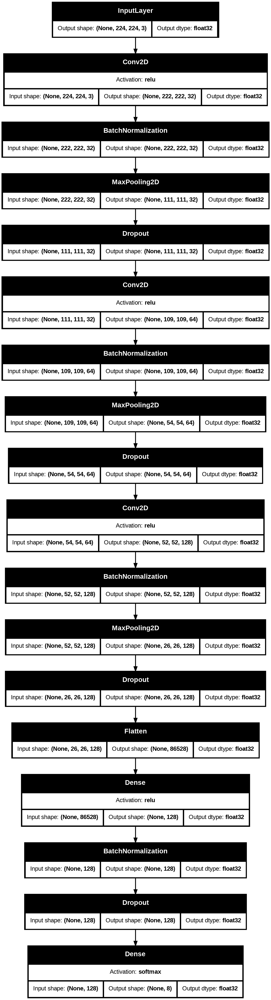

In [ ]:
try:
    plot_model(model, 'model2_dropout_batchnorm.png', show_dtype=True, show_shapes=True, show_layer_activations=True)
    display(Image('model2_dropout_batchnorm.png'))
except Exception as e:
    print(f'Error occurred: {e}')

In [ ]:
%%time

history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid),
                      callbacks=[early_stopping], epochs=epochs, batch_size=batch_size)

Epoch 1/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - accuracy: 0.8449 - loss: 0.4956 - val_accuracy: 0.6142 - val_loss: 1.6693
Epoch 2/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9645 - loss: 0.1070 - val_accuracy: 0.8686 - val_loss: 0.3708
Epoch 3/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9765 - loss: 0.0767 - val_accuracy: 0.9321 - val_loss: 0.1859
Epoch 4/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9853 - loss: 0.0502 - val_accuracy: 0.8975 - val_loss: 0.3332
Epoch 5/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9812 - loss: 0.0589 - val_accuracy: 0.8106 - val_loss: 0.8029
Epoch 6/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9890 - loss: 0.0363 - val_accuracy: 0.9892 - val_loss: 0.0346
Epoch 7/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9917 - loss: 0.0245 - val_accuracy: 0.9549 - val_loss: 0.1509
Epoch 8/100
477/477 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9949 - loss: 0.0167 -

In [ ]:
loss, acc = model.evaluate(X_test, y_test, verbose=0, batch_size=batch_size)
print(f'model2_dropout_batchnorm - loss: {loss}, accuracy: {acc}')

model2_dropout_batchnorm - loss: 0.443266361951828, accuracy: 0.9090909361839294


In [ ]:
training_data = history.history

In [ ]:
training_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
training_data['loss']

[0.2914532423019409,
 0.10858872532844543,
 0.0744771957397461,
 0.06125727668404579,
 0.051759637892246246,
 0.03982103615999222,
 0.025227556005120277,
 0.022809132933616638,
 0.024740178138017654,
 0.0296644177287817,
 0.022884167730808258,
 0.023950397968292236,
 0.017275942489504814,
 0.015435774810612202,
 0.01733723282814026,
 0.012642585672438145]

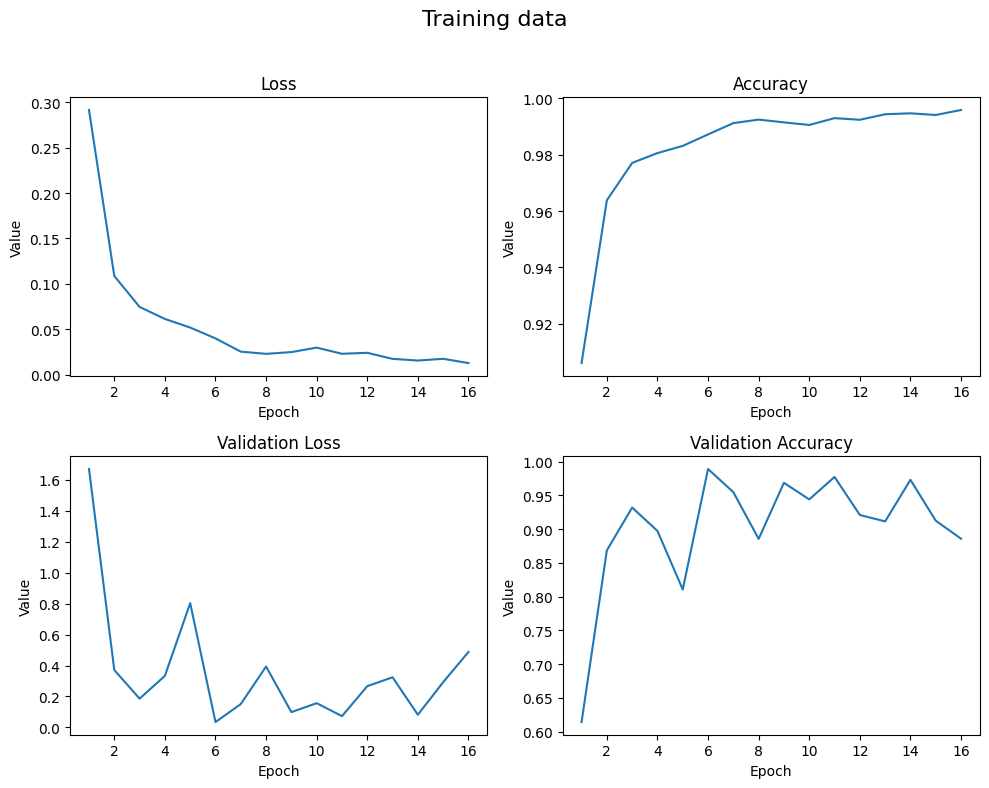

In [ ]:
epochs_range = [i+1 for i in range(len(training_data['loss']))]

fig, axes = plt.subplots(2, 2)

fig.suptitle('Training data', fontsize=16)
fig.set_size_inches(10, 8)

axes[0, 0].plot(epochs_range, training_data['loss'])
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Value')

axes[0, 1].plot(epochs_range, training_data['accuracy'])
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Value')

axes[1, 0].plot(epochs_range, training_data['val_loss'])
axes[1, 0].set_title('Validation Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Value')

axes[1, 1].plot(epochs_range, training_data['val_accuracy'])
axes[1, 1].set_title('Validation Accuracy')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Value')

fig.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [ ]:
y_pred_proba = model.predict(X_test, verbose=0, batch_size=batch_size)
y_pred = np.argmax(y_pred_proba, axis=1)

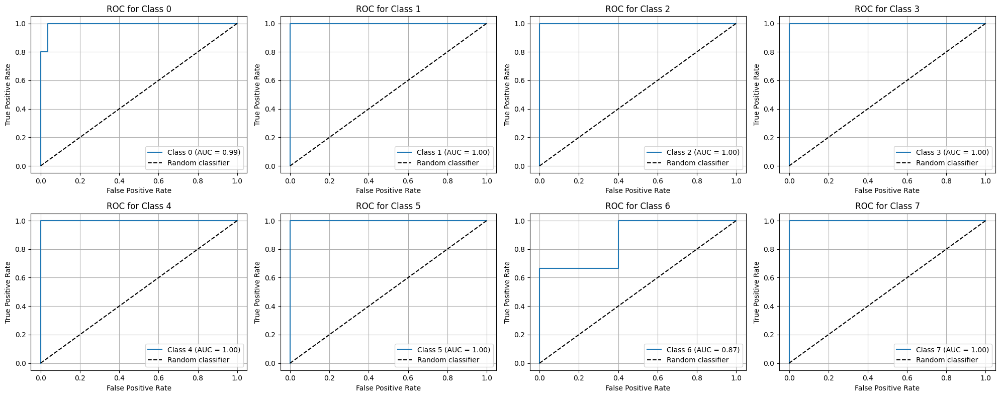

In [ ]:
n_classes = y_pred_proba.shape[1]
n_cols = 4
n_rows = int(np.ceil(n_classes / n_cols))
y_test_binarized = label_binarize(y_test, classes=np.arange(n_classes))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))

axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    ax.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    ax.plot([0, 1], [0, 1], 'k--', label='Random classifier')
    ax.set_title(f'ROC for Class {i}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc='lower right')
    ax.grid()

for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

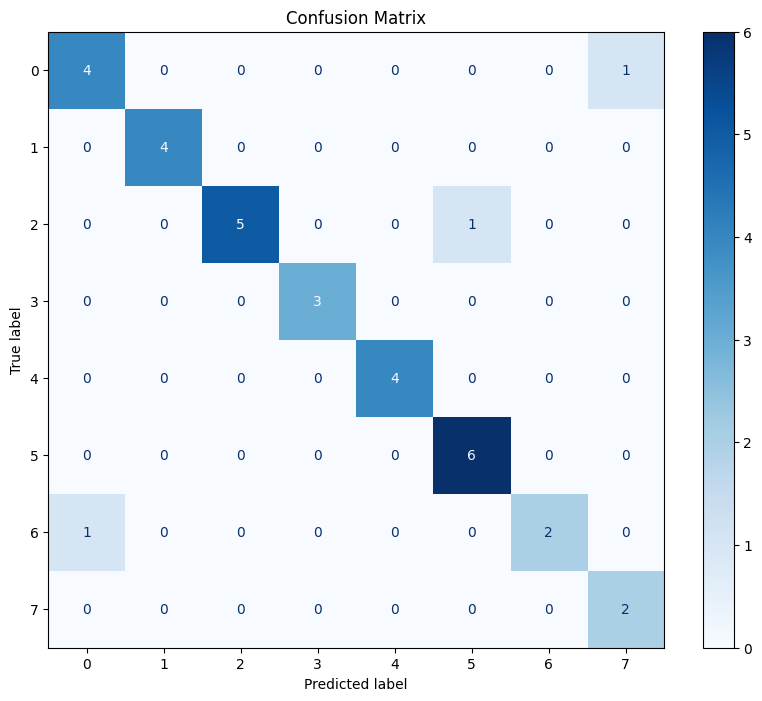

In [ ]:
cm = confusion_matrix(y_test, y_pred)
fig = plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(cm)
disp.plot(cmap='Blues', colorbar=True, ax=fig.gca())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.9090909090909091


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.80      0.80         5
           1       1.00      1.00      1.00         4
           2       1.00      0.83      0.91         6
           3       1.00      1.00      1.00         3
           4       1.00      1.00      1.00         4
           5       0.86      1.00      0.92         6
           6       1.00      0.67      0.80         3
           7       0.67      1.00      0.80         2

    accuracy                           0.91        33
   macro avg       0.92      0.91      0.90        33
weighted avg       0.92      0.91      0.91        33

